# CREDIT EDA ASSIGNMENT

## Introduction

This case study deals with how data is used to minimise the risk of losing money while lending to customers.

## Business Objectives

This case study aims to identify patterns which indicate if a client has difficulty paying their instalments which may be used for taking actions such as denying the loan, reducing the amount of loan, lending (to risky applicants) at a higher interest rate, etc. This will ensure that the consumers capable of repaying the loan are not rejected. Identification of such applicants using EDA is the aim of this case study

## Datasets

There are three kinds of datasets we will come across in this case study:
1. 'application_data.csv'  contains all the information of the client at the time of application.The data is about whether a client has payment difficulties.

2. 'previous_application.csv' contains information about the client’s previous loan data. It contains the data on whether the previous application had been Approved, Cancelled, Refused or Unused offer.

3. 'columns_description.csv' is data dictionary which describes the meaning of the variables.

## Importing all the libraries

In [1]:
# Filtering out the warnings
import warnings 
warnings.filterwarnings("ignore")

In [2]:
#Importing other important libraries required for analysis

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline


## Application Data


### Data Understanding

In [3]:
# Reading the dataset
app_data=pd.read_csv("application_data.csv")

In [4]:
app_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [5]:
app_data.tail()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
307510,456255,0,Cash loans,F,N,N,0,157500.0,675000.0,49117.5,...,0,0,0,0,0.0,0.0,0.0,2.0,0.0,1.0


In [6]:
#Number of rows and columns can be found using shape
app_data.shape

(307511, 122)

In [7]:
#Checking the data types of columns
app_data.info()
# In order to get detailed and comprehensive summary we can use verbose=True as parameter
app_data.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Dtype  
---   ------                        -----  
 0    SK_ID_CURR                    int64  
 1    TARGET                        int64  
 2    NAME_CONTRACT_TYPE            object 
 3    CODE_GENDER                   object 
 4    FLAG_OWN_CAR                  object 
 5    FLAG_OWN_REALTY               object 
 6    CNT_CHILDREN                  int64  
 7    AMT_INCOME_TOTAL              float64
 8    AMT_CREDIT                    float64
 9    AMT_ANNUITY                   float64
 10   AMT_GOODS_PRICE               float64
 11   NAME_TYPE_SUITE               object 
 12   NAME_INCOME_TYPE              object 
 13   NAME_EDUCATION

From the above summary, we can see that data types are correct for all the columns hence no need to convert any data types or no analysis required on data type irregularities. Hence, no typecasting required

In [8]:
# To find statistical summary of the dataset we can use describe as below
app_data.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


## Data Cleaning

### Dealing with the missing values in all the columns

In [9]:
Null_values=app_data.isnull().sum()[app_data.isnull().sum()>0]
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
Null_values

AMT_ANNUITY                         12
AMT_GOODS_PRICE                    278
NAME_TYPE_SUITE                   1292
OWN_CAR_AGE                     202929
OCCUPATION_TYPE                  96391
CNT_FAM_MEMBERS                      2
EXT_SOURCE_1                    173378
EXT_SOURCE_2                       660
EXT_SOURCE_3                     60965
APARTMENTS_AVG                  156061
BASEMENTAREA_AVG                179943
YEARS_BEGINEXPLUATATION_AVG     150007
YEARS_BUILD_AVG                 204488
COMMONAREA_AVG                  214865
ELEVATORS_AVG                   163891
ENTRANCES_AVG                   154828
FLOORSMAX_AVG                   153020
FLOORSMIN_AVG                   208642
LANDAREA_AVG                    182590
LIVINGAPARTMENTS_AVG            210199
LIVINGAREA_AVG                  154350
NONLIVINGAPARTMENTS_AVG         213514
NONLIVINGAREA_AVG               169682
APARTMENTS_MODE                 156061
BASEMENTAREA_MODE               179943
YEARS_BEGINEXPLUATATION_M

In [10]:
Null_values.count()

67

We can see that there are 67 columns having missing values, we will either impute it with required parameters or else we can remove the columns/rows if percentage of null values>40 percent

In [11]:
#Finding percentage of null values
percent_value=app_data.isnull().sum()/len(app_data)*100
percent_value

SK_ID_CURR                       0.000000
TARGET                           0.000000
NAME_CONTRACT_TYPE               0.000000
CODE_GENDER                      0.000000
FLAG_OWN_CAR                     0.000000
FLAG_OWN_REALTY                  0.000000
CNT_CHILDREN                     0.000000
AMT_INCOME_TOTAL                 0.000000
AMT_CREDIT                       0.000000
AMT_ANNUITY                      0.003902
AMT_GOODS_PRICE                  0.090403
NAME_TYPE_SUITE                  0.420148
NAME_INCOME_TYPE                 0.000000
NAME_EDUCATION_TYPE              0.000000
NAME_FAMILY_STATUS               0.000000
NAME_HOUSING_TYPE                0.000000
REGION_POPULATION_RELATIVE       0.000000
DAYS_BIRTH                       0.000000
DAYS_EMPLOYED                    0.000000
DAYS_REGISTRATION                0.000000
DAYS_ID_PUBLISH                  0.000000
OWN_CAR_AGE                     65.990810
FLAG_MOBIL                       0.000000
FLAG_EMP_PHONE                   0

In [12]:
# Number of columns having missing values greater than 40 percentage
percent_value[percent_value>=40].count()

49

In [13]:
#Storing the index of columns that needs to dropped in a variable
col_to_drop=percent_value[percent_value>=40].index
col_to_drop

Index(['OWN_CAR_AGE', 'EXT_SOURCE_1', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG',
       'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG',
       'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG',
       'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG',
       'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE',
       'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE',
       'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE',
       'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE',
       'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE',
       'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI',
       'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'ELEVATORS_MEDI',
       'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'FLOORSMIN_MEDI', 'LANDAREA_MEDI',
       'LIVINGAPARTMENTS_MEDI', 'LIVINGAREA_MEDI', 'NONLIVINGAPARTMENTS_MEDI',
       'NONLIVINGAREA_MEDI', 'FO

In [14]:
#Dropping the columns having null values greater than 40%
app_data = app_data.drop(columns=col_to_drop)
app_data.shape

(307511, 73)

In [15]:
impute_req=app_data.isnull().sum()[app_data.isnull().sum()>0]
impute_req

AMT_ANNUITY                      12
AMT_GOODS_PRICE                 278
NAME_TYPE_SUITE                1292
OCCUPATION_TYPE               96391
CNT_FAM_MEMBERS                   2
EXT_SOURCE_2                    660
EXT_SOURCE_3                  60965
OBS_30_CNT_SOCIAL_CIRCLE       1021
DEF_30_CNT_SOCIAL_CIRCLE       1021
OBS_60_CNT_SOCIAL_CIRCLE       1021
DEF_60_CNT_SOCIAL_CIRCLE       1021
DAYS_LAST_PHONE_CHANGE            1
AMT_REQ_CREDIT_BUREAU_HOUR    41519
AMT_REQ_CREDIT_BUREAU_DAY     41519
AMT_REQ_CREDIT_BUREAU_WEEK    41519
AMT_REQ_CREDIT_BUREAU_MON     41519
AMT_REQ_CREDIT_BUREAU_QRT     41519
AMT_REQ_CREDIT_BUREAU_YEAR    41519
dtype: int64

## Handling missing values

### 1)AMT_ANNUITY 

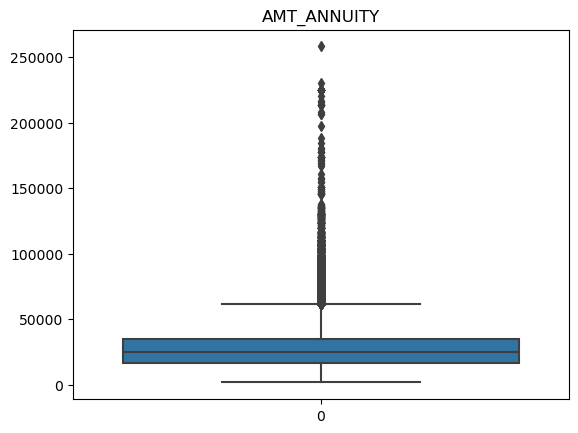

In [16]:

## AMT_ANNUITY is NUMERICAL type hence, we need to impute either mean or median. Median being the better option in case if any 
##outliers are there

app_data[app_data["AMT_ANNUITY"].isnull()]

sns.boxplot(app_data.AMT_ANNUITY)
plt.title("AMT_ANNUITY")
plt.show()

In [17]:
app_data[app_data["AMT_ANNUITY"].isnull()]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
47531,155054,0,Cash loans,M,N,N,0,180000.0,450000.0,NaN,450000.0,Unaccompanied,Commercial associate,Incomplete higher,Single / not married,House / apartment,0.026392,-10668,-2523,-4946.0,-3238,1,1,1,1,1,0,High skill tech staff,1.0,2,2,WEDNESDAY,13,0,0,0,0,0,0,Business Entity Type 3,0.626896,0.372334,1.0,0.0,1.0,0.0,-2.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0
50035,157917,0,Cash loans,F,N,N,0,94500.0,450000.0,NaN,450000.0,Unaccompanied,Working,Lower secondary,Civil marriage,House / apartment,0.035792,-9027,-1270,-3640.0,-741,1,1,1,1,0,0,Laborers,2.0,2,2,MONDAY,20,0,0,0,0,0,0,Business Entity Type 1,0.727274,0.468660,0.0,0.0,0.0,0.0,-706.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0,0.0,1.0
51594,159744,0,Cash loans,F,N,N,0,202500.0,539100.0,NaN,450000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.046220,-17376,-3950,-11524.0,-831,1,1,0,1,0,0,Cooking staff,2.0,1,1,WEDNESDAY,15,0,0,0,1,1,1,Self-employed,0.738370,0.452534,1.0,0.0,1.0,0.0,-199.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0,0.0,1.0
55025,163757,0,Cash loans,F,N,N,0,162000.0,296280.0,NaN,225000.0,Unaccompanied,State servant,Higher education,Married,House / apartment,0.035792,-11329,-2040,-3195.0,-3069,1,1,0,1,0,0,Core staff,2.0,2,2,FRIDAY,13,0,0,0,1,1,1,Government,0.566316,0.220095,0.0,0.0,0.0,0.0,-2841.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0,0.0,4.0
59934,169487,0,Cash loans,M,Y,N,0,202500.0,360000.0,NaN,360000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.046220,-19762,-2498,-11285.0,-3305,1,1,1,1,1,0,Laborers,1.0,1,1,FRIDAY,15,0,1,1,0,1,1,Other,0.583947,0.177704,0.0,0.0,0.0,0.0,-743.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,1.0,0.0,0.0,6.0
75873,187985,0,Cash loans,M,Y,N,0,144000.0,219249.0,NaN,166500.0,Unaccompanied,Working,Higher education,Single / not married,Rented apartment,0.022800,-20831,-2450,-771.0,-4203,1,1,0,1,0,0,Drivers,1.0,2,2,FRIDAY,15,0,0,0,0,0,0,Business Entity Type 3,0.667564,0.425893,0.0,0.0,0.0,0.0,-1986.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,11.0
89343,203726,0,Cash loans,F,Y,N,0,90000.0,157500.0,NaN,157500.0,Unaccompanied,State servant,Secondary / secondary special,Married,House / apartment,0.015221,-12134,-3721,-858.0,-591,1,1,0,1,1,0,Medicine staff,2.0,2,2,WEDNESDAY,11,0,0,0,0,0,0,Medicine,0.154811,0.297087,0.0,0.0,0.0,0.0,-348.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,2.0,0.0,0.0
123872,243648,0,Cash loans,F,N,Y,0,202500.0,929088.0,NaN,720000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0

Notes: Not imputing as mentioned in guidelines:
But we can impute using following code-
app_data["AMT_ANNUITY"]=app_data["AMT_ANNUITY"].fillna(app_data["AMT_ANNUITY"].median())

### 2)AMT_GOODS_PRICE

In [18]:
app_data["AMT_GOODS_PRICE"].head()

0     351000.0
1    1129500.0
2     135000.0
3     297000.0
4     513000.0
Name: AMT_GOODS_PRICE, dtype: float64

In [19]:
app_data["AMT_GOODS_PRICE"].value_counts()

450000.0     26022
225000.0     25282
675000.0     24962
900000.0     15416
270000.0     11428
180000.0     10123
454500.0      9157
1125000.0     9050
135000.0      8206
315000.0      5225
1350000.0     5037
679500.0      4824
238500.0      4696
360000.0      4553
247500.0      4318
463500.0      3873
540000.0      3763
495000.0      3463
202500.0      3222
90000.0       3169
405000.0      2954
472500.0      2828
157500.0      2704
585000.0      2647
337500.0      2501
229500.0      2438
112500.0      2170
630000.0      2164
1800000.0     2146
720000.0      1922
1575000.0     1875
688500.0      1824
292500.0      1708
148500.0      1674
477000.0      1611
810000.0      1568
67500.0       1505
697500.0      1408
382500.0      1396
765000.0      1396
904500.0      1375
283500.0      1372
252000.0      1368
234000.0      1279
45000.0       1169
945000.0      1161
855000.0      1113
1129500.0     1109
913500.0      1065
328500.0      1059
459000.0      1023
193500.0      1007
103500.0    

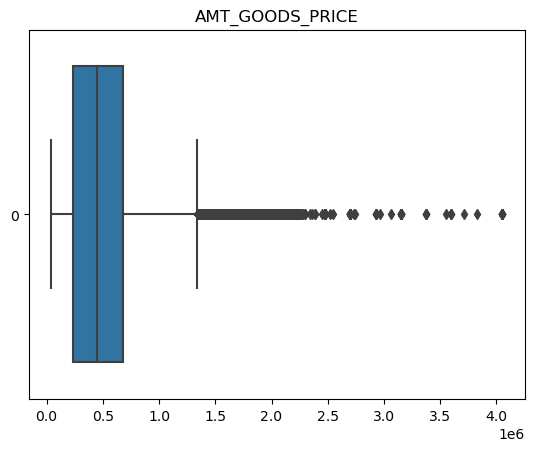

In [20]:
# We can check if this variable has an outliers using the box plot and hence impute either mean or median based on the results
sns.boxplot(data=app_data["AMT_GOODS_PRICE"],orient="horizontal")
plt.title("AMT_GOODS_PRICE")
plt.show()

NOTES: We can see that the variable is continuous and have outliers which can be imputed by median
app_data["AMT_GOODS_PRICE"]=app_data["AMT_GOODS_PRICE"].fillna(app_data["AMT_GOODS_PRICE"].median())


In [21]:
app_data[app_data["AMT_GOODS_PRICE"].isnull()]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
724,100837,0,Revolving loans,F,N,Y,2,45000.0,135000.0,6750.0,NaN,NaN,Commercial associate,Secondary / secondary special,Married,House / apartment,0.024610,-10072,-381,-519.0,-1834,1,1,1,1,0,0,Core staff,4.0,2,2,WEDNESDAY,14,0,0,0,0,0,0,Kindergarten,0.378174,NaN,2.0,1.0,2.0,1.0,-2011.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
5937,106955,0,Revolving loans,F,N,N,0,157500.0,450000.0,22500.0,NaN,NaN,Working,Secondary / secondary special,Married,House / apartment,0.010006,-11993,-2921,-1289.0,-1948,1,1,1,1,1,1,Private service staff,2.0,2,2,SATURDAY,13,0,0,0,0,0,0,Business Entity Type 3,0.464614,0.537070,0.0,0.0,0.0,0.0,-476.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
6425,107494,0,Revolving loans,F,N,N,0,67500.0,202500.0,10125.0,NaN,NaN,Working,Higher education,Married,House / apartment,0.008474,-9727,-2712,-4132.0,-800,1,1,1,1,1,0,Accountants,2.0,2,2,WEDNESDAY,18,0,0,0,0,0,0,Trade: type 7,0.565849,NaN,1.0,1.0,1.0,0.0,-643.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
6703,107822,0,Revolving loans,F,N,N,1,121500.0,180000.0,9000.0,NaN,NaN,Working,Secondary / secondary special,Civil marriage,House / apartment,0.011657,-11079,-899,-3765.0,-572,1,1,1,1,1,0,Managers,3.0,1,1,WEDNESDAY,11,0,0,0,0,0,0,Government,0.645519,0.863363,1.0,0.0,1.0,0.0,-1292.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
7647,108913,0,Revolving loans,M,N,Y,0,180000.0,450000.0,22500.0,NaN,NaN,Working,Higher education,Single / not married,House / apartment,0.032561,-9986,-1847,-4762.0,-506,1,1,1,1,1,0,Security staff,1.0,1,1,SATURDAY,18,0,0,0,0,0,0,Construction,0.552557,0.661024,1.0,0.0,1.0,0.0,-159.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
7880,109190,1,Revolving loans,F,N,N,0,121500.0,270000.0,13500.0,NaN,NaN,Working,Higher education,Single / not married,With parents,0.006296,-12390,-640,-6365.0,-3597,1,1,0,1,1,0,Managers,1.0,3,3,FRIDAY,16,0,0,0,0,0,0,Business Entity Type 3,0.407925,0.240541,2.0,0.0,1.0,0.0,-158.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
7995,109322,0,Revolving loans,M,N,Y,0,112500.0,180000.0,9000.0,NaN,NaN,Working,Secondary / secondary special,Single / not married,House / apartment,0.008230,-12420,-1610,-6443.0,-2463,1,1,0,1,1,0,Security staff,1.0,2,2,THURSDAY,16,0,1,1,1,1,1,Security,0.078597,0.504681,3.0,0.0,3.0,0.0,-2.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,2.0,3.0
10819,112595,0,Revolving loans,F,N,Y,0,90000.0,270000.0,13500.0,NaN,NaN,Working,Secondary / secondary special,Married,House / apartment,0.022800,-18193,-242,-1462.0,-1731,1,1,1,1,1,0,NaN,2.0,2,2,SUNDAY,15,0,0,0,0,0,0

### 3)NAME_TYPE_SUITE

In [22]:
app_data["NAME_TYPE_SUITE"].value_counts()

Unaccompanied      248526
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64

NOTES: This is a categorical variable which can be imputed by mode . From the data , we can see the highest number of data has "NAME_TYPE_SUITE" as Unaccompanied (mode). Code can be as follows:
app_data["NAME_TYPE_SUITE"]=app_data["NAME_TYPE_SUITE"].fillna(app_data["NAME_TYPE_SUITE"].mode()[0])

### 4)OCCUPATION_TYPE

In [23]:
app_data.OCCUPATION_TYPE.value_counts()

Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: OCCUPATION_TYPE, dtype: int64

NOTES: This is a categorical variable which can be imputed by mode .
app_data["OCCUPATION_TYPE"]=app_data["OCCUPATION_TYPE"].fillna(app_data["OCCUPATION_TYPE"].mode()[0]).
However, this is not an important column and applicant may have skipped this question . Hence, we can leave NA as the values without imputing it..

### 5)CNT_FAM_MEMBERS

In [24]:
app_data[app_data["CNT_FAM_MEMBERS"].isnull()]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
41982,148605,0,Revolving loans,M,N,Y,0,450000.0,675000.0,33750.0,NaN,NaN,Commercial associate,Lower secondary,Unknown,Municipal apartment,0.015221,-12396,-1161,-3265.0,-4489,1,1,1,1,1,0,Managers,NaN,2,2,THURSDAY,15,0,1,1,0,1,1,Insurance,0.700618,NaN,3.0,0.0,3.0,0.0,-876.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
187348,317181,0,Revolving loans,F,N,Y,0,202500.0,585000.0,29250.0,NaN,NaN,Commercial associate,Higher education,Unknown,House / apartment,0.031329,-12844,-232,-1597.0,-1571,1,1,0,1,0,0,Accountants,NaN,2,2,FRIDAY,14,0,0,0,0,0,0,Business Entity Type 2,0.645168,0.670652,1.0,0.0,1.0,0.0,-654.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0


In [25]:
app_data["CNT_FAM_MEMBERS"].value_counts()

2.0     158357
1.0      67847
3.0      52601
4.0      24697
5.0       3478
6.0        408
7.0         81
8.0         20
9.0          6
10.0         3
14.0         2
12.0         2
20.0         2
16.0         2
13.0         1
15.0         1
11.0         1
Name: CNT_FAM_MEMBERS, dtype: int64

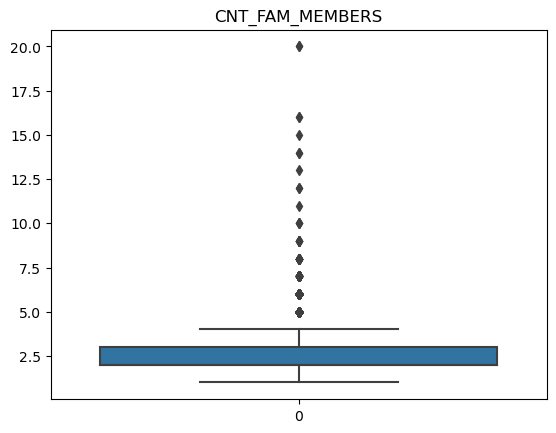

In [26]:
# This is numerical type , we can plot the boxplot and decide whether to take median or mean based on outliers
sns.boxplot(data=app_data.CNT_FAM_MEMBERS)
plt.title("CNT_FAM_MEMBERS")
plt.show()

Note:We have outliers, hence need to take median to replace null values
app_data["CNT_FAM_MEMBERS"]=app_data["CNT_FAM_MEMBERS"].fillna(app_data["CNT_FAM_MEMBERS"].median()

### 6) EXT_SOURCE_2

In [27]:
app_data[app_data["EXT_SOURCE_2"].isnull()]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
329,100377,0,Cash loans,M,N,N,2,157500.00,239850.0,25447.5,225000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.009549,-14252,-1281,-6024.0,-3427,1,1,1,1,0,0,High skill tech staff,4.0,2,2,TUESDAY,10,0,0,0,1,0,1,Business Entity Type 3,NaN,NaN,1.0,0.0,1.0,0.0,-344.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
349,100402,0,Cash loans,F,N,Y,0,81000.00,276277.5,21825.0,238500.0,Unaccompanied,Pensioner,Secondary / secondary special,Single / not married,Municipal apartment,0.005144,-19780,365243,-11248.0,-3331,1,0,0,1,0,0,NaN,1.0,2,2,MONDAY,15,0,0,0,0,0,0,XNA,NaN,NaN,1.0,0.0,1.0,0.0,-275.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
617,100706,0,Cash loans,F,N,Y,0,180000.00,533668.5,22738.5,477000.0,Unaccompanied,Pensioner,Secondary / secondary special,Single / not married,Municipal apartment,0.010500,-22460,365243,-1746.0,-4617,1,0,0,1,0,0,NaN,1.0,3,3,MONDAY,13,0,0,0,0,0,0,XNA,NaN,0.547810,1.0,1.0,1.0,1.0,-364.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
1028,101189,0,Cash loans,F,Y,Y,0,121500.00,909000.0,36180.0,909000.0,Unaccompanied,Pensioner,Secondary / secondary special,Married,House / apartment,0.028663,-21323,365243,-7795.0,-3988,1,0,0,1,0,0,NaN,2.0,2,2,TUESDAY,9,0,0,0,0,0,0,XNA,NaN,0.754406,2.0,0.0,2.0,0.0,-4.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,5.0
1520,101787,0,Cash loans,M,Y,Y,0,225000.00,269550.0,21294.0,225000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.072508,-18896,-460,-4387.0,-2447,1,1,0,1,0,0,Drivers,2.0,1,1,MONDAY,11,0,0,0,0,0,0,Transport: type 4,NaN,0.795803,2.0,0.0,2.0,0.0,-1868.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2098,102466,0,Cash loans,F,N,N,0,135000.00,432661.5,30240.0,373500.0,Unaccompanied,Working,Higher education,Single / not married,House / apartment,0.010032,-22457,-10505,-13710.0,-4082,1,1,0,1,0,0,Security staff,1.0,2,2,FRIDAY,4,0,0,0,0,0,0,School,NaN,0.810618,0.0,0.0,0.0,0.0,-1565.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,4.0
2426,102831,0,Cash loans,F,N,Y,0,49500.00,292500.0,12042.0,292500.0,Unaccompanied,Pensioner,Secondary / secondary special,Married,House / apartment,0.014520,-20731,365243,-2064.0,-3708,1,0,0,1,0,0,NaN,2.0,2,2,TUESDAY,10,0,0,0,0,0,0,XNA,NaN,0.466864,0.0,0.0,0.0,0.0,-1555.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
2448,102855,0,Cash loans,F,Y,Y,0,202500.00,912240.0,30145.5,787500.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.019101,-15273,-184,-9305.0,-349,1,1,0,1,0,0,Sales staff,2.0,2,2,MONDAY,14,0,0,0,0,0,0,

In [28]:
round(app_data["EXT_SOURCE_2"].describe(),2)

count    306851.00
mean          0.51
std           0.19
min           0.00
25%           0.39
50%           0.57
75%           0.66
max           0.85
Name: EXT_SOURCE_2, dtype: float64

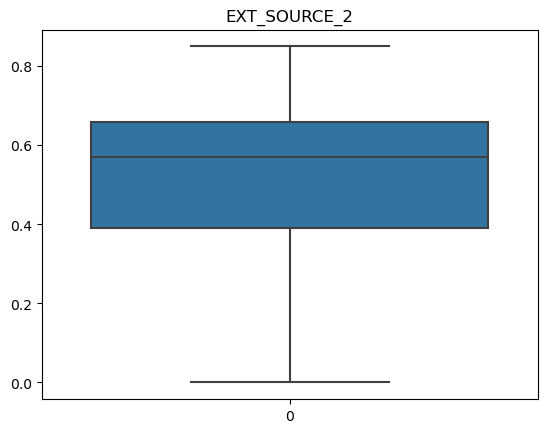

In [29]:
# Let's prepare the box plot to check if the data has an outlier
sns.boxplot(data=round(app_data["EXT_SOURCE_2"],2))
plt.title("EXT_SOURCE_2")
plt.show()

Note: The above plot concludes that the values has no outliers. Hence , we can impute the mean. 
app_data["EXT_SOURCE_2"]=app_data["EXT_SOURCE_2"].fillna(app_data["EXT_SOURCE_2"].mean()

### 7)EXT_SOURCE_3

In [30]:
app_data["EXT_SOURCE_3"].value_counts()

0.746300    1460
0.713631    1315
0.694093    1276
0.670652    1191
0.652897    1154
0.581484    1141
0.689479    1138
0.595456    1136
0.554947    1132
0.621226    1109
0.657784    1092
0.607557    1067
0.643026    1066
0.450747    1064
0.626304    1054
0.673830    1030
0.651260    1029
0.511892    1026
0.706205     992
0.553165     984
0.593718     978
0.634706     969
0.740799     961
0.681706     959
0.565608     956
0.728141     953
0.771362     947
0.576209     943
0.586740     942
0.656158     931
0.631355     929
0.484851     922
0.709189     919
0.665855     912
0.684828     911
0.538863     911
0.617826     907
0.591977     904
0.513694     895
0.683269     895
0.579727     895
0.000527     886
0.733815     880
0.619528     879
0.501075     879
0.508287     877
0.754406     874
0.712155     867
0.832785     865
0.558507     864
0.524496     860
0.633032     854
0.659406     850
0.812823     849
0.636376     848
0.680139     837
0.474051     837
0.647977     837
0.546023     8

In [31]:
round(app_data["EXT_SOURCE_3"].describe(),2)

count    246546.00
mean          0.51
std           0.19
min           0.00
25%           0.37
50%           0.54
75%           0.67
max           0.90
Name: EXT_SOURCE_3, dtype: float64

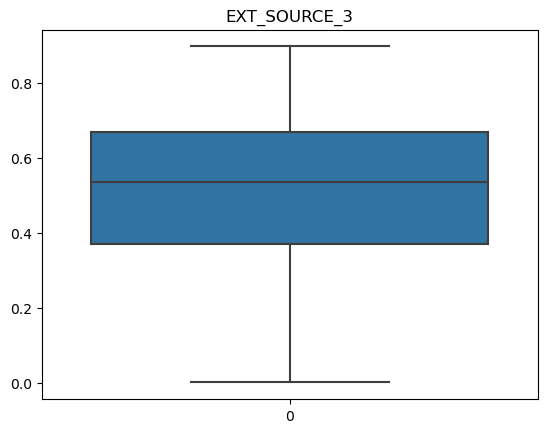

In [32]:
sns.boxplot(data=app_data.EXT_SOURCE_3)
plt.title("EXT_SOURCE_3")
plt.show()

Note: There is no outlier in above plot , hence we can impute the mean 
app_data["EXT_SOURCE_3"]=app_data["EXT_SOURCE_3"].fillna(app_data["EXT_SOURCE_3"].mean())

### 8) DAYS_LAST_PHONE_CHANGE

In [33]:
#Unusual patterns, such as frequent changes or changes shortly before applying for credit, may indicate a higher level of risk.
#Hence, can't drop this column
app_data[app_data["DAYS_LAST_PHONE_CHANGE"].isnull()]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
15709,118330,0,Cash loans,M,Y,Y,0,126000.0,278613.0,25911.0,252000.0,Unaccompanied,Working,Incomplete higher,Married,House / apartment,0.010643,-8574,-293,-4790.0,-1075,0,1,0,1,0,0,NaN,2.0,2,2,FRIDAY,13,0,0,0,0,0,0,Trade: type 3,NaN,NaN,0.0,0.0,0.0,0.0,NaN,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [34]:
app_data["DAYS_LAST_PHONE_CHANGE"].value_counts()
#Here, negative values indicate the number of dats passed since phone number has been changed.

 0.0       37672
-1.0        2812
-2.0        2318
-3.0        1763
-4.0        1285
-5.0         824
-6.0         537
-7.0         442
-8.0         278
-476.0       222
-352.0       213
-392.0       211
-364.0       209
-479.0       204
-358.0       203
-329.0       203
-293.0       202
-350.0       201
-441.0       200
-399.0       200
-404.0       199
-9.0         198
-463.0       198
-11.0        198
-301.0       197
-362.0       195
-304.0       195
-496.0       195
-308.0       195
-483.0       195
-500.0       194
-355.0       194
-427.0       193
-391.0       193
-334.0       193
-448.0       192
-347.0       192
-413.0       191
-415.0       191
-447.0       190
-469.0       190
-546.0       190
-499.0       189
-353.0       188
-566.0       188
-428.0       187
-420.0       187
-417.0       186
-315.0       186
-475.0       186
-574.0       186
-454.0       185
-511.0       185
-484.0       185
-296.0       185
-534.0       185
-509.0       184
-609.0       183
-291.0       1

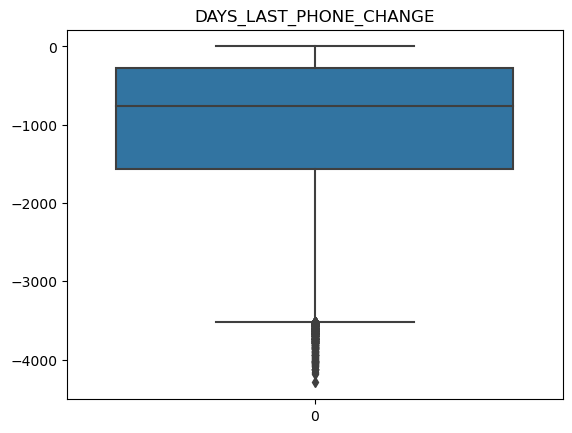

In [35]:
sns.boxplot(data=app_data["DAYS_LAST_PHONE_CHANGE"])
plt.title("DAYS_LAST_PHONE_CHANGE")
plt.show()

We can impute NA value with median. There are outliers. 
app_data["DAYS_LAST_PHONE_CHANGE"]=app_data["DAYS_LAST_PHONE_CHANGE"].fillna(app_data["DAYS_LAST_PHONE_CHANGE"].median()

<PRE>
Dropping these columns as it's not related to target variable and is not required for further analysis:

OBS_30_CNT_SOCIAL_CIRCLE
DEF_30_CNT_SOCIAL_CIRCLE
OBS_60_CNT_SOCIAL_CIRCLE
DEF_60_CNT_SOCIAL_CIRCLE


In [36]:
app_data.drop(columns=["OBS_30_CNT_SOCIAL_CIRCLE","DEF_30_CNT_SOCIAL_CIRCLE","OBS_60_CNT_SOCIAL_CIRCLE", "DEF_60_CNT_SOCIAL_CIRCLE"],axis=1,inplace=True)


In [37]:
app_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 69 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307511 non-null  int64  
 1   TARGET                       307511 non-null  int64  
 2   NAME_CONTRACT_TYPE           307511 non-null  object 
 3   CODE_GENDER                  307511 non-null  object 
 4   FLAG_OWN_CAR                 307511 non-null  object 
 5   FLAG_OWN_REALTY              307511 non-null  object 
 6   CNT_CHILDREN                 307511 non-null  int64  
 7   AMT_INCOME_TOTAL             307511 non-null  float64
 8   AMT_CREDIT                   307511 non-null  float64
 9   AMT_ANNUITY                  307499 non-null  float64
 10  AMT_GOODS_PRICE              307233 non-null  float64
 11  NAME_TYPE_SUITE              306219 non-null  object 
 12  NAME_INCOME_TYPE             307511 non-null  object 
 13 

#### AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR

Credit inquiries are typically made by lenders or creditors to assess the creditworthiness of an individual or entity applying for credit. The number of inquiries is an important factor in credit risk assessment, and it can have implications for the individual's credit score and creditworthiness.

In [38]:
app_data.AMT_REQ_CREDIT_BUREAU_HOUR.value_counts()

0.0    264366
1.0      1560
2.0        56
3.0         9
4.0         1
Name: AMT_REQ_CREDIT_BUREAU_HOUR, dtype: int64

In [39]:
app_data.AMT_REQ_CREDIT_BUREAU_DAY.value_counts()

0.0    264503
1.0      1292
2.0       106
3.0        45
4.0        26
5.0         9
6.0         8
9.0         2
8.0         1
Name: AMT_REQ_CREDIT_BUREAU_DAY, dtype: int64

In [40]:
app_data.AMT_REQ_CREDIT_BUREAU_MON.value_counts()

0.0     222233
1.0      33147
2.0       5386
3.0       1991
4.0       1076
5.0        602
6.0        343
7.0        298
9.0        206
8.0        185
10.0       132
11.0       119
12.0        77
13.0        72
14.0        40
15.0        35
16.0        23
17.0        14
18.0         6
19.0         3
24.0         1
23.0         1
27.0         1
22.0         1
Name: AMT_REQ_CREDIT_BUREAU_MON, dtype: int64

In [41]:
app_data.AMT_REQ_CREDIT_BUREAU_QRT.value_counts()

0.0      215417
1.0       33862
2.0       14412
3.0        1717
4.0         476
5.0          64
6.0          28
8.0           7
7.0           7
261.0         1
19.0          1
Name: AMT_REQ_CREDIT_BUREAU_QRT, dtype: int64

In [42]:
app_data.AMT_REQ_CREDIT_BUREAU_YEAR.value_counts()

0.0     71801
1.0     63405
2.0     50192
3.0     33628
4.0     20714
5.0     12052
6.0      6967
7.0      3869
8.0      2127
9.0      1096
11.0       31
12.0       30
10.0       22
13.0       19
14.0       10
17.0        7
15.0        6
19.0        4
18.0        4
16.0        3
25.0        1
23.0        1
22.0        1
21.0        1
20.0        1
Name: AMT_REQ_CREDIT_BUREAU_YEAR, dtype: int64

In [43]:
app_data.AMT_REQ_CREDIT_BUREAU_HOUR.describe()

count    265992.000000
mean          0.006402
std           0.083849
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           4.000000
Name: AMT_REQ_CREDIT_BUREAU_HOUR, dtype: float64

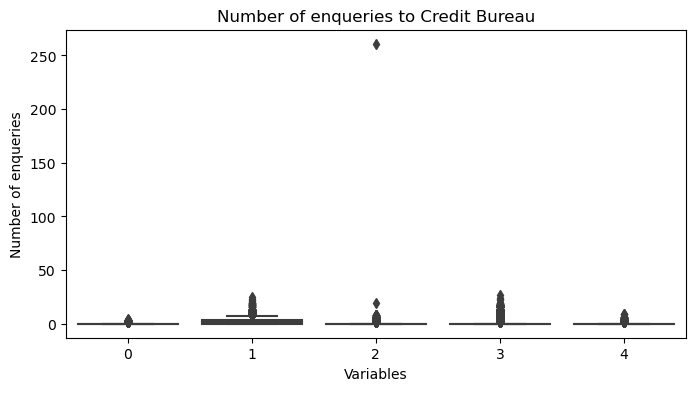

In [44]:
plt.figure(figsize=[8,4])
sns.boxplot([app_data.AMT_REQ_CREDIT_BUREAU_HOUR,app_data.AMT_REQ_CREDIT_BUREAU_YEAR,app_data.AMT_REQ_CREDIT_BUREAU_QRT,
           app_data.AMT_REQ_CREDIT_BUREAU_MON,app_data.AMT_REQ_CREDIT_BUREAU_DAY])
plt.xlabel("Variables\n")
plt.ylabel("Number of enqueries")
plt.title("Number of enqueries to Credit Bureau")
plt.show()

In all the above cases we can infere that mode is 0 , i.e. there were no inqueries done for them. Hence, we cam impute the values with 0 or mode here. The values are highly skewed, hence mean can be ignored.
Code:
for i in app_data.columns:

    if i.startswith("AMT_REQ_CREDIT"):

        app_data[i].fillna(value=(app_data[i].mode()[0]), inplace=True)


In [45]:
#Checking all columns  having Null values

app_data.columns[app_data.isnull().any()].tolist()

['AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'NAME_TYPE_SUITE',
 'OCCUPATION_TYPE',
 'CNT_FAM_MEMBERS',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'DAYS_LAST_PHONE_CHANGE',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR']

In [46]:
# Provided suggestions to impute for all the above columns. As, per the instructions haven't imputed them

## Univariate Analysis

### Categorical

In [47]:
app_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 69 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307511 non-null  int64  
 1   TARGET                       307511 non-null  int64  
 2   NAME_CONTRACT_TYPE           307511 non-null  object 
 3   CODE_GENDER                  307511 non-null  object 
 4   FLAG_OWN_CAR                 307511 non-null  object 
 5   FLAG_OWN_REALTY              307511 non-null  object 
 6   CNT_CHILDREN                 307511 non-null  int64  
 7   AMT_INCOME_TOTAL             307511 non-null  float64
 8   AMT_CREDIT                   307511 non-null  float64
 9   AMT_ANNUITY                  307499 non-null  float64
 10  AMT_GOODS_PRICE              307233 non-null  float64
 11  NAME_TYPE_SUITE              306219 non-null  object 
 12  NAME_INCOME_TYPE             307511 non-null  object 
 13 

In [48]:
# Finding the columns having object type- Categorical Analysis

obj_col=app_data.columns[app_data.dtypes=="object"]
obj_col

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE'],
      dtype='object')

### 🎯TARGET

Target variable (1 - client with payment difficulties, 0 - No payment Difficulties)
We can plot the bar chart to analyse the trend and then find the data imbalance.Imbalance is visually apparent when one or a few categories dominate the chart.


In [49]:
Percent_Target=app_data.TARGET.value_counts(normalize=True)
Percent_Target

0    0.919271
1    0.080729
Name: TARGET, dtype: float64

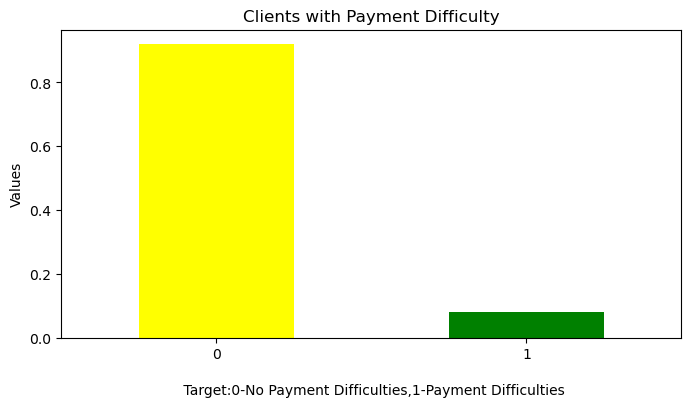

In [50]:
#Plotting Bar chart for TARGET variable
plt.figure(figsize=[8,4])
Percent_Target.plot.bar(color=["yellow","Green"])
plt.title("Clients with Payment Difficulty")
plt.xlabel("\n Target:0-No Payment Difficulties,1-Payment Difficulties")
plt.ylabel("Values")
plt.xticks(rotation=0)
plt.show()

From the plot and stats we can see that there is imbalance in data as "0" dominates the chart. Let's find the ration of data imbalance as suggested in problem statement.

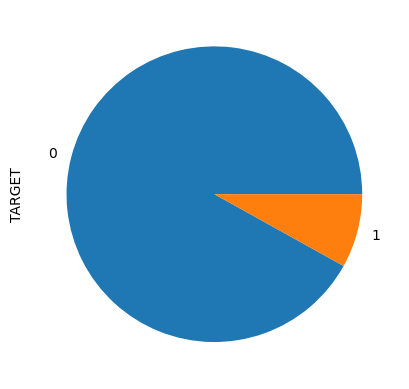

In [51]:
Percent_Target.plot.pie()
plt.show()

In [52]:
# Finding ratio of TARGET 0 to TARGET 1

T0=app_data[app_data.TARGET==0].shape[0]
T1=app_data[app_data.TARGET==1].shape[0]
Ratio=T0/T1
print("Ratio of Target 0 to Target 1 is:", Ratio)

Ratio of Target 0 to Target 1 is: 11.387150050352467


<p
🔭Observation: For every ~11 applicants ,1 applicants faces the payment difficulties.
                🗯️Data Imbalance Detected

#### Data Imbalance - 1

🔭From the above analysis we can conclude that out of every ~11 applicants , 1 applicant faces payment difficulties.T0 are non-defaulters and T1 are defaulters
<pre>
1.The imbalance ratio of 1:11 indicates applicants facing payment difficultythat is underrepresented compared to the applicants without payment difficulty. This ratio is commonly referred to as the class imbalance.

2.The imbalance in the target variable can significantly impact the performance of machine learning models, particularly if not addressed appropriately.

<pre>
😺Columns having dtype=Object as per the previous analysis are:
       ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE'],

Cash loans         0.904787
Revolving loans    0.095213
Name: NAME_CONTRACT_TYPE, dtype: float64


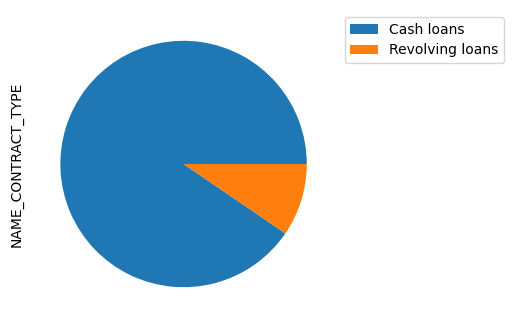

F      0.658344
M      0.341643
XNA    0.000013
Name: CODE_GENDER, dtype: float64


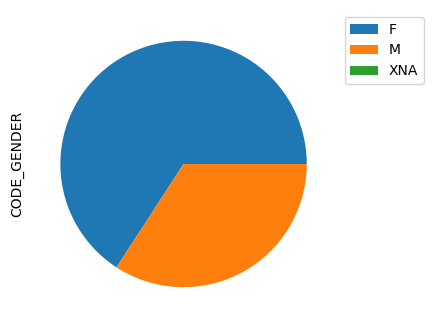

N    0.659892
Y    0.340108
Name: FLAG_OWN_CAR, dtype: float64


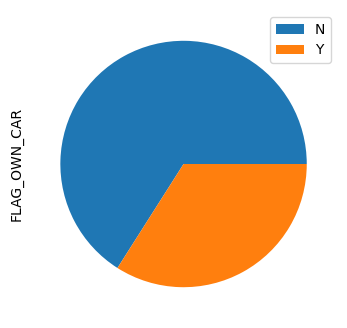

Y    0.693673
N    0.306327
Name: FLAG_OWN_REALTY, dtype: float64


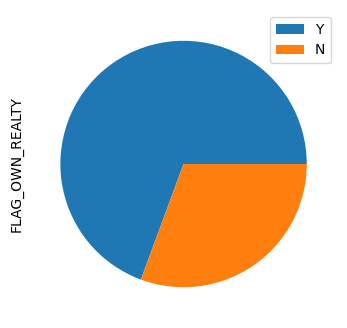

Unaccompanied      0.811596
Family             0.131112
Spouse, partner    0.037130
Children           0.010669
Other_B            0.005780
Other_A            0.002828
Group of people    0.000885
Name: NAME_TYPE_SUITE, dtype: float64


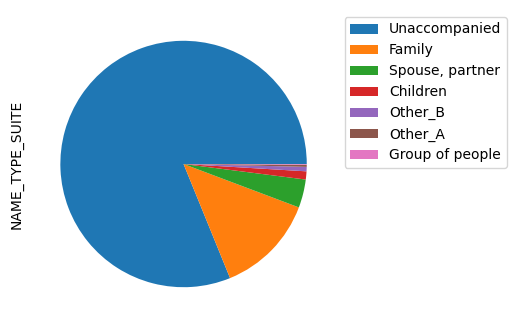

Working                 0.516320
Commercial associate    0.232892
Pensioner               0.180033
State servant           0.070576
Unemployed              0.000072
Student                 0.000059
Businessman             0.000033
Maternity leave         0.000016
Name: NAME_INCOME_TYPE, dtype: float64


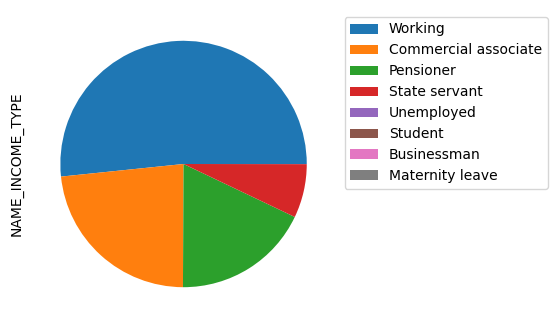

Secondary / secondary special    0.710189
Higher education                 0.243448
Incomplete higher                0.033420
Lower secondary                  0.012409
Academic degree                  0.000533
Name: NAME_EDUCATION_TYPE, dtype: float64


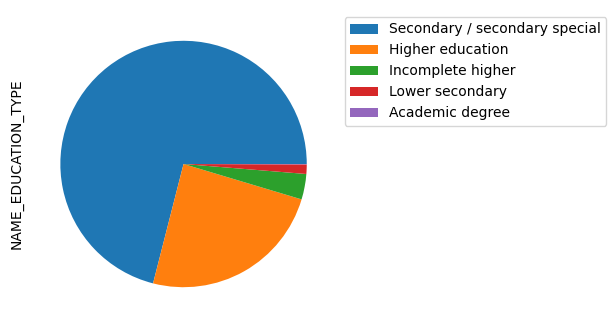

Married                 0.638780
Single / not married    0.147780
Civil marriage          0.096826
Separated               0.064290
Widow                   0.052317
Unknown                 0.000007
Name: NAME_FAMILY_STATUS, dtype: float64


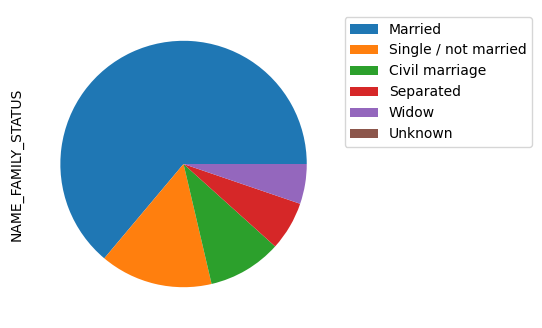

House / apartment      0.887344
With parents           0.048258
Municipal apartment    0.036366
Rented apartment       0.015873
Office apartment       0.008510
Co-op apartment        0.003649
Name: NAME_HOUSING_TYPE, dtype: float64


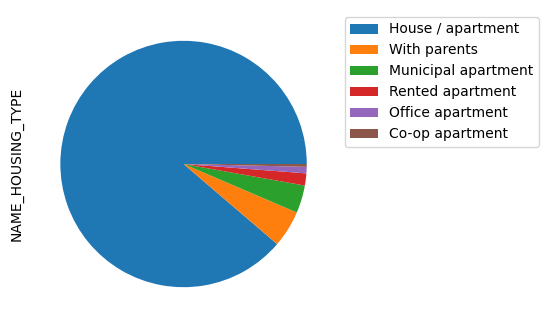

Laborers                 0.261396
Sales staff              0.152056
Core staff               0.130589
Managers                 0.101227
Drivers                  0.088116
High skill tech staff    0.053903
Accountants              0.046481
Medicine staff           0.040437
Security staff           0.031835
Cooking staff            0.028164
Cleaning staff           0.022040
Private service staff    0.012562
Low-skill Laborers       0.009914
Waiters/barmen staff     0.006385
Secretaries              0.006181
Realty agents            0.003557
HR staff                 0.002667
IT staff                 0.002491
Name: OCCUPATION_TYPE, dtype: float64


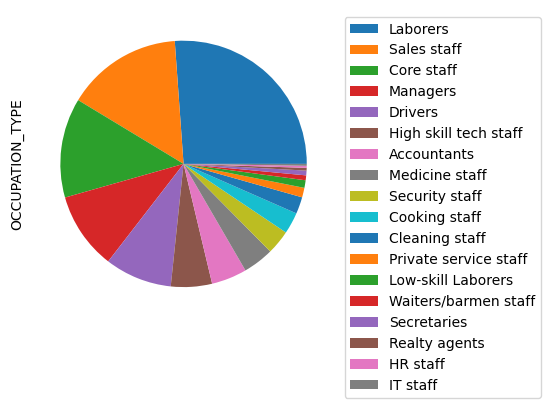

TUESDAY      0.175282
WEDNESDAY    0.168885
MONDAY       0.164918
THURSDAY     0.164518
FRIDAY       0.163695
SATURDAY     0.110084
SUNDAY       0.052619
Name: WEEKDAY_APPR_PROCESS_START, dtype: float64


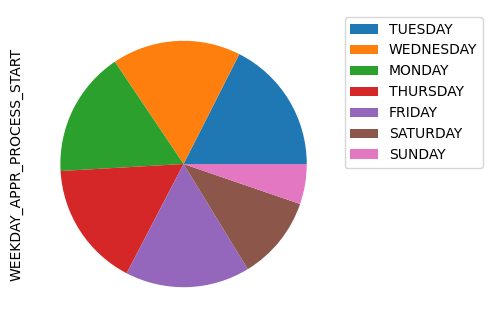

Business Entity Type 3    0.221104
XNA                       0.180072
Self-employed             0.124913
Other                     0.054252
Medicine                  0.036399
Business Entity Type 2    0.034317
Government                0.033833
School                    0.028919
Trade: type 7             0.025466
Kindergarten              0.022373
Construction              0.021856
Business Entity Type 1    0.019459
Transport: type 4         0.017554
Trade: type 3             0.011356
Industry: type 9          0.010952
Industry: type 3          0.010660
Security                  0.010559
Housing                   0.009619
Industry: type 11         0.008793
Military                  0.008566
Bank                      0.008153
Agriculture               0.007980
Police                    0.007613
Transport: type 2         0.007167
Postal                    0.007014
Security Ministries       0.006419
Trade: type 2             0.006179
Restaurant                0.005889
Services            

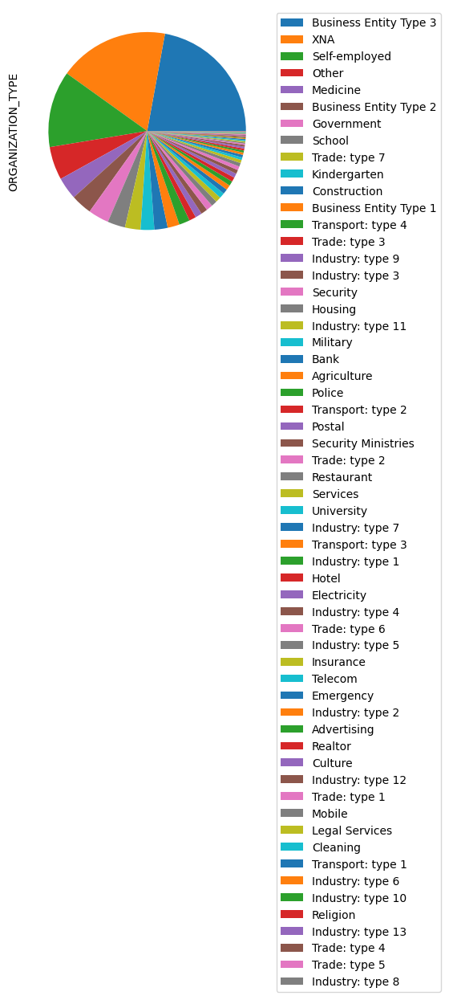

In [53]:
# Plotting pie charts for the univariate analysis of all the categorical Variables. Using loop to reduce writing same things again and again.

for i in obj_col:
    print(app_data[i].value_counts(normalize=True))
    plt.figure(figsize=[4,4])
    app_data[i].value_counts(normalize=True).plot.pie(labeldistance=None)
    plt.legend(bbox_to_anchor=(1,1))
    plt.show()

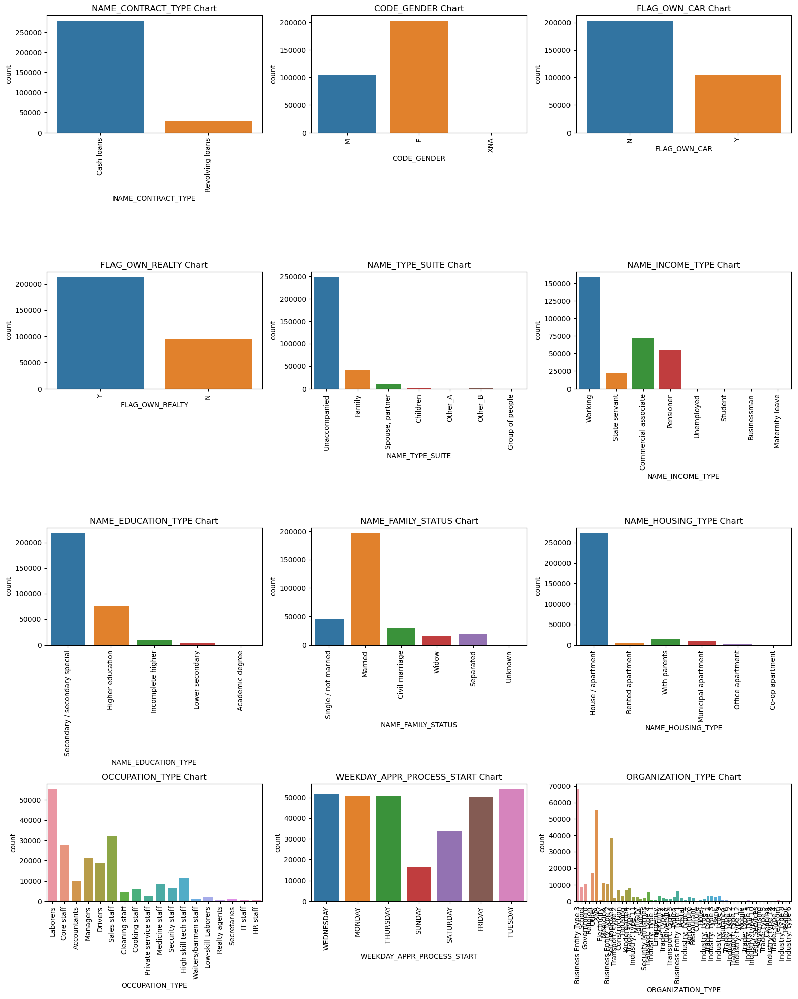

In [54]:
#Initialising number of rows, columns and counter
rows=4
cols=3
c=1
plt.figure(figsize=[16,20])
# Iterate over each categorical column
for i in obj_col:
    plt.subplot(rows,cols,c)
    plt.title(i+" "+"Chart")
    plt.xlabel(i)
    plt.xticks(rotation=90)
    sns.countplot(x=i,data=app_data)
    c+=1
# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()

###  Categorical Variables-Inference

<pre>
1)NAME_CONTRACT_TYPE
 Applicants applying for Revolving loans is 9.5% compared to cash loans as 90.4%. Hence, Cash loans are greater than Revolving loans.
2)CODE_GENDER
 Female applicants are 65.8 % and Male applicants are 34.2%. This can be analysed in further section while comparing with Target variable
3)FLAG_OWN_CAR
 65.9% Applicants doesn't own the car 
4)FLAG_OWN_REALTY
 69.3 % applicants owns house/flat
5)NAME_TYPE_SUITE
 Around 81 percent were unaccompanied while applying for loans.
6)NAME_INCOME_TYPE
 Most of them are working and 23 percent are commercial associate.
7)NAME_EDUCATION_TYPE
 71 % of the applicants have maximum secondary education
8)NAME_FAMILY_STATUS
 64% are married and have applied for loans as after marriage they might require an asset for future planning.
9)NAME_HOUSING_TYPE
 89% owns house/apartments.
10)OCCUPATION_TYPE
 Most of them are labourers i.e. 26%
11)ORGANIZATION_TYPE
 22% of Business entity(type-3) have applied for loans.

In [55]:
# Dropping the Gender = XNA from the data set as there are only 4 data with respect to that 
app_data = app_data[app_data['CODE_GENDER']!='XNA']
app_data['CODE_GENDER'].replace(['M','F'],['Male','Female'],inplace=True)

In [56]:
# Here, we can change "Y" and "N" to 1 and 0 for the columns-"FLAG_OWN_CAR" and "FLAG_OWN_REALTY"
#Binary representations simplify the interpretation of the variable's impact on the dependent variable. 
app_data['FLAG_OWN_CAR'] = np.where(app_data.FLAG_OWN_CAR =="Y",1,0)
app_data['FLAG_OWN_REALTY'] = np.where(app_data.FLAG_OWN_REALTY =="Y",1,0)


In [57]:
# Verifying the data types of above variables 
app_data['FLAG_OWN_REALTY'].dtype

dtype('int32')

In [58]:
app_data['FLAG_OWN_CAR'].dtype

dtype('int32')

### Numerical Variables

In [59]:
col_num=app_data.columns[(app_data.dtypes == "int64") | (app_data.dtypes == "float64")]
col_num

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_EMP_PHONE',
       'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL',
       'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_2',
       'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5',
       'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8',
       'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11',
       'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14',
      

In [60]:
# We don't require the FLAG_DOCUMENT details for further analysis.We can drop these columns

for i in col_num:
    if i.startswith("FLAG"):
        app_data.drop(columns=i,axis=1,inplace=True)
app_data.shape


(307507, 43)

In [61]:
col_num=app_data.columns[(app_data.dtypes == "int64") | (app_data.dtypes == "float64")]
col_num

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object')

#### Working with Anomalies

In [62]:
col_list=col_num.tolist
col_list

<bound method IndexOpsMixin.tolist of Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object')>

In [63]:
for j in app_data.columns[(app_data.dtypes == "int64") | (app_data.dtypes == "float64")]:
    print(app_data[j].describe())

count    307507.000000
mean     278181.527256
std      102790.132982
min      100002.000000
25%      189146.500000
50%      278203.000000
75%      367143.500000
max      456255.000000
Name: SK_ID_CURR, dtype: float64
count    307507.00000
mean          0.08073
std           0.27242
min           0.00000
25%           0.00000
50%           0.00000
75%           0.00000
max           1.00000
Name: TARGET, dtype: float64
count    307507.000000
mean          0.417047
std           0.722119
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max          19.000000
Name: CNT_CHILDREN, dtype: float64
count    3.075070e+05
mean     1.687977e+05
std      2.371246e+05
min      2.565000e+04
25%      1.125000e+05
50%      1.471500e+05
75%      2.025000e+05
max      1.170000e+08
Name: AMT_INCOME_TOTAL, dtype: float64
count    3.075070e+05
mean     5.990286e+05
std      4.024926e+05
min      4.500000e+04
25%      2.700000e+05
50%      5.135310e+05
75%      8.0

DAYS_BIRTH, DAYS_EMPLOYED, DAYS_REGISTRATION, DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE cannot be negative numbers. We can see from the above stats that these columns have negative values. This can be converted to positive values by using abs . Also, to standardise we can convert days to years.

In [64]:
# This is the client's age in days, hence converting in years
app_data.DAYS_BIRTH=app_data.DAYS_BIRTH.apply(lambda x: abs(x//365))
app_data.rename({"DAYS_BIRTH": "BIRTH_YEARS"}, axis=1,inplace=True)

In [65]:
app_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307507 entries, 0 to 307510
Data columns (total 43 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307507 non-null  int64  
 1   TARGET                       307507 non-null  int64  
 2   NAME_CONTRACT_TYPE           307507 non-null  object 
 3   CODE_GENDER                  307507 non-null  object 
 4   FLAG_OWN_CAR                 307507 non-null  int32  
 5   FLAG_OWN_REALTY              307507 non-null  int32  
 6   CNT_CHILDREN                 307507 non-null  int64  
 7   AMT_INCOME_TOTAL             307507 non-null  float64
 8   AMT_CREDIT                   307507 non-null  float64
 9   AMT_ANNUITY                  307495 non-null  float64
 10  AMT_GOODS_PRICE              307229 non-null  float64
 11  NAME_TYPE_SUITE              306215 non-null  object 
 12  NAME_INCOME_TYPE             307507 non-null  object 
 13 

In [66]:
app_data.DAYS_EMPLOYED=app_data.DAYS_EMPLOYED.apply(lambda x: abs(x//365))
app_data.rename({"DAYS_EMPLOYED": "YEARS_EMPLOYED"}, axis=1,inplace=True)
app_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307507 entries, 0 to 307510
Data columns (total 43 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307507 non-null  int64  
 1   TARGET                       307507 non-null  int64  
 2   NAME_CONTRACT_TYPE           307507 non-null  object 
 3   CODE_GENDER                  307507 non-null  object 
 4   FLAG_OWN_CAR                 307507 non-null  int32  
 5   FLAG_OWN_REALTY              307507 non-null  int32  
 6   CNT_CHILDREN                 307507 non-null  int64  
 7   AMT_INCOME_TOTAL             307507 non-null  float64
 8   AMT_CREDIT                   307507 non-null  float64
 9   AMT_ANNUITY                  307495 non-null  float64
 10  AMT_GOODS_PRICE              307229 non-null  float64
 11  NAME_TYPE_SUITE              306215 non-null  object 
 12  NAME_INCOME_TYPE             307507 non-null  object 
 13 

In [67]:
app_data.DAYS_REGISTRATION=app_data.DAYS_REGISTRATION.apply(lambda x: abs(x//365))
app_data.rename({"DAYS_REGISTRATION": "YEARS_REGISTRATION"}, axis=1,inplace=True)
app_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307507 entries, 0 to 307510
Data columns (total 43 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307507 non-null  int64  
 1   TARGET                       307507 non-null  int64  
 2   NAME_CONTRACT_TYPE           307507 non-null  object 
 3   CODE_GENDER                  307507 non-null  object 
 4   FLAG_OWN_CAR                 307507 non-null  int32  
 5   FLAG_OWN_REALTY              307507 non-null  int32  
 6   CNT_CHILDREN                 307507 non-null  int64  
 7   AMT_INCOME_TOTAL             307507 non-null  float64
 8   AMT_CREDIT                   307507 non-null  float64
 9   AMT_ANNUITY                  307495 non-null  float64
 10  AMT_GOODS_PRICE              307229 non-null  float64
 11  NAME_TYPE_SUITE              306215 non-null  object 
 12  NAME_INCOME_TYPE             307507 non-null  object 
 13 

In [68]:
app_data.DAYS_ID_PUBLISH=app_data.DAYS_ID_PUBLISH.apply(lambda x: abs(x//365))
app_data.rename({"DAYS_ID_PUBLISH": "YEARS_ID_PUBLISH"}, axis=1,inplace=True)
app_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307507 entries, 0 to 307510
Data columns (total 43 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307507 non-null  int64  
 1   TARGET                       307507 non-null  int64  
 2   NAME_CONTRACT_TYPE           307507 non-null  object 
 3   CODE_GENDER                  307507 non-null  object 
 4   FLAG_OWN_CAR                 307507 non-null  int32  
 5   FLAG_OWN_REALTY              307507 non-null  int32  
 6   CNT_CHILDREN                 307507 non-null  int64  
 7   AMT_INCOME_TOTAL             307507 non-null  float64
 8   AMT_CREDIT                   307507 non-null  float64
 9   AMT_ANNUITY                  307495 non-null  float64
 10  AMT_GOODS_PRICE              307229 non-null  float64
 11  NAME_TYPE_SUITE              306215 non-null  object 
 12  NAME_INCOME_TYPE             307507 non-null  object 
 13 

In [69]:
app_data.DAYS_LAST_PHONE_CHANGE=app_data.DAYS_LAST_PHONE_CHANGE.apply(lambda x: abs(x))
app_data.info()
app_data.DAYS_LAST_PHONE_CHANGE.describe()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307507 entries, 0 to 307510
Data columns (total 43 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307507 non-null  int64  
 1   TARGET                       307507 non-null  int64  
 2   NAME_CONTRACT_TYPE           307507 non-null  object 
 3   CODE_GENDER                  307507 non-null  object 
 4   FLAG_OWN_CAR                 307507 non-null  int32  
 5   FLAG_OWN_REALTY              307507 non-null  int32  
 6   CNT_CHILDREN                 307507 non-null  int64  
 7   AMT_INCOME_TOTAL             307507 non-null  float64
 8   AMT_CREDIT                   307507 non-null  float64
 9   AMT_ANNUITY                  307495 non-null  float64
 10  AMT_GOODS_PRICE              307229 non-null  float64
 11  NAME_TYPE_SUITE              306215 non-null  object 
 12  NAME_INCOME_TYPE             307507 non-null  object 
 13 

count    307506.000000
mean        962.860546
std         826.811491
min           0.000000
25%         274.000000
50%         757.000000
75%        1570.000000
max        4292.000000
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64

In [70]:
for j in app_data.columns[(app_data.dtypes == "int64")|(app_data.dtypes == "float64") ]:
    print(j)

SK_ID_CURR
TARGET
CNT_CHILDREN
AMT_INCOME_TOTAL
AMT_CREDIT
AMT_ANNUITY
AMT_GOODS_PRICE
REGION_POPULATION_RELATIVE
BIRTH_YEARS
YEARS_EMPLOYED
YEARS_REGISTRATION
YEARS_ID_PUBLISH
CNT_FAM_MEMBERS
REGION_RATING_CLIENT
REGION_RATING_CLIENT_W_CITY
HOUR_APPR_PROCESS_START
REG_REGION_NOT_LIVE_REGION
REG_REGION_NOT_WORK_REGION
LIVE_REGION_NOT_WORK_REGION
REG_CITY_NOT_LIVE_CITY
REG_CITY_NOT_WORK_CITY
LIVE_CITY_NOT_WORK_CITY
EXT_SOURCE_2
EXT_SOURCE_3
DAYS_LAST_PHONE_CHANGE
AMT_REQ_CREDIT_BUREAU_HOUR
AMT_REQ_CREDIT_BUREAU_DAY
AMT_REQ_CREDIT_BUREAU_WEEK
AMT_REQ_CREDIT_BUREAU_MON
AMT_REQ_CREDIT_BUREAU_QRT
AMT_REQ_CREDIT_BUREAU_YEAR


Let's divide these into integer and float variables and perform the analysis on them . For BIRTH_YEARS,AMT_INCOME_TOTAL, AMT_CREDIT, we can create bins to identify patterns and trends within specific ranges.

### BINNING

#### BIRTH_YEARS(AGE)

In [71]:
# Creating a new column called Age_group by binning BIRTH_YEARS. 

app_data["AGE_GROUP"]=pd.cut(app_data.BIRTH_YEARS,[5,15,25,35,45,55,65,75,99999],labels=["<15","16-25","26-35","36-45","46-55","56-65","66-75","75+"])
cnt_values=app_data["AGE_GROUP"].value_counts(normalize=True)
cnt_values

36-45    0.274052
26-35    0.235117
46-55    0.227887
56-65    0.197052
16-25    0.039541
66-75    0.026351
<15      0.000000
75+      0.000000
Name: AGE_GROUP, dtype: float64

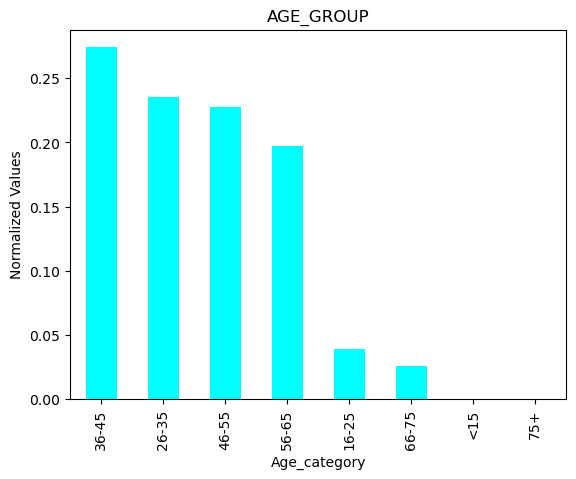

In [72]:
#Plotting bar chart to get better representation

app_data["AGE_GROUP"].value_counts(normalize=True).plot(kind="bar",color="cyan")

# Add labels and title
plt.title("AGE_GROUP")
plt.xlabel("Age_category")
plt.ylabel("Normalized Values")

# Show the plot
plt.show()

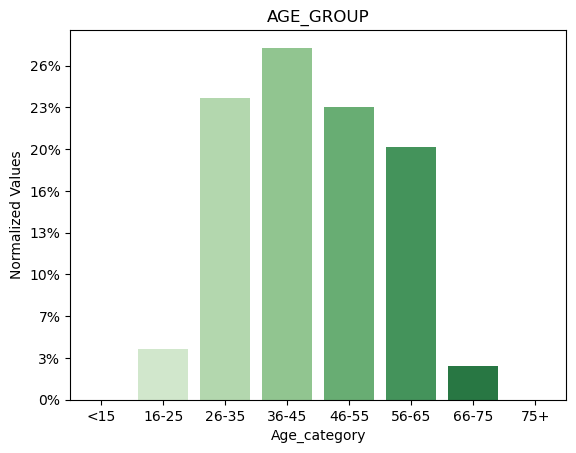

In [73]:
from matplotlib.ticker import FuncFormatter


# Assuming 'AGE_GROUP' is already created in your DataFrame
ax = sns.countplot(x="AGE_GROUP", data=app_data, palette='Greens')

# Add labels and title
plt.title("AGE_GROUP")
plt.xlabel("Age_category")
plt.ylabel("Normalized Values")

# Convert y-axis labels to percentages
total = len(app_data)
ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: f'{y/total:.0%}'))

# Show the plot
plt.show()



From the plots we can conclude that age group->36-45 years are most likely to apply for loan.

#### AMT_INCOME_TOTAL

In [74]:
app_data["AMT_INCOME_TOTAL"].value_counts(normalize=True)*100

1.350000e+05    11.625426
1.125000e+05    10.087250
1.575000e+05     8.635576
1.800000e+05     8.038516
9.000000e+04     7.311378
2.250000e+05     6.730904
2.025000e+05     5.314025
6.750000e+04     3.624958
2.700000e+05     3.520895
8.100000e+04     1.951500
3.150000e+05     1.906298
2.475000e+05     1.737521
1.260000e+05     1.518014
3.600000e+05     1.338181
1.215000e+05     1.251354
9.900000e+04     1.181437
2.925000e+05     1.111519
1.035000e+05     1.082902
7.650000e+04     1.023066
1.440000e+05     1.015587
1.710000e+05     0.860793
4.500000e+05     0.791852
1.170000e+05     0.777218
5.400000e+04     0.754129
7.200000e+04     0.711203
1.665000e+05     0.667627
4.500000e+04     0.664375
1.080000e+05     0.632831
3.375000e+05     0.582101
9.450000e+04     0.568117
1.620000e+05     0.553483
1.890000e+05     0.549906
4.050000e+05     0.539825
8.550000e+04     0.492347
1.485000e+05     0.483241
2.160000e+05     0.457225
1.305000e+05     0.408446
5.850000e+04     0.384381
6.300000e+04

In [75]:
#Binning the income to get better insights
#Here, as per above counts we can see that there is lot of variation hence, we can do qcut so that the values are binned based on quantiles/percentiles

app_data["Income_category"]=pd.qcut(app_data["AMT_INCOME_TOTAL"],q=[0,0.2,0.4,0.6,0.8,1],labels=["Very low","low","Average","High","Very High"])
app_data["Income_category"].value_counts(normalize=True)*100

low          27.887170
High         24.556189
Very low     20.705545
Very High    15.322253
Average      11.528843
Name: Income_category, dtype: float64

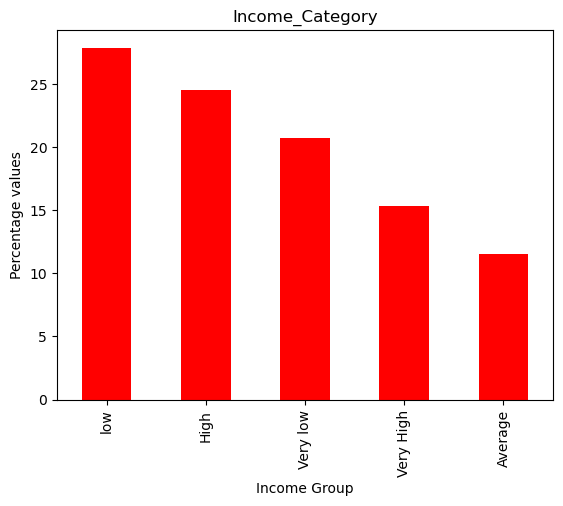

In [76]:
# Plotting bar chart to get better visualization

(app_data["Income_category"].value_counts(normalize=True)*100).plot(kind="bar",color="Red")
plt.title("Income_Category")
plt.xlabel("Income Group")
plt.ylabel("Percentage values")
plt.show()

Low income group have applied to the loans maximum

#### AMT_CREDIT

In [77]:
app_data["AMT_CREDIT"].value_counts(normalize=True)*100

450000.0     3.157326
675000.0     2.886764
225000.0     2.654249
180000.0     2.387588
270000.0     2.354418
900000.0     2.031173
254700.0     1.463381
545040.0     1.442894
808650.0     1.350213
135000.0     1.190217
755190.0     1.145990
1125000.0    1.135909
521280.0     1.032497
284400.0     1.006806
1078200.0    0.928759
454500.0     0.861444
1288350.0    0.849737
269550.0     0.800957
202500.0     0.760633
781920.0     0.757056
1350000.0    0.754780
239850.0     0.677708
315000.0     0.673806
247500.0     0.668928
640080.0     0.663725
1006920.0    0.612344
540000.0     0.591856
360000.0     0.566816
508495.5     0.558361
592560.0     0.548931
497520.0     0.541451
405000.0     0.539825
835380.0     0.520313
337500.0     0.516411
679500.0     0.505680
942300.0     0.465355
314100.0     0.453323
152820.0     0.444218
1546020.0    0.415925
495000.0     0.412348
157500.0     0.391211
585000.0     0.390235
728460.0     0.346334
526491.0     0.329098
544491.0     0.328123
343800.0  

In [78]:
app_data["Credit_Group"]=pd.qcut(app_data["AMT_CREDIT"],q=[0,0.2,0.5,0.8,0.9,1],labels=["Very Low", "Low", "Moderate", "High", "Very High"])
app_data["Credit_Group"].value_counts(normalize=True)*100

Moderate     30.811982
Low          28.916740
Very Low     21.113341
Very High     9.948717
High          9.209221
Name: Credit_Group, dtype: float64

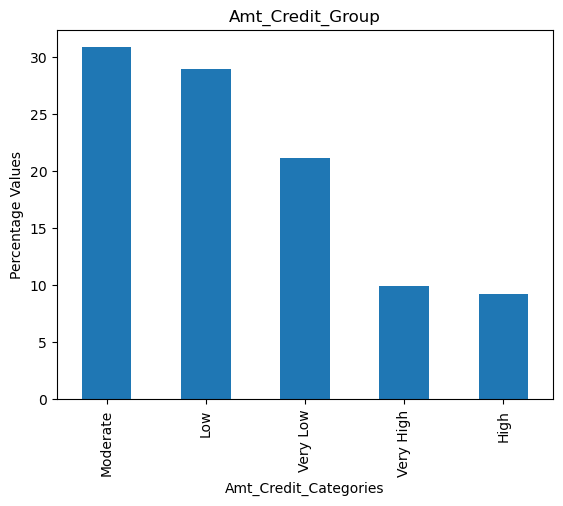

In [79]:

(app_data["Credit_Group"].value_counts(normalize=True)*100).plot(kind="bar")
plt.title("Amt_Credit_Group")
plt.xlabel("Amt_Credit_Categories")
plt.ylabel("Percentage Values")
plt.show()

Credit amount of the loan falls maximum in moderate category.

In [80]:
app_data.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'BIRTH_YEARS',
       'YEARS_EMPLOYED', 'YEARS_REGISTRATION', 'YEARS_ID_PUBLISH',
       'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_B

In [81]:
list_int=app_data.columns[(app_data.dtypes == "int64")]
list_int

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'BIRTH_YEARS', 'YEARS_EMPLOYED',
       'YEARS_ID_PUBLISH', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY'],
      dtype='object')

In [82]:
# Numerical data- Int and Float. First we will create for boxplots for all the int variables and then float due to high number of data


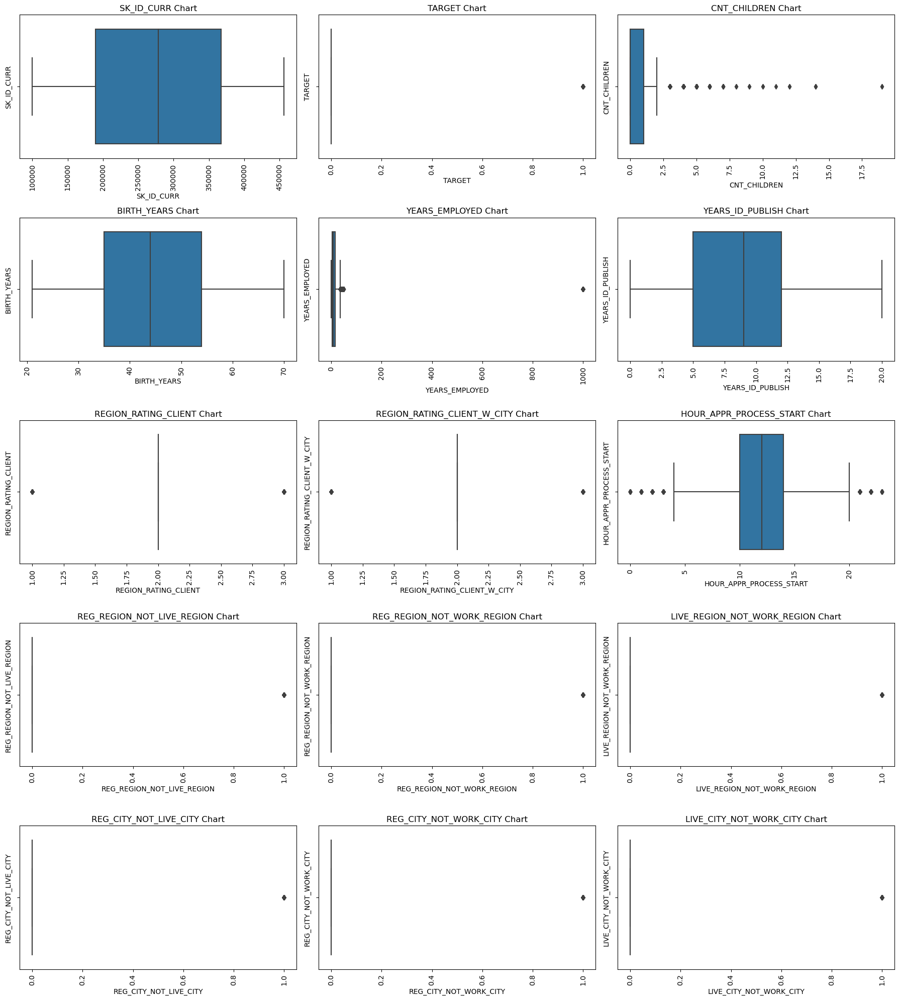

In [83]:
'''INT DATA'''
#Initialising number of rows, columns and counter
rows=5
cols=3
c=1
plt.figure(figsize=[18,20])
# Iterate over each Numerical column
for i in list_int:
    plt.subplot(rows,cols,c)
    plt.title(i+" "+"Chart")
    plt.xticks(rotation=90)
    plt.ylabel(i)
    sns.boxplot(x=i,data=app_data)
    c+=1
# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()

### Inference:
<pre>
1)From the above plots, we can see that few of plots are having values -0 and 1 . We will keep them as int for further analysis.
2)CNT_CHILDREN has outliers which needs to be treated
3)HOUR_APPR_PROCESS_START also has some values beyond max and min but the hour at which loan has been applied is not specific and can vary a bit
4)YEARS_EMPLOYEED has the outliers as well. Let's check and find the solution


In [84]:
app_data["CNT_CHILDREN"].value_counts(normalize=True)*100

0     70.037105
1     19.875320
2      8.698339
3      1.208753
4      0.139509
5      0.027316
6      0.006829
7      0.002276
14     0.000976
8      0.000650
9      0.000650
12     0.000650
10     0.000650
19     0.000650
11     0.000325
Name: CNT_CHILDREN, dtype: float64

In [85]:
app_data[app_data["CNT_CHILDREN"]>8]["CNT_CHILDREN"].value_counts()

14    3
9     2
12    2
10    2
19    2
11    1
Name: CNT_CHILDREN, dtype: int64

In [86]:
app_data.YEARS_EMPLOYED.value_counts()

1000    55374
2       31845
3       29627
1       27980
4       25100
5       21756
6       16260
7       15058
8       13141
9       11428
10       8983
11       7352
12       5901
13       5307
15       4636
14       4353
16       2730
17       2328
18       2008
19       1915
20       1868
21       1602
22       1459
23       1255
24       1014
25        913
26        822
27        655
28        654
29        608
30        568
31        456
32        438
35        361
33        352
34        332
36        258
37        195
38        140
40        124
39        115
41         59
42         59
43         42
45         31
44         19
46         14
49          4
47          4
0           2
48          1
50          1
Name: YEARS_EMPLOYED, dtype: int64

#### Outliers Analysis:
1) CNT_CHILDREN:
This could be possibility as number of children greater than 8 are for 12 rows. Hence, we can leave as it is.
2) YEARS_EMPLOYED:
We can see that 1000 is a genuine outlier as number of years employed can't be 1000. Hence , we can impute the same with the median.

In [87]:
'''FLOAT AND CATEGORICAL DATA'''
list_float=app_data.columns[(app_data.dtypes == "float64") | (app_data.dtypes == "category")]
list_float

Index(['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'YEARS_REGISTRATION', 'CNT_FAM_MEMBERS',
       'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_LAST_PHONE_CHANGE',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR', 'AGE_GROUP',
       'Income_category', 'Credit_Group'],
      dtype='object')

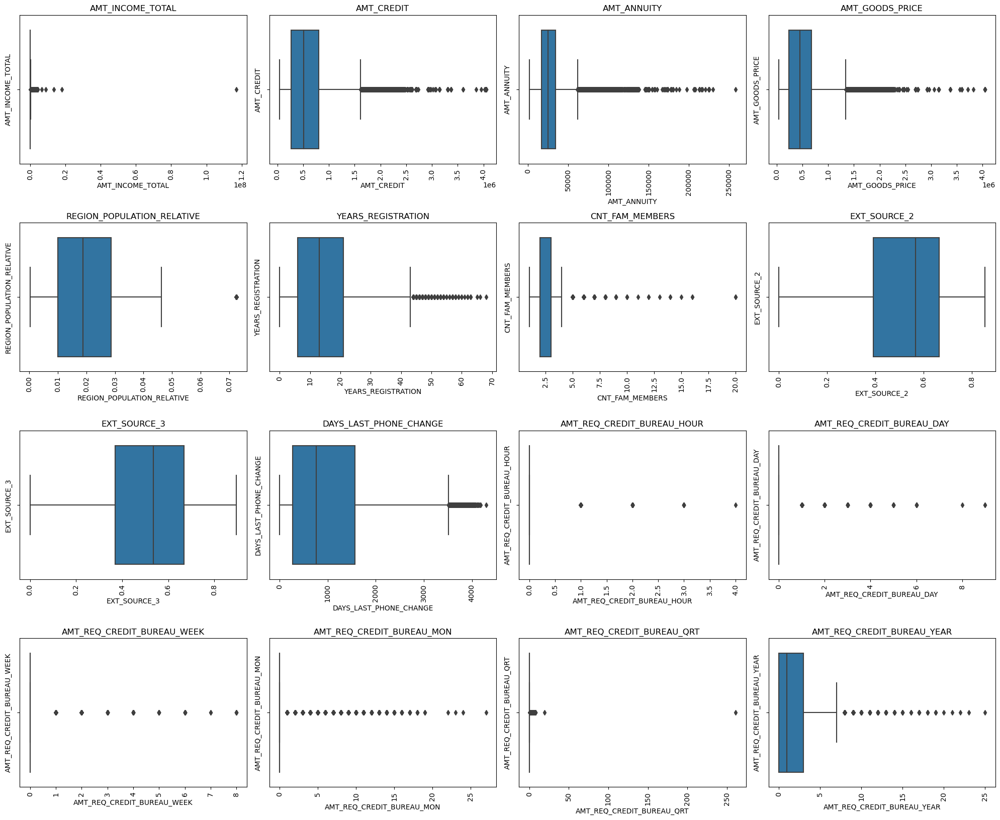

In [88]:
list_float =app_data.columns[(app_data.dtypes == "float64")].tolist()

# Rest of your code remains the same
rows = 5
cols = 4
c = 1
plt.figure(figsize=[20, 20])

for i in list_float:
    plt.subplot(rows, cols, c)
    plt.title(i)
    plt.xticks(rotation=90)
    plt.ylabel(i)
    sns.boxplot(x=app_data[i])
    c += 1

plt.tight_layout()
plt.show()


#### Outliers Analysis
Outliers observed in 'AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','AMT_GOODS_PRICE','YEARS_REGISTRATION', DAYS_LAST_PHONE_CHANGE,'CNT_FAM_MEMBERS

In [89]:
#checking the decription value_counts of the columns hving outliers
out_col=['AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','AMT_GOODS_PRICE','YEARS_REGISTRATION',"CNT_FAM_MEMBERS"]

for i in out_col:
    print("\n")
 
    print(app_data[i].describe())
    print("\n")
 
    print(app_data[i].value_counts( dropna=False,normalize=True))
    print("\n")
 



count    3.075070e+05
mean     1.687977e+05
std      2.371246e+05
min      2.565000e+04
25%      1.125000e+05
50%      1.471500e+05
75%      2.025000e+05
max      1.170000e+08
Name: AMT_INCOME_TOTAL, dtype: float64


1.350000e+05    0.116254
1.125000e+05    0.100873
1.575000e+05    0.086356
1.800000e+05    0.080385
9.000000e+04    0.073114
2.250000e+05    0.067309
2.025000e+05    0.053140
6.750000e+04    0.036250
2.700000e+05    0.035209
8.100000e+04    0.019515
3.150000e+05    0.019063
2.475000e+05    0.017375
1.260000e+05    0.015180
3.600000e+05    0.013382
1.215000e+05    0.012514
9.900000e+04    0.011814
2.925000e+05    0.011115
1.035000e+05    0.010829
7.650000e+04    0.010231
1.440000e+05    0.010156
1.710000e+05    0.008608
4.500000e+05    0.007919
1.170000e+05    0.007772
5.400000e+04    0.007541
7.200000e+04    0.007112
1.665000e+05    0.006676
4.500000e+04    0.006644
1.080000e+05    0.006328
3.375000e+05    0.005821
9.450000e+04    0.005681
1.620000e+05    0.005535
1.8900

#### Inference: We can substitute the outliers with the median values for the above columns as mentioned.

In [90]:
app_data["DAYS_LAST_PHONE_CHANGE"].value_counts(normalize=True)

0.0       0.122508
1.0       0.009145
2.0       0.007538
3.0       0.005733
4.0       0.004179
5.0       0.002680
6.0       0.001746
7.0       0.001437
8.0       0.000904
476.0     0.000722
352.0     0.000693
392.0     0.000686
364.0     0.000680
479.0     0.000663
358.0     0.000660
329.0     0.000660
293.0     0.000657
350.0     0.000654
441.0     0.000650
399.0     0.000650
404.0     0.000647
9.0       0.000644
463.0     0.000644
11.0      0.000644
301.0     0.000641
362.0     0.000634
304.0     0.000634
496.0     0.000634
308.0     0.000634
483.0     0.000634
500.0     0.000631
355.0     0.000631
427.0     0.000628
391.0     0.000628
334.0     0.000628
448.0     0.000624
347.0     0.000624
413.0     0.000621
415.0     0.000621
447.0     0.000618
469.0     0.000618
546.0     0.000618
499.0     0.000615
353.0     0.000611
566.0     0.000611
428.0     0.000608
420.0     0.000608
417.0     0.000605
315.0     0.000605
475.0     0.000605
574.0     0.000605
454.0     0.000602
511.0     0.

#### Inference: This can vary and doesn't require further analysis

#### SPLITTING DATA BASED ON DTYPES:

In [91]:
# We will now create 3 lists- Numerical columns, categorical ordinal column, category nominal columns.
'''Separating columns in DataFrame into lists based on their data types and, for numerical columns, identifying those that
have a small number of unique values to potentially be treated as categorical variables. '''
objList = []
numList = []
catList = []

for i in app_data.columns:
    if app_data[i].dtypes == "object":
        objList.append(i)
    else:
        numList.append(i)

for i in numList:
    unique_values_count = len(app_data[i].unique())
    if unique_values_count < 4:
        app_data[i] = app_data[i].astype("category")
        catList.append(i)


In [92]:
for i in catList:
    numList.remove(i)

print("Numerical :", numList) 
print("\n")

print("object:", objList) 
print("\n")

print("categorical:", catList) 

Numerical : ['SK_ID_CURR', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'BIRTH_YEARS', 'YEARS_EMPLOYED', 'YEARS_REGISTRATION', 'YEARS_ID_PUBLISH', 'CNT_FAM_MEMBERS', 'HOUR_APPR_PROCESS_START', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR', 'AGE_GROUP', 'Income_category', 'Credit_Group']


object: ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE']


categorical: ['TARGET', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',

In [93]:
# Now wer can remove 'AGE_GROUP', 'Income_category', 'Credit_Group'. These are binned data. We can create another list and store these in them
numList.remove('Income_category')
numList.remove('AGE_GROUP')
numList.remove('Credit_Group')
objList.remove('CODE_GENDER')
catList.append('CODE_GENDER')
catList.remove('TARGET') # We will split these into two data frames for defaulters and non defaulters-Target variable
binned_list=['AGE_GROUP', 'Income_category']
print("Numerical :", numList) 
print("\n")

print("object:", objList) 
print("\n")

print("categorical:", catList) 
print("\n")

print("binned:", binned_list) 


Numerical : ['SK_ID_CURR', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'BIRTH_YEARS', 'YEARS_EMPLOYED', 'YEARS_REGISTRATION', 'YEARS_ID_PUBLISH', 'CNT_FAM_MEMBERS', 'HOUR_APPR_PROCESS_START', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR']


object: ['NAME_CONTRACT_TYPE', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE']


categorical: ['FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'CODE_GENDER']


bi

### SPITTING THE TARGET DATAFRAMES INTO TWO DATAFRAMES

In [94]:
#NON_DEFAULTERS
app_data_t0=app_data[app_data['TARGET']==0]
app_data_t0.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,BIRTH_YEARS,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE_GROUP,Income_category,Credit_Group
1,100003,0,Cash loans,Female,0,0,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,46,4,4.0,1,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,NaN,828.0,0.0,0.0,0.0,0.0,0.0,0.0,46-55,Very High,Very High
2,100004,0,Revolving loans,Male,1,1,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,53,1,12.0,7,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,815.0,0.0,0.0,0.0,0.0,0.0,0.0,46-55,Very low,Very Low
3,100006,0,Cash loans,Female,0,1,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,53,9,27.0,7,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,NaN,617.0,NaN,NaN,NaN,NaN,NaN,NaN,46-55,low,Low
4,100007,0,Cash loans,Male,0,1,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,55,9,12.0,10,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,NaN,1106.0,0.0,0.0,0.0,0.0,0.0,0.0,46-55,low,Low
5,100008,0,Cash loans,Male,0,1,0,99000.0,490495.5,27517.5,454500.0,"Spouse, partner",State servant,Secondary / secondary special,Married,House / apartment,0.035792,47,5,14.0,2,Laborers,2.0,2,2,WEDNESDAY,16,0,0,0,0,0,0,Other,0.354225,0.621226,2536.0,0.0,0.0,0.0,0.0,1.0,1.0,46-55,Very low,Low


In [95]:
#Defaulters
app_data_t1=app_data[app_data['TARGET']==1]
app_data_t1.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,BIRTH_YEARS,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE_GROUP,Income_category,Credit_Group
0,100002,1,Cash loans,Male,0,1,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,26,2,10.0,6,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,1134.0,0.0,0.0,0.0,0.0,0.0,1.0,26-35,High,Low
26,100031,1,Cash loans,Female,0,1,0,112500.0,979992.0,27076.5,702000.0,Unaccompanied,Working,Secondary / secondary special,Widow,House / apartment,0.018029,52,8,19.0,6,Cooking staff,1.0,3,2,MONDAY,9,0,0,0,0,0,0,Business Entity Type 3,0.548477,0.190706,161.0,0.0,0.0,0.0,0.0,2.0,2.0,46-55,low,High
40,100047,1,Cash loans,Male,0,1,0,202500.0,1193580.0,35028.0,855000.0,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,0.025164,48,4,4.0,3,Laborers,2.0,2,2,TUESDAY,9,0,0,0,0,0,0,Business Entity Type 3,0.306841,0.320163,1075.0,0.0,0.0,0.0,2.0,0.0,4.0,46-55,High,Very High
42,100049,1,Cash loans,Female,0,0,0,135000.0,288873.0,16258.5,238500.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.007305,37,10,1.0,13,Sales staff,2.0,3,3,THURSDAY,11,0,0,0,0,0,0,Self-employed,0.674203,0.399676,1480.0,0.0,0.0,0.0,0.0,0.0,2.0,36-45,low,Low
81,100096,1,Cash loans,Female,0,1,0,81000.0,252000.0,14593.5,252000.0,Unaccompanied,Pensioner,Secondary / secondary special,Married,House / apartment,0.028663,68,1000,15.0,12,NaN,2.0,2,2,THURSDAY,10,0,0,0,0,0,0,XNA,0.023952,0.720944,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66-75,Very low,Very Low


### Univariate Analysis- Categorical Nominal (Both Dataframes)

Target 0:
Cash loans         90.211262
Revolving loans     9.788738
Name: NAME_CONTRACT_TYPE, dtype: float64


Target 1:
Cash loans         93.538771
Revolving loans     6.461229
Name: NAME_CONTRACT_TYPE, dtype: float64


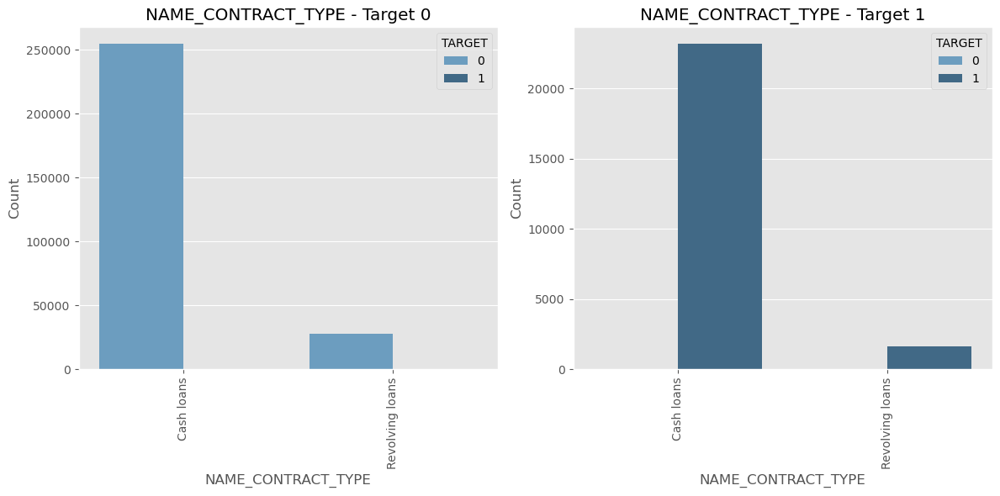

Target 0:
Unaccompanied      81.072266
Family             13.195125
Spouse, partner     3.721666
Children            1.075108
Other_B             0.567043
Other_A             0.280679
Group of people     0.088112
Name: NAME_TYPE_SUITE, dtype: float64


Target 1:
Unaccompanied      82.153100
Family             12.155120
Spouse, partner     3.615431
Children            0.973541
Other_B             0.702888
Other_A             0.307009
Group of people     0.092911
Name: NAME_TYPE_SUITE, dtype: float64


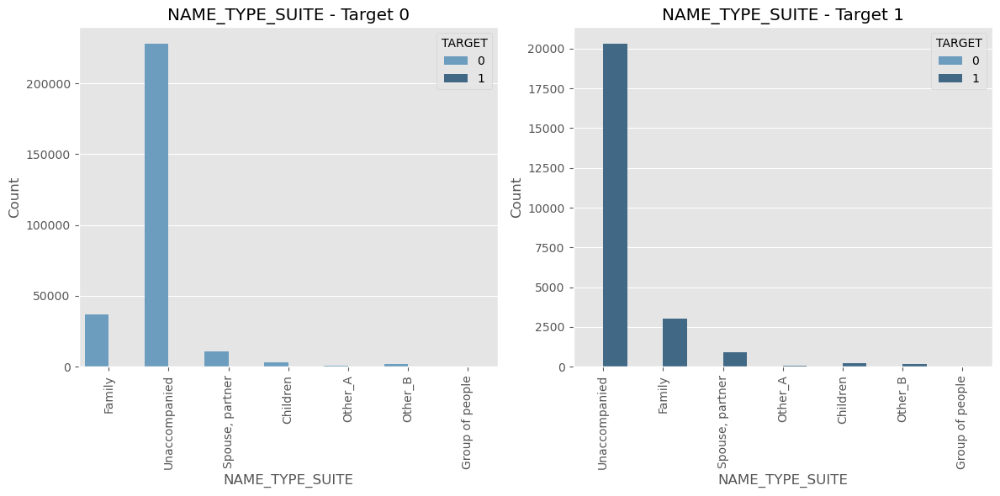

Target 0:
Working                 50.780382
Commercial associate    23.438351
Pensioner               18.529655
State servant            7.235692
Student                  0.006368
Unemployed               0.004953
Businessman              0.003538
Maternity leave          0.001061
Name: NAME_INCOME_TYPE, dtype: float64


Target 1:
Working                 61.325277
Commercial associate    21.591138
Pensioner               12.012085
State servant            5.031219
Unemployed               0.032226
Maternity leave          0.008056
Name: NAME_INCOME_TYPE, dtype: float64


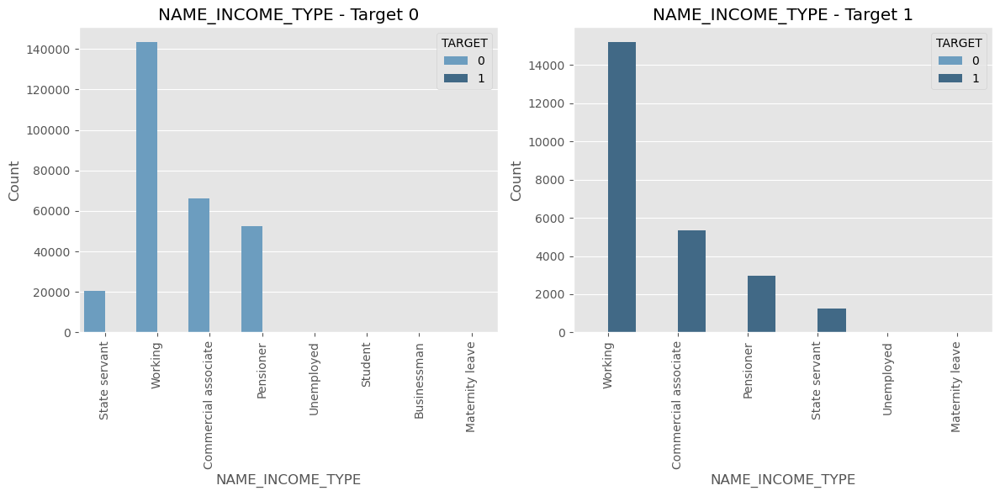

Target 0:
Secondary / secondary special    70.349368
Higher education                 25.064560
Incomplete higher                 3.326706
Lower secondary                   1.202411
Academic degree                   0.056954
Name: NAME_EDUCATION_TYPE, dtype: float64


Target 1:
Secondary / secondary special    78.646526
Higher education                 16.149043
Incomplete higher                 3.512588
Lower secondary                   1.679758
Academic degree                   0.012085
Name: NAME_EDUCATION_TYPE, dtype: float64


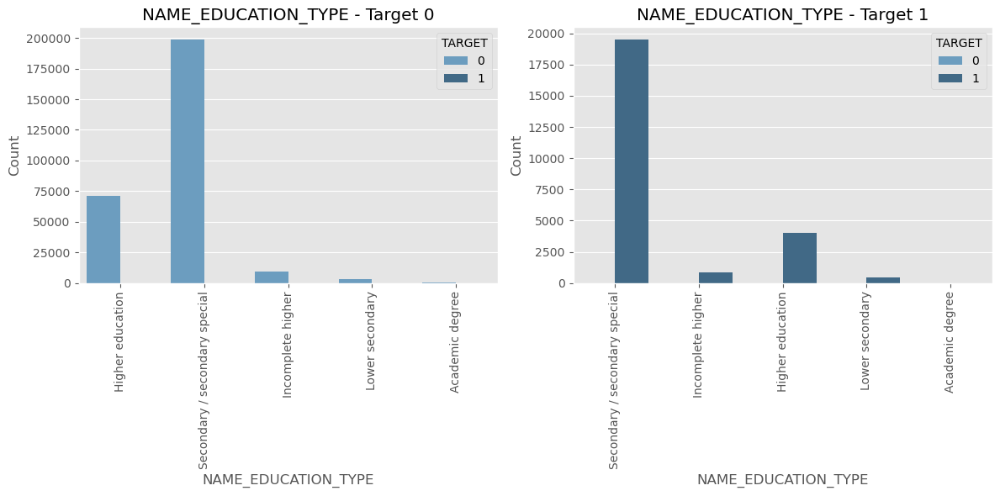

Target 0:
Married                 64.234369
Single / not married    14.499331
Civil marriage           9.485217
Separated                6.420642
Widow                    5.359733
Unknown                  0.000708
Name: NAME_FAMILY_STATUS, dtype: float64


Target 1:
Married                 59.818731
Single / not married    17.953676
Civil marriage          11.927492
Separated                6.525680
Widow                    3.774421
Name: NAME_FAMILY_STATUS, dtype: float64


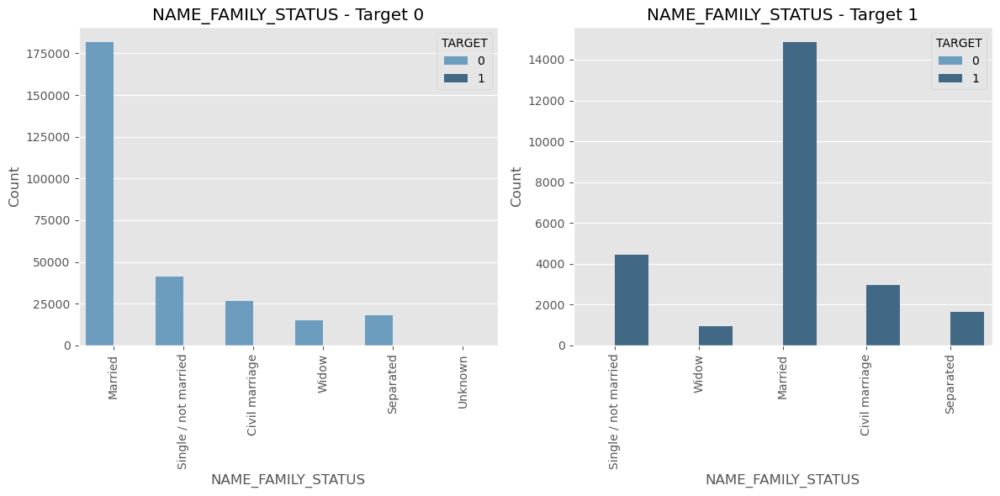

Target 0:
House / apartment      89.002130
With parents            4.635598
Municipal apartment     3.617846
Rented apartment        1.514069
Office apartment        0.864929
Co-op apartment         0.365428
Name: NAME_HOUSING_TYPE, dtype: float64


Target 1:
House / apartment      85.687815
With parents            6.992951
Municipal apartment     3.846928
Rented apartment        2.420947
Office apartment        0.692850
Co-op apartment         0.358510
Name: NAME_HOUSING_TYPE, dtype: float64


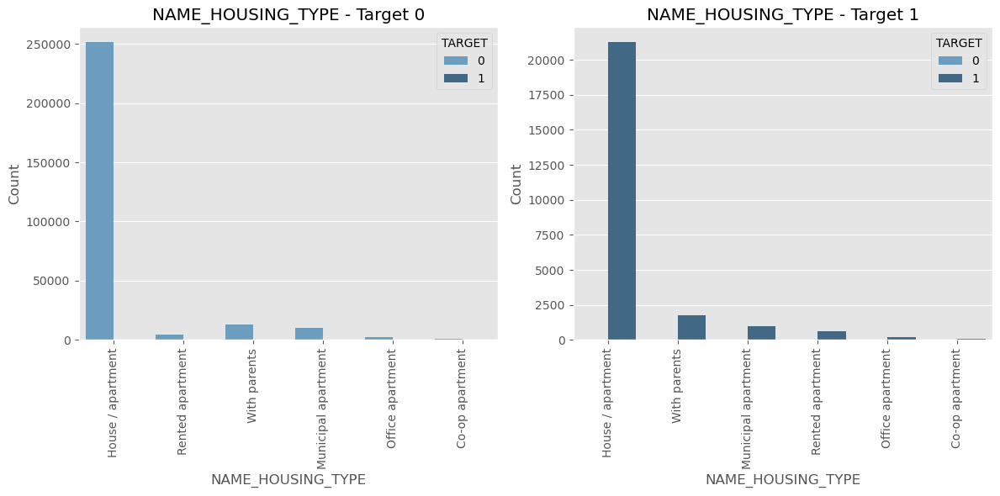

Target 0:
Laborers                 25.625873
Sales staff              15.064574
Core staff               13.413754
Managers                 10.408109
Drivers                   8.566191
High skill tech staff     5.545487
Accountants               4.849640
Medicine staff            4.136137
Security staff            3.115215
Cooking staff             2.765214
Cleaning staff            2.184129
Private service staff     1.286279
Low-skill Laborers        0.899928
Secretaries               0.629898
Waiters/barmen staff      0.621070
Realty agents             0.359348
HR staff                  0.273665
IT staff                  0.255490
Name: OCCUPATION_TYPE, dtype: float64


Target 1:
Laborers                 31.476789
Sales staff              16.671160
Drivers                  11.360328
Core staff                9.370788
Managers                  7.160188
Security staff            3.892813
High skill tech staff     3.779587
Cooking staff             3.348250
Medicine staff            3.08

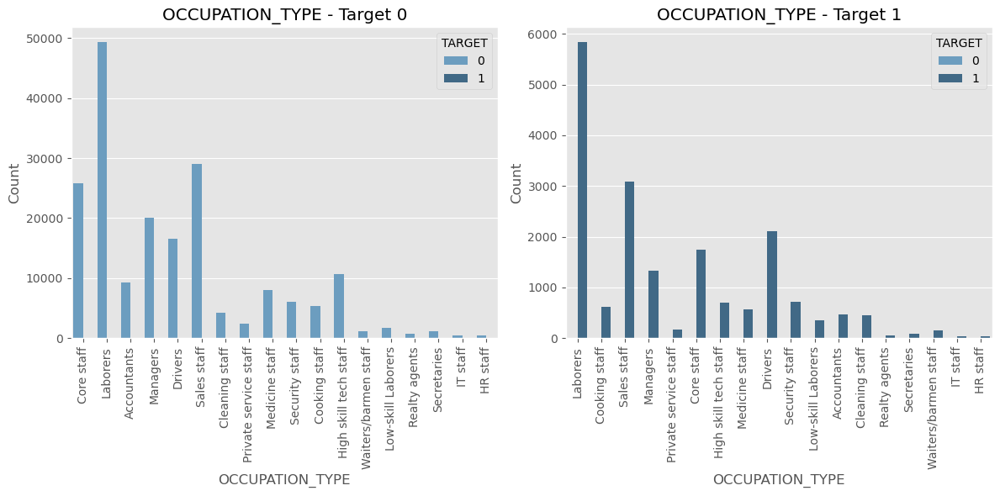

Target 0:
TUESDAY      17.475113
WEDNESDAY    16.872670
MONDAY       16.548631
THURSDAY     16.446749
FRIDAY       16.355834
SATURDAY     11.030770
SUNDAY        5.270233
Name: WEEKDAY_APPR_PROCESS_START, dtype: float64


Target 1:
TUESDAY      18.130916
WEDNESDAY    17.071501
FRIDAY       16.519637
THURSDAY     16.507553
MONDAY       15.846928
SATURDAY     10.755287
SUNDAY        5.168177
Name: WEEKDAY_APPR_PROCESS_START, dtype: float64


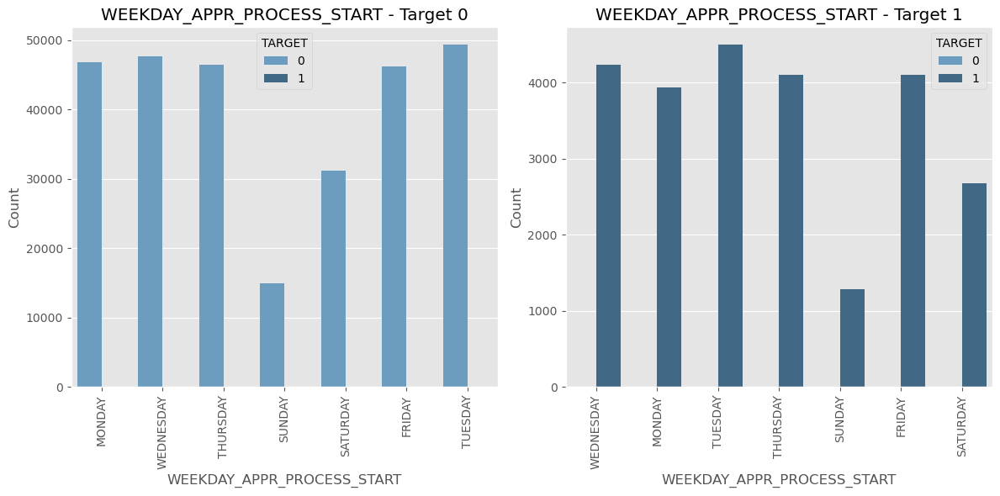

Target 0:
Business Entity Type 3    21.815680
XNA                       18.531070
Self-employed             12.205942
Other                      5.450648
Medicine                   3.698502
Government                 3.423635
Business Entity Type 2     3.414791
School                     2.959863
Trade: type 7              2.508472
Kindergarten               2.262259
Construction               2.099886
Business Entity Type 1     1.944234
Transport: type 4          1.732335
Industry: type 9           1.111850
Trade: type 3              1.107605
Industry: type 3           1.036147
Security                   1.034024
Housing                    0.963273
Military                   0.884032
Industry: type 11          0.873773
Bank                       0.840874
Police                     0.786750
Agriculture                0.777198
Transport: type 2          0.718829
Postal                     0.698665
Security Ministries        0.664351
Trade: type 2              0.625084
Restaurant        

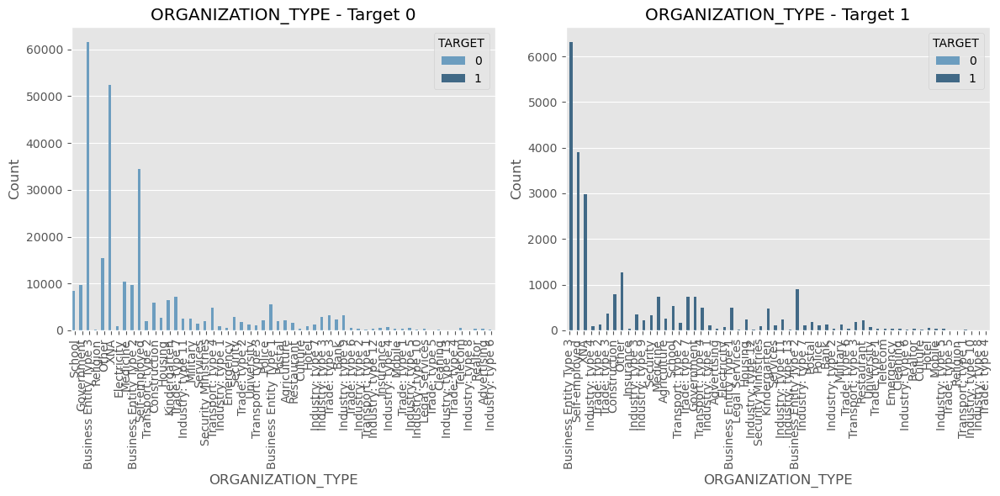

In [96]:
plt.style.use('ggplot')

for i in objList:
    # Print value counts for each category in the column for both target values
    print("Target 0:")
    print(app_data_t0[i].value_counts(normalize=True)*100)
    print("\n")
    print("Target 1:")
    print(app_data_t1[i].value_counts(normalize=True)*100)

    # Create side-by-side count plots for the current column and both target values
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    sns.countplot(x=i, data=app_data_t0, hue="TARGET", palette="Blues_d")
    plt.title(f"{i} - Target 0")
    plt.xlabel(i)
    plt.ylabel("Count")
    plt.xticks(rotation=90)

    plt.subplot(1, 2, 2)
    sns.countplot(x=i, data=app_data_t1, hue="TARGET", palette="Blues_d")
    plt.title(f"{i} - Target 1")
    plt.xlabel(i)
    plt.ylabel("Count")
    plt.xticks(rotation=90)

    plt.tight_layout()
    plt.show()


#### ANALYSIS :
<pre>
1. NAME_CONTRACT TYPE-"Cash Loans" constitute a significant portion of the company's portfolio, with approximately 90% for Target 0 and almost 94% for Target 1. This suggests a strong presence of cash loans across both target groups.

2. NAME_TYPE_SUIT - About 80% of applicants in both Target 0 and Target 1 are applying for loans as "Unaccompanied." This indicates that the applicant's type of suite may not be a significant parameter influencing payment default.

3. NAME_INCOME_TYPE -Approximately 51% of applicants in Target 0 and 61% in Target 1 belong to the "Working" income type. Further analysis is needed to understand the correlation between income type and payment default.

4. NAME_EDUCATION_TYPE - Applicants with "Secondary Education" dominate both Target 0 and Target 1. Nearly 70-80% of defaulting payments are from applicants with secondary education. This calls for deeper analysis to explore the relationship between education level  and default rates. But we can't infere as the data is not balanced.

5. NAME_FAMILY_STATUS - "Married" applicants constitute almost 60-65% of defaulters. Understanding the reasons behind the higher default rates among married individuals could be crucial for risk assessment

6. NAME_HOUSING_TYPE -Approximately 85-90% of applicants in both Target 0 and Target 1 are staying in "House/Apartment." This suggests that housing type may not be a significant factor influencing payment default.

7. OCCUPATION_TYPE - Common occupations such as "Labourers," "Sales Staff," "Core Staff,"  collectively make up 60% of defaulters."Labourers" have the highest percentage of applicants and defaulters. A detailed analysis of these occupations can provide insights into the default patterns.

8. ORGANIZATION_TYPE - "Business Entity Type 3" and "Self-Employed" together contribute to 40% of defaulters. Interestingly, these categories also have the highest percentage of loan takers. Further exploration is needed to understand the specific characteristics of these organizations and self-employed individuals in relation to loan defaults.

9. WEEKDAY_APPR_START-Since, all the days have almost same percentage. Hence, it's not a significant parameter influencing the payment default.

### Univariate Analysis- Categorical Ordered (Both Dataframes)

Target 0:
0    65.68264
1    34.31736
Name: FLAG_OWN_CAR, dtype: float64


Target 1:
0    69.482377
1    30.517623
Name: FLAG_OWN_CAR, dtype: float64


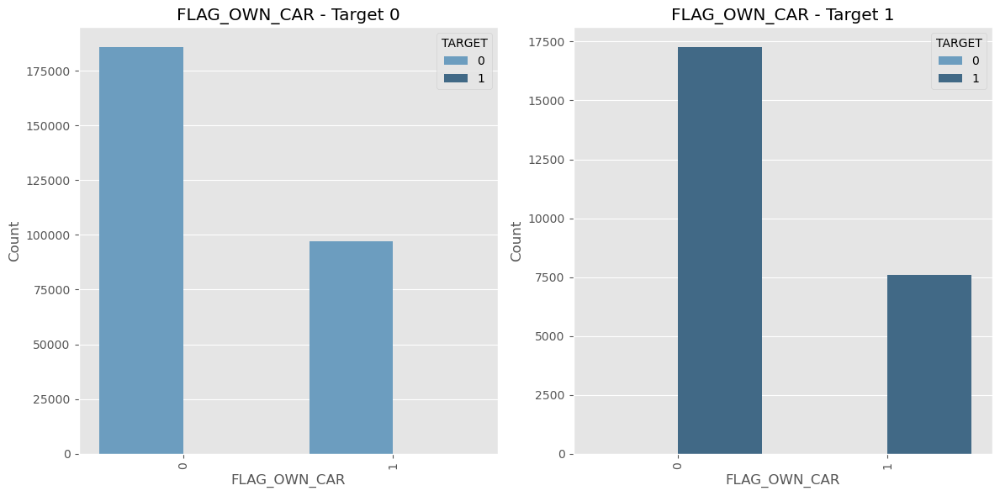

Target 0:
1    69.450832
0    30.549168
Name: FLAG_OWN_REALTY, dtype: float64


Target 1:
1    68.410876
0    31.589124
Name: FLAG_OWN_REALTY, dtype: float64


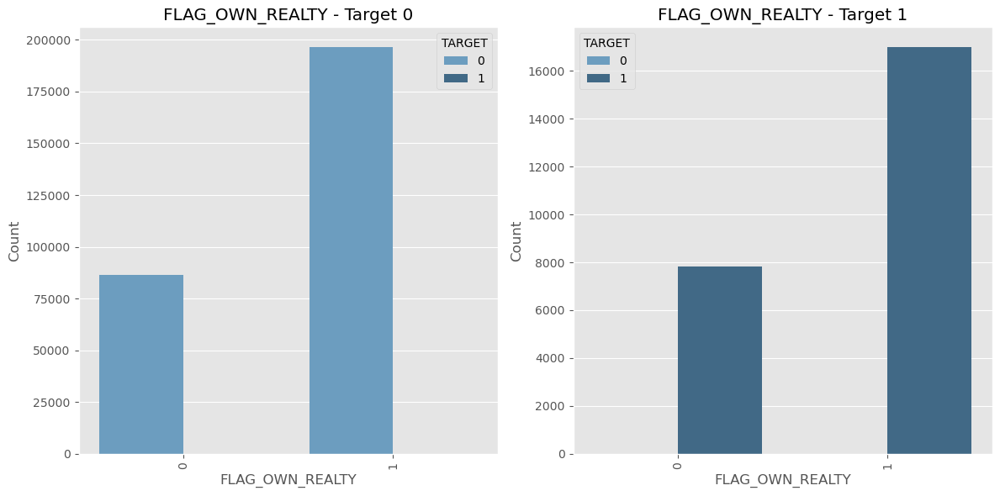

Target 0:
2    73.960846
3    15.198350
1    10.840803
Name: REGION_RATING_CLIENT, dtype: float64


Target 1:
2    72.132931
3    21.615307
1     6.251762
Name: REGION_RATING_CLIENT, dtype: float64


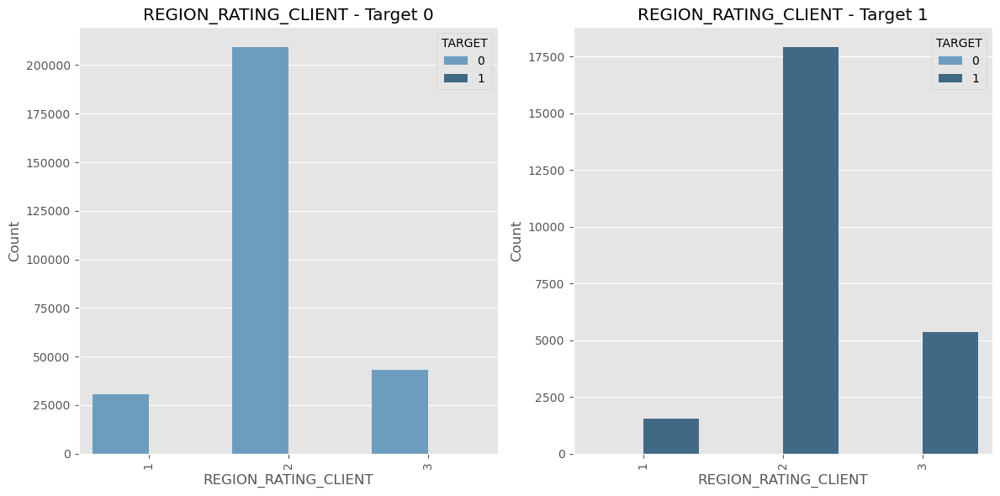

Target 0:
2    74.752195
3    13.746188
1    11.501617
Name: REGION_RATING_CLIENT_W_CITY, dtype: float64


Target 1:
2    73.192346
3    20.145015
1     6.662638
Name: REGION_RATING_CLIENT_W_CITY, dtype: float64


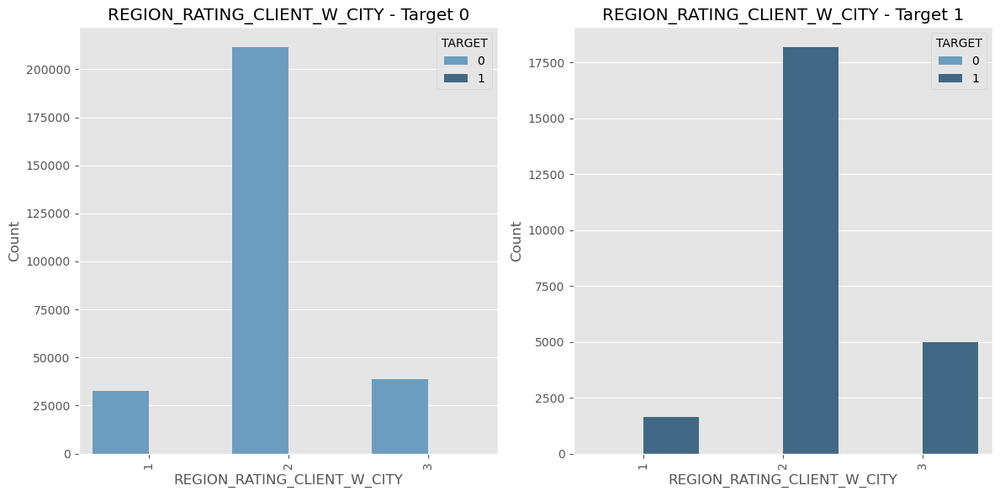

Target 0:
0    98.505741
1     1.494259
Name: REG_REGION_NOT_LIVE_REGION, dtype: float64


Target 1:
0    98.255791
1     1.744209
Name: REG_REGION_NOT_LIVE_REGION, dtype: float64


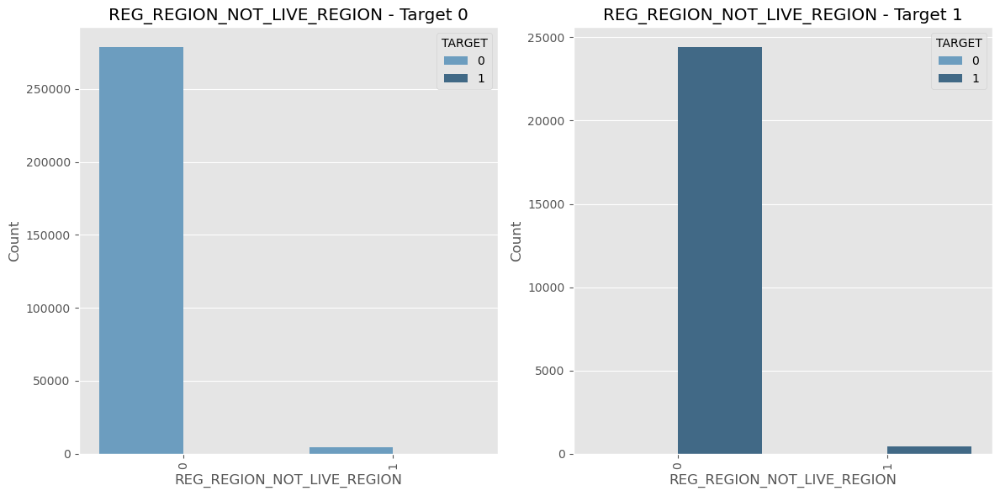

Target 0:
0    94.968197
1     5.031803
Name: REG_REGION_NOT_WORK_REGION, dtype: float64


Target 1:
0    94.408862
1     5.591138
Name: REG_REGION_NOT_WORK_REGION, dtype: float64


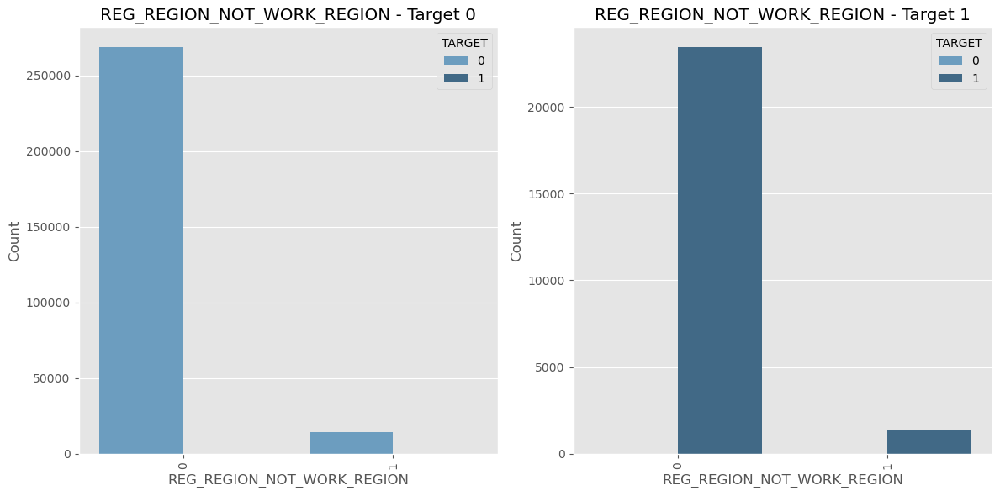

Target 0:
0    95.950573
1     4.049427
Name: LIVE_REGION_NOT_WORK_REGION, dtype: float64


Target 1:
0    95.746224
1     4.253776
Name: LIVE_REGION_NOT_WORK_REGION, dtype: float64


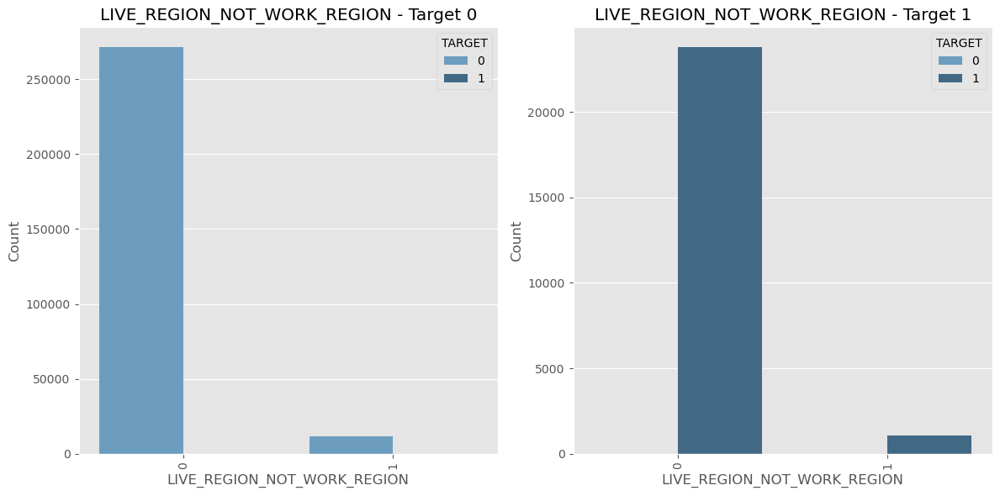

Target 0:
0    92.535782
1     7.464218
Name: REG_CITY_NOT_LIVE_CITY, dtype: float64


Target 1:
0    88.161128
1    11.838872
Name: REG_CITY_NOT_LIVE_CITY, dtype: float64


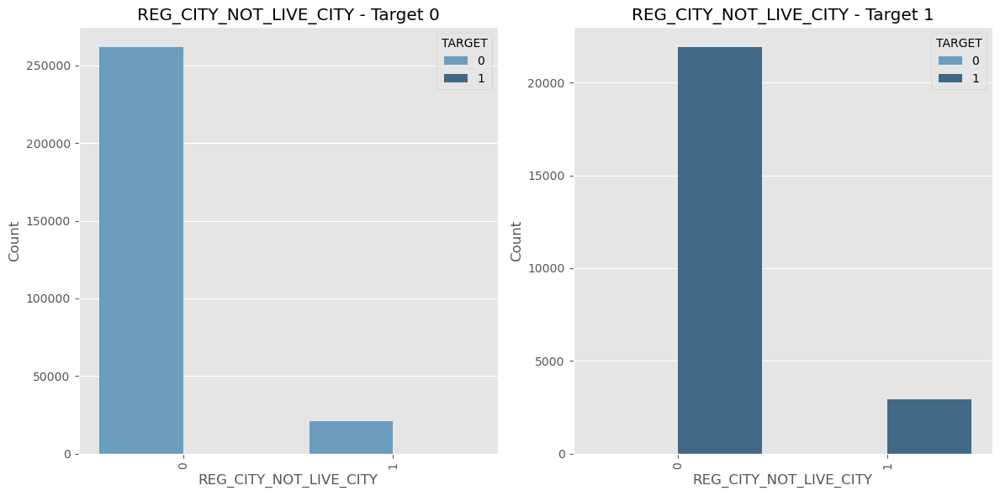

Target 0:
0    77.59072
1    22.40928
Name: REG_CITY_NOT_WORK_CITY, dtype: float64


Target 1:
0    69.707956
1    30.292044
Name: REG_CITY_NOT_WORK_CITY, dtype: float64


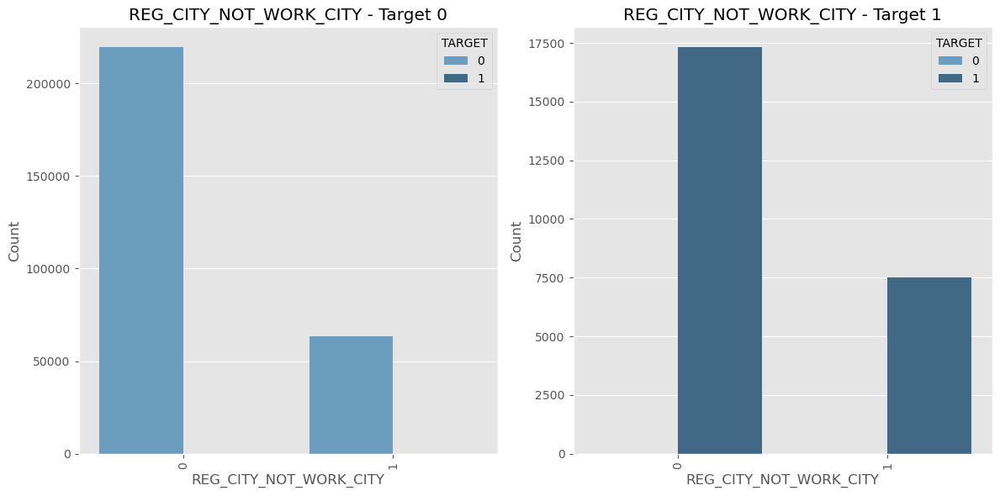

Target 0:
0    82.414161
1    17.585839
Name: LIVE_CITY_NOT_WORK_CITY, dtype: float64


Target 1:
0    77.83283
1    22.16717
Name: LIVE_CITY_NOT_WORK_CITY, dtype: float64


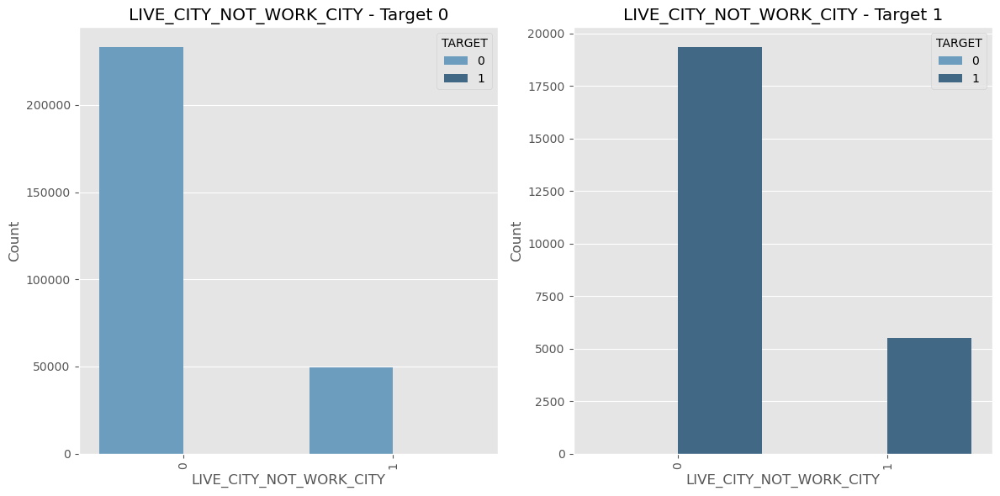

Target 0:
Female    66.60417
Male      33.39583
Name: CODE_GENDER, dtype: float64


Target 1:
Female    57.079557
Male      42.920443
Name: CODE_GENDER, dtype: float64


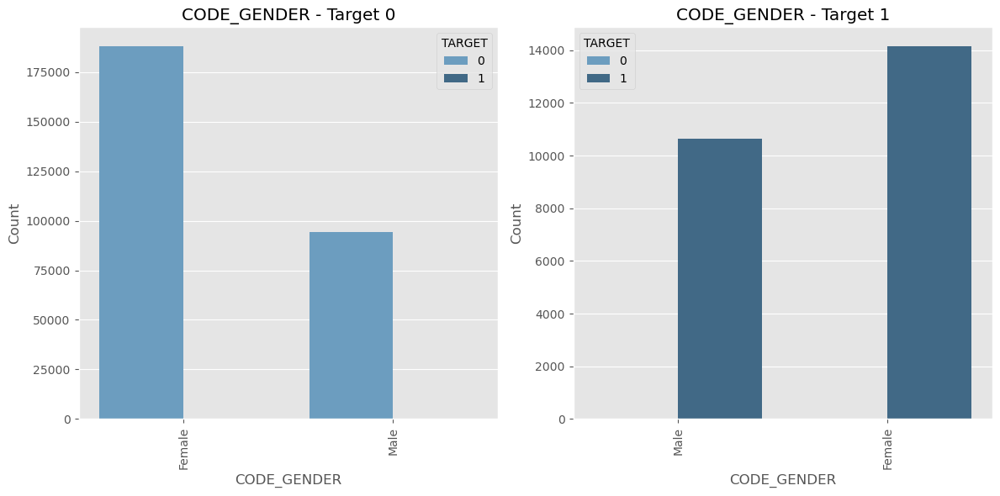

In [97]:
plt.style.use('ggplot')

for i in catList:
    # Print value counts for each category in the column for both target values
    print("Target 0:")
    print(app_data_t0[i].value_counts(normalize=True)*100)
    print("\n")
    print("Target 1:")
    print(app_data_t1[i].value_counts(normalize=True)*100)

    # Create side-by-side count plots for the current column and both target values
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    sns.countplot(x=i, data=app_data_t0, hue="TARGET", palette="Blues_d")
    plt.title(f"{i} - Target 0")
    plt.xlabel(i)
    plt.ylabel("Count")
    plt.xticks(rotation=90)

    plt.subplot(1, 2, 2)
    sns.countplot(x=i, data=app_data_t1, hue="TARGET", palette="Blues_d")
    plt.title(f"{i} - Target 1")
    plt.xlabel(i)
    plt.ylabel("Count")
    plt.xticks(rotation=90)

    plt.tight_layout()
    plt.show()

### ANALYSIS

<pre>
1)FLAG_OWN_CAR and FLAG_OWN_REALTY:
Around 70% of both the group doesn't own car and house.

2)REGION_RATING_CLIENT & REGION_RATING_CLIENT_W_CITY:
The dominance of Region 2 in both Target 0 and Target 1 indicates a concentrated presence of loan applicants. Further investigation is needed to understand the relationship between region ratings and default rates.

3)REGIONAL DISTRIBUTION:
'REG_REGION_NOT_LIVE_REGION,' 'REGION_NOT_WORK_REGION,' and 'LIVE_REGION_NOT_WORK_REGION' show a low prevalence of applicants outside their regions, suggesting that regional disparities may not be a significant factor influencing default rates.

4)ADDRESS CONSISTENCY:Higher default ratios for 'REG_CITY_NOT_LIVE_CITY' and 'REG_CITY_NOT_WORK_CITY' indicate that having a different permanent address may contribute to a higher risk of default.

5)GENDER IMPACT:The gender-based analysis reveals a notable difference in default rates between male and female applicants. Further exploration into socio-economic factors and their correlation with default rates for different genders is essential.


### Univariate Analysis- Numerical Variables

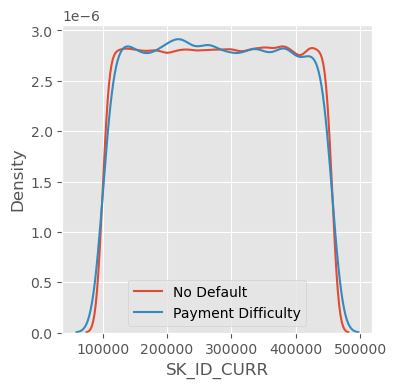

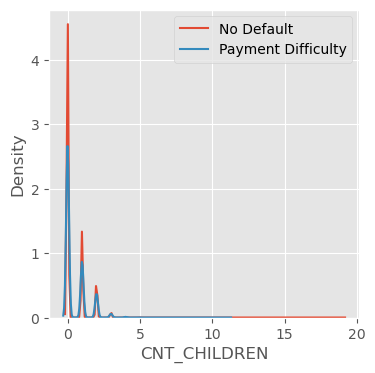

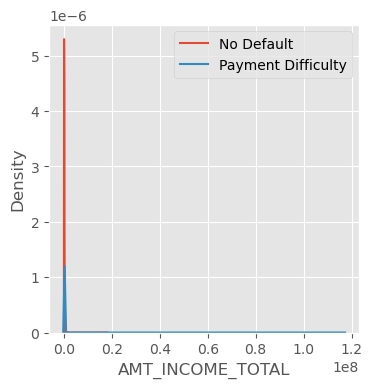

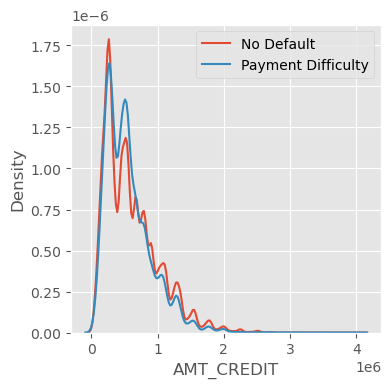

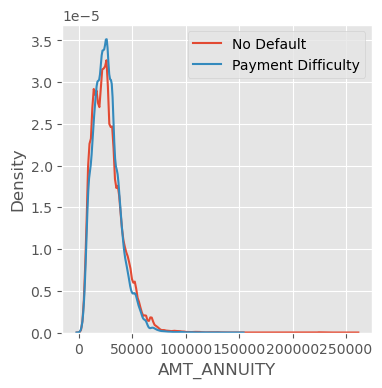

...

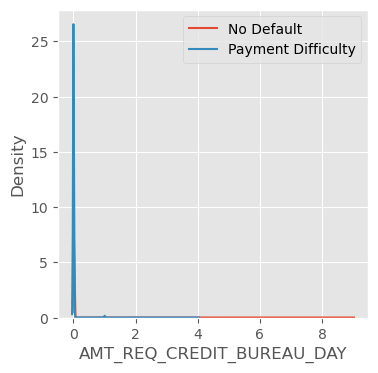

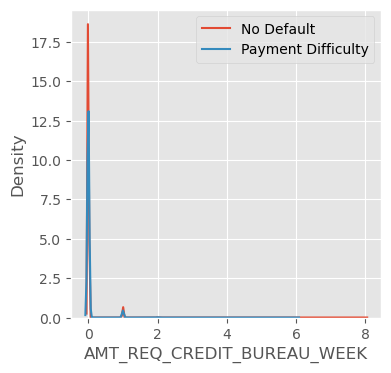

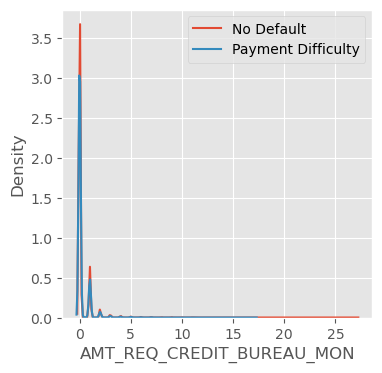

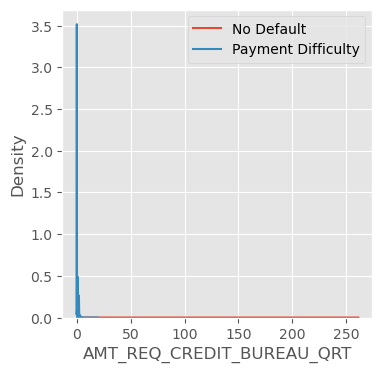

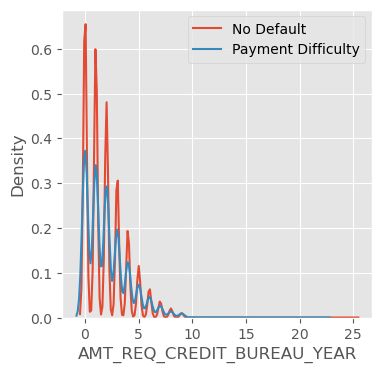

In [98]:
for i in numList:
    plt.figure(figsize=[4,4])
    sns.distplot(app_data_t0[i], hist=False, label='No Default')
    sns.distplot(app_data_t1[i], hist=False, label='Payment Difficulty')
    plt.legend()
    plt.show()


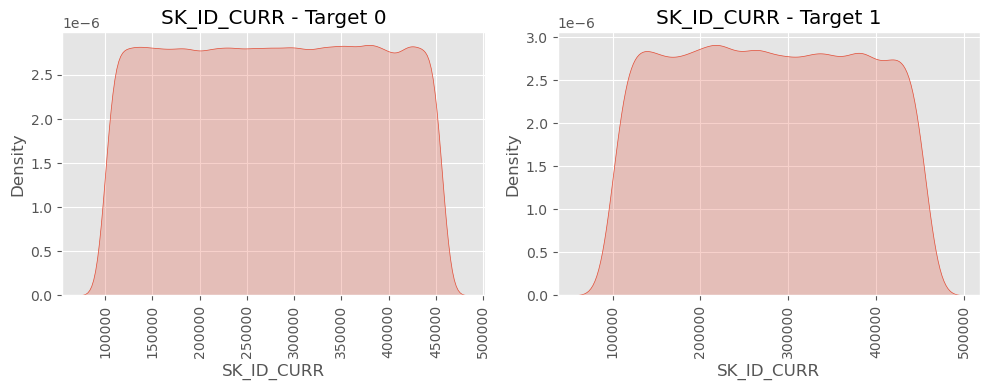

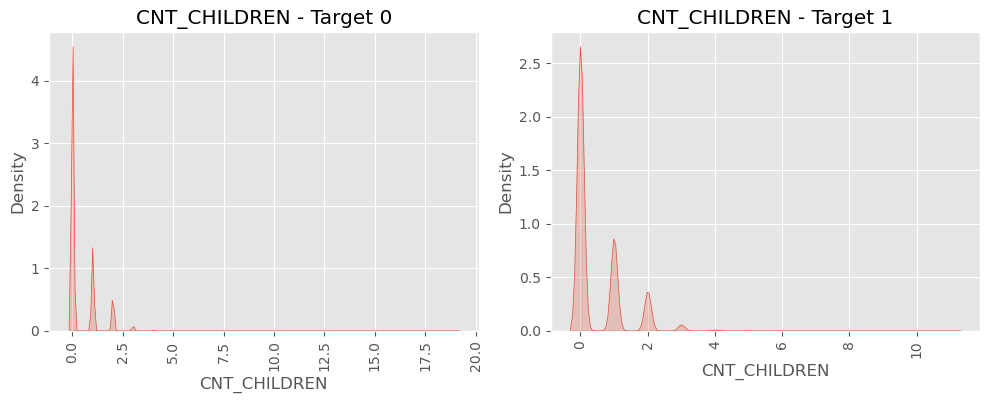

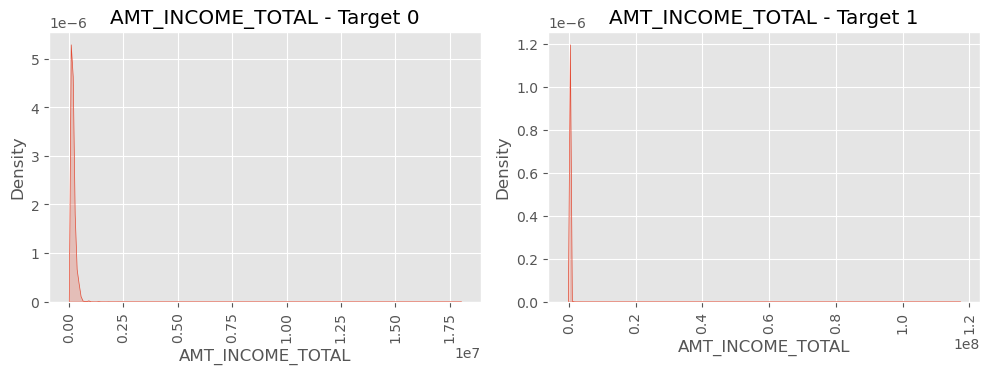

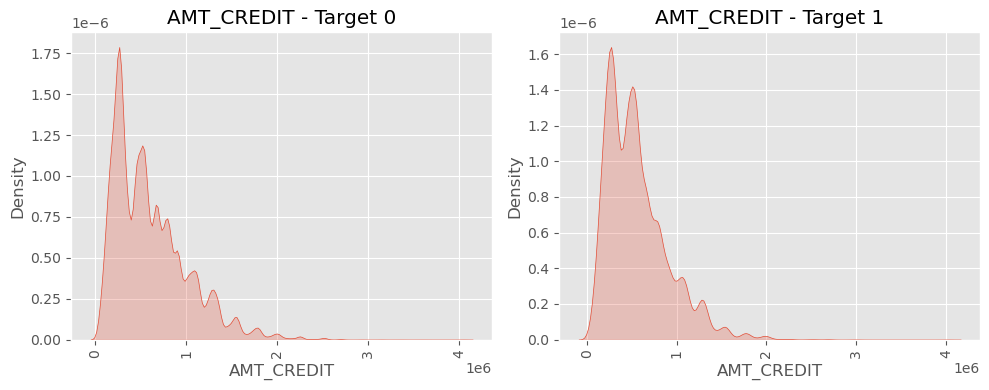

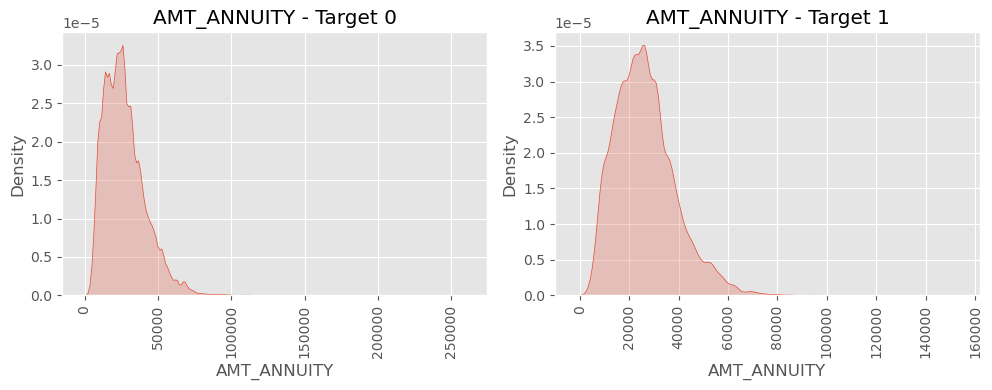

...

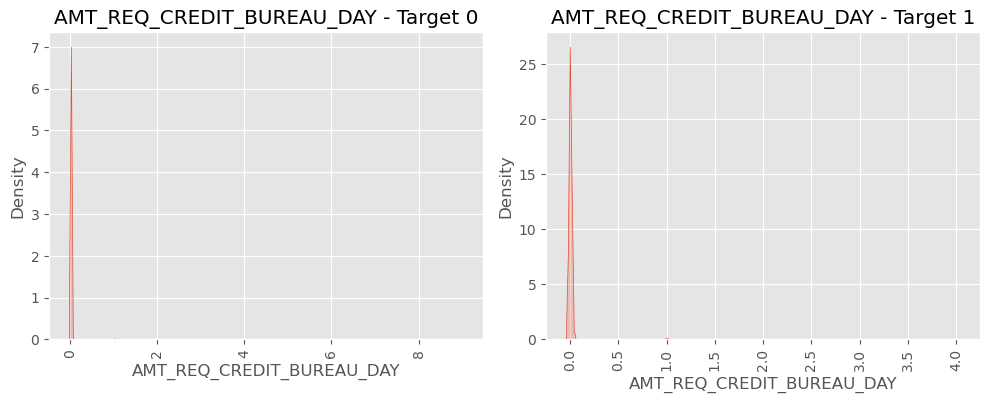

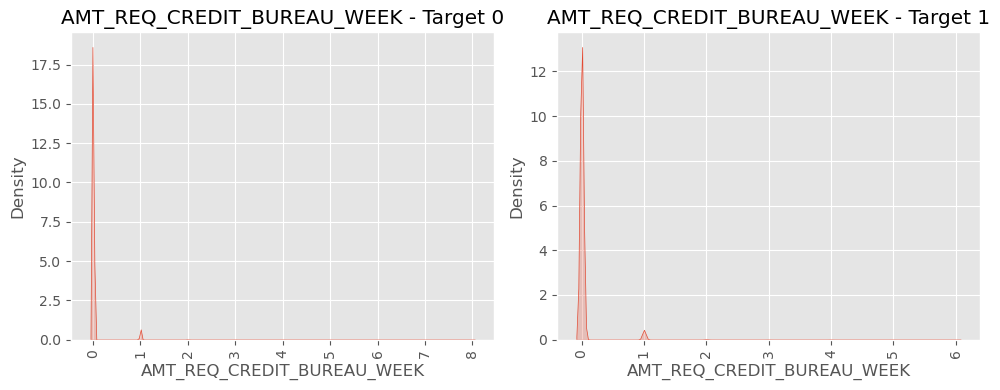

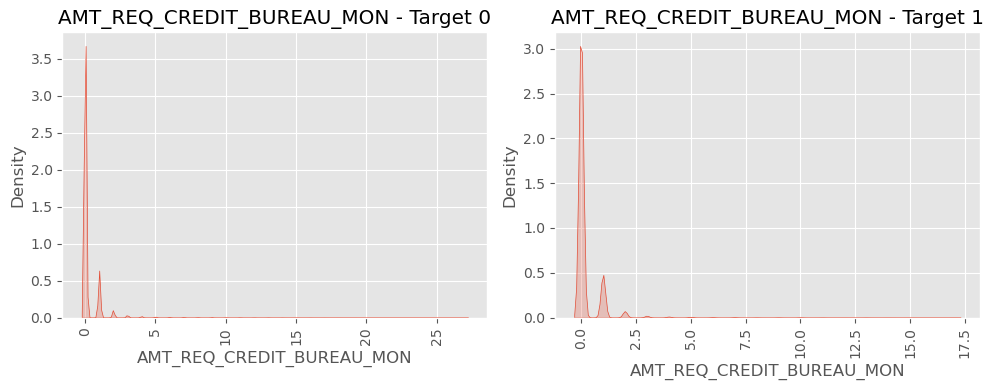

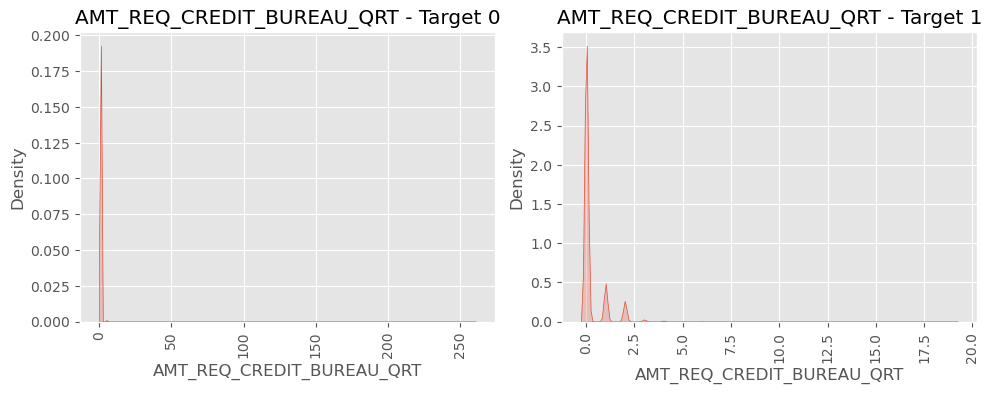

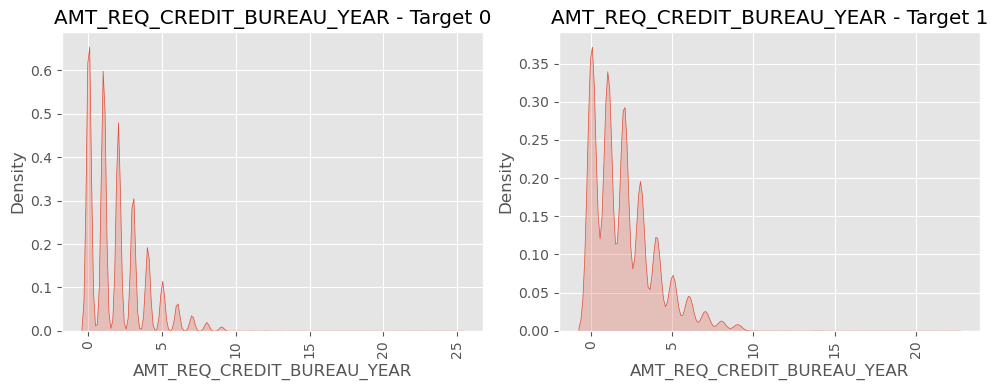

In [99]:


plt.style.use('ggplot')

for i in numList:

    # Create side-by-side distribution plots for the current column and both target values
    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    sns.distplot(app_data_t0[i], hist=False, label='TARGET 0', kde_kws={'shade': True})
    plt.title(f"{i} - Target 0")
    plt.xlabel(i)
    plt.ylabel("Density")
    plt.xticks(rotation=90)

    plt.subplot(1, 2, 2)
    sns.distplot(app_data_t1[i], hist=False, label='TARGET 1', kde_kws={'shade': True})
    plt.title(f"{i} - Target 1")
    plt.xlabel(i)
    plt.ylabel("Density")
    plt.xticks(rotation=90)

    plt.tight_layout()
    plt.show()


### Analysis

<pre>
1)'SK_ID_CURR'-Not required for analysis as the id doesn't affect the target variable much

2)'CNT_CHILDREN'-Lenders may consider the number of children as a potential factor in risk assessment. While it's not a direct cause-and-effect relationship as per the analysis. Here, non defaulters hve the higher number of children

3)'AMT_INCOME_TOTAL'-Income of non defaulters seems to be high than defaulters and this makes sense as high income applicants are possibly be in place to repay loans on time

4)'AMT_CREDIT'-The average credit amount (AMT_CREDIT) appears lower for Target 1, suggesting that applicants with lower credit amounts are associated with a higher likelihood of default. This could be a positive sign for the company, indicating potentially lower default losses.

5)'BIRTH_YEARS'-The density of applicants is larger in Target 1, implying that younger individuals are defaulting more. This insight highlights the importance of age as a factor in predicting payment difficulties.

6)'YEARS_EMPLOYED'-The variable "YEARS_EMPLOYED" contains a large number of rows with incorrect data as we have suggested way in outlier treatment section of this case study, affecting the accuracy of data representation. 

7)'EXT_SOURCE_2'-The density plot for EXT_SOURCE_2 clearly indicates that TARGET 0 has a higher density of higher credit scores. This suggests that applicants with higher credit scores are less likely to default.

8)'EXT_SOURCE_3'-The density plot for EXT_SOURCE_3 clearly indicates that TARGET 0 has a higher density of higher credit scores. This suggests that applicants with higher credit scores are less likely to default.

9)'DAYS_LAST_PHONE_CHANGE'-More applicants in Target 1 have changed their phone numbers earlier than those in Target 0. This observation may indicate instability or intention issues in repaying loans.

10)AMT_REQ_CREDIT_BUREAU_YEAR, month, week, and hour variables show that fewer applicants in Target 1 have zero hits in credit bureau inquiries. This suggests that individuals in Target 1 may be actively seeking loans from various financial institutions, potentially signaling higher credit-seeking behavior.

### Univariate Analysis- Numerical Variables-Binned list

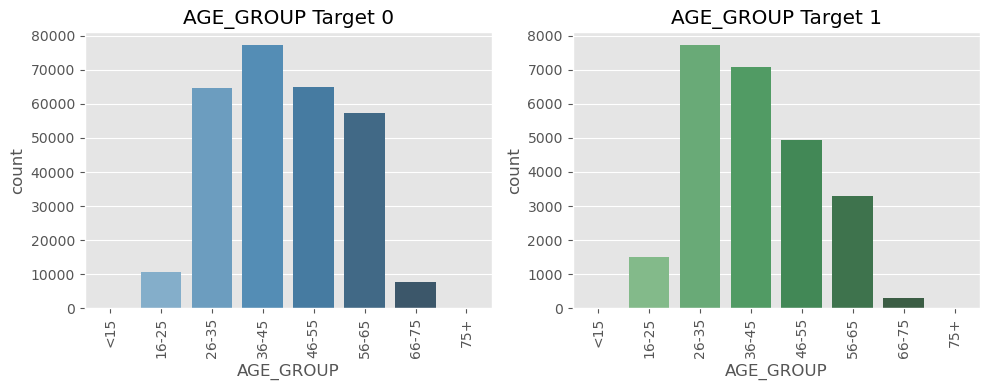

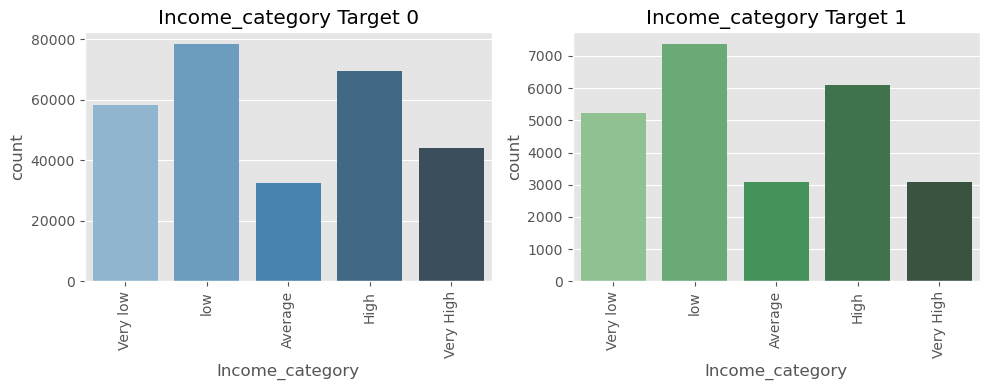

In [100]:
for i in binned_list:
    plt.figure(figsize=(10,4))
    plt.subplot(1, 2, 1)
    plt.title(i+" "+"Target 0")
    plt.xlabel(i)
    plt.xticks(rotation=90)
    sns.countplot(x=i,data=app_data_t0,palette="Blues_d")
    
    plt.subplot(1, 2, 2)
    plt.title(i+" "+"Target 1")
    plt.xlabel(i)
    plt.xticks(rotation=90)
    sns.countplot(x=i,data=app_data_t1,palette="Greens_d")
    
    plt.tight_layout()
    plt.show()

### Analysis

<pre>
AGE_GROUP:

In Target 0, the age group of 36-45 has a higher count, suggesting that individuals in this age range are more prevalent among non-defaulters. On the other hand, in Target 1, the age group of 26-35 has a higher count, indicating that younger individuals are more represented among defaulters.
This observation suggests that age does indeed play a role in influencing loan default behavior. The difference in age distribution between the two targets highlights the need for tailored risk assessment strategies for different age groups.

INCOME_GROUP:

The low-income group appears to have a higher count in both Target 0 and Target 1. This implies that individuals with moderately low income levels are prevalent in both non-defaulters and defaulters.
While income level is an essential factor, the observation indicates that default behavior is not solely dependent on extreme income categories. It emphasizes the significance of other factors such as financial management, budgeting, and individual financial habits in determining loan repayment behavior.

### Bivariate Analysis

#### CATERGORICAL-NUMERICAL

In [101]:
# We will use below category and numerical variable for bivariate analysis for Cat-Num.

In [102]:
cat=["CODE_GENDER","AGE_GROUP","INCOME_GROUP",'NAME_EDUCATION_TYPE','OCCUPATION_TYPE']

In [103]:
num=["AMT_CREDIT","YEARS_EMPLOYED"]

In [104]:
objList

['NAME_CONTRACT_TYPE',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE']

In [105]:
binned_list

['AGE_GROUP', 'Income_category']

In [106]:
# Creating boxplots for the analysis of AGE_GROUP with Amt_Credited for both the targets without outliers

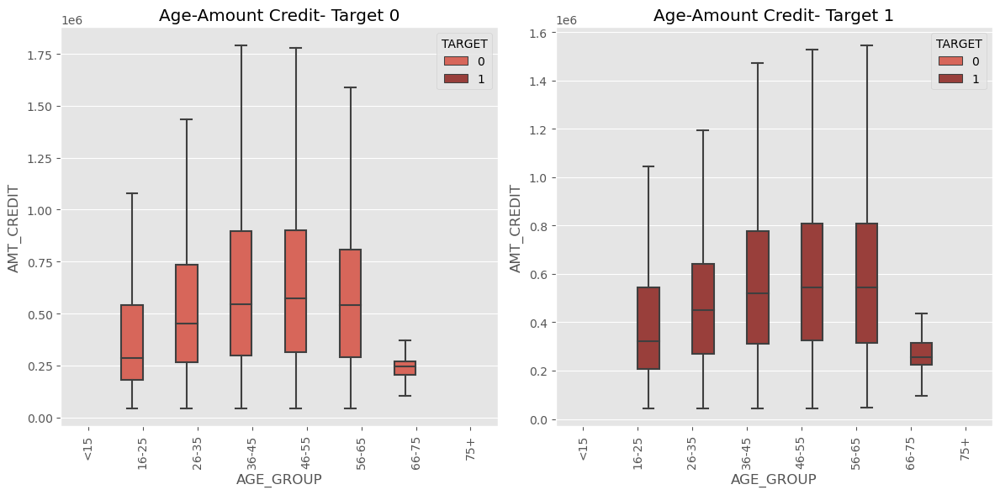

In [107]:
plt.style.use('ggplot')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.boxplot(x="AGE_GROUP",y="AMT_CREDIT", data=app_data_t0, hue="TARGET", palette="Reds_d",showfliers=False)
plt.title("Age-Amount Credit- Target 0")
plt.xlabel("AGE_GROUP")
plt.ylabel("AMT_CREDIT")
plt.xticks(rotation=90)

plt.subplot(1, 2, 2)
sns.boxplot(x="AGE_GROUP",y="AMT_CREDIT", data=app_data_t1, hue="TARGET", palette="Reds_d",showfliers=False)
plt.title("Age-Amount Credit- Target 1")
plt.xlabel("AGE_GROUP")
plt.ylabel("AMT_CREDIT")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [108]:
#Checking absolute values
##Outliers are present and we want to minimize their impact, using a quantile (e.g., 75th percentile) is a good choice.
res = pd.pivot_table(data=app_data, index='AGE_GROUP', columns='TARGET', values='AMT_CREDIT', aggfunc=lambda x: np.quantile(x, 0.75))
round(res, 2)


TARGET,0,1
AGE_GROUP,,
16-25,540000.0,545040.0
26-35,733315.5,640080.0
36-45,895500.0,778500.0
46-55,900000.0,808650.0
56-65,808650.0,808650.0
66-75,271066.5,313767.0


Non-defaulters tend to have higher 75th percentile loan amounts compared to defaulters across different age groups.
The pattern is not consistent across all age groups, and there are variations in the differences between non-defaulters and defaulters.

In [109]:
# Creating boxplots for the analysis of "CODE_GENDER" with "AMT_CREDITED" for both the targets without outliers

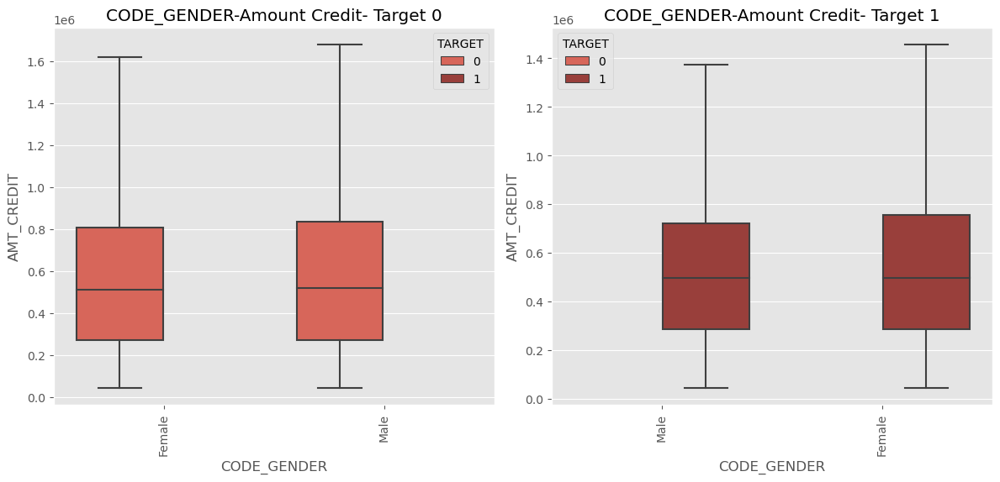

In [110]:
plt.style.use('ggplot')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.boxplot(x="CODE_GENDER",y="AMT_CREDIT", data=app_data_t0, hue="TARGET", palette="Reds_d",showfliers=False)
plt.title("CODE_GENDER-Amount Credit- Target 0")
plt.xlabel("CODE_GENDER")
plt.ylabel("AMT_CREDIT")
plt.xticks(rotation=90)

plt.subplot(1, 2, 2)
sns.boxplot(x="CODE_GENDER",y="AMT_CREDIT", data=app_data_t1, hue="TARGET", palette="Reds_d",showfliers=False)
plt.title("CODE_GENDER-Amount Credit- Target 1")
plt.xlabel("CODE_GENDER")
plt.ylabel("AMT_CREDIT")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

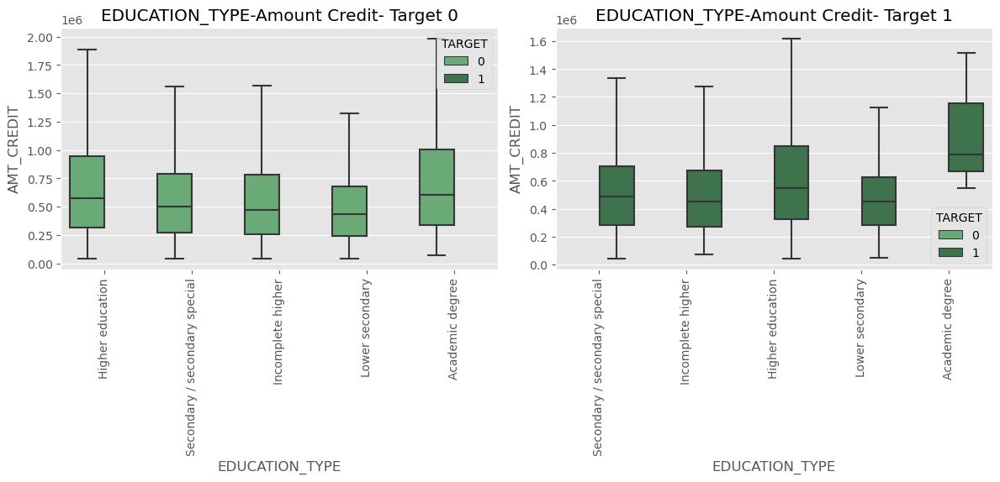

In [111]:
# Creating boxplots for the analysis of "EDUCATION_TYPE" with "AMT_CREDITED" for both the targets without outliers

plt.style.use('ggplot')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.boxplot(x="NAME_EDUCATION_TYPE",y="AMT_CREDIT", data=app_data_t0, hue="TARGET", palette="Greens_d",showfliers=False)
plt.title("EDUCATION_TYPE-Amount Credit- Target 0")
plt.xlabel("EDUCATION_TYPE")
plt.ylabel("AMT_CREDIT")
plt.xticks(rotation=90)

plt.subplot(1, 2, 2)
sns.boxplot(x="NAME_EDUCATION_TYPE",y="AMT_CREDIT", data=app_data_t1, hue="TARGET", palette="Greens_d",showfliers=False)
plt.title("EDUCATION_TYPE-Amount Credit- Target 1")
plt.xlabel("EDUCATION_TYPE")
plt.ylabel("AMT_CREDIT")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [112]:
#Pivot table for amt credited for code_Gender and different occupation type-Defaulters 
res = pd.pivot_table(data=app_data_t1, index='NAME_EDUCATION_TYPE', columns='CODE_GENDER', values='AMT_CREDIT', aggfunc=lambda x: np.quantile(x, 0.75))
round(res, 2)

CODE_GENDER,Female,Male
NAME_EDUCATION_TYPE,,
Academic degree,1153122.75,NaN
Higher education,877500.00,832797.00
Incomplete higher,675000.00,699976.12
Lower secondary,599355.00,640080.00
Secondary / secondary special,724248.00,679500.00


Inference: Male are having maximum chances to be defaulters as per the analysis.Amount credited is maximum in this case but number of applicants with this degree is very less.

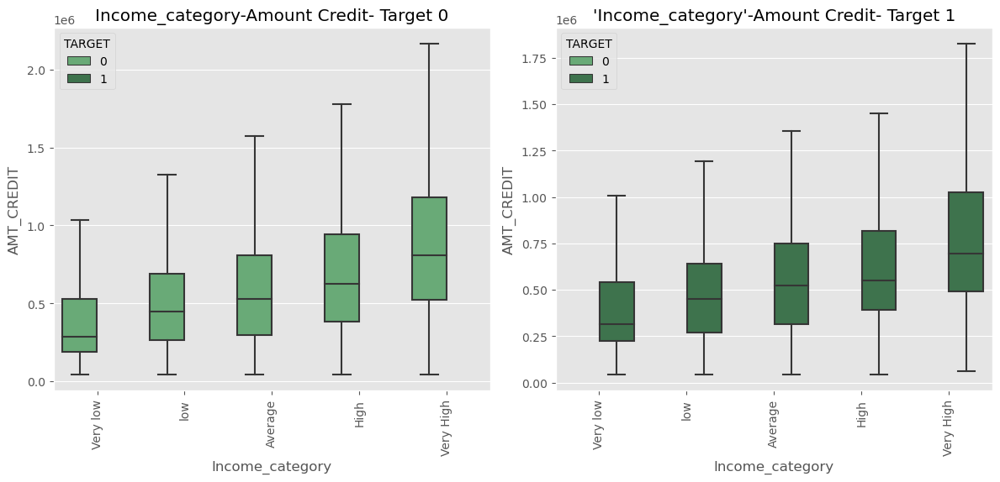

In [113]:
#INCOME_GROUP and AMT_CREDITED
plt.style.use('ggplot')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.boxplot(x="Income_category",y="AMT_CREDIT", data=app_data_t0, hue="TARGET", palette="Greens_d",showfliers=False)
plt.title("Income_category-Amount Credit- Target 0")
plt.xlabel("Income_category")
plt.ylabel("AMT_CREDIT")
plt.xticks(rotation=90)

plt.subplot(1, 2, 2)
sns.boxplot(x="Income_category",y="AMT_CREDIT", data=app_data_t1, hue="TARGET", palette="Greens_d",showfliers=False)
plt.title("'Income_category'-Amount Credit- Target 1")
plt.xlabel("Income_category")
plt.ylabel("AMT_CREDIT")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

Inference- Here we can see that High Income Group has more defaulters.This might create problem for lenders as high amount are credited by this group which might result in loss

In [114]:
# To get numerical data we can create a pivot table. We can see their education type as well
res = pd.pivot_table(data=app_data, index='Income_category', columns="TARGET", values='AMT_CREDIT', aggfunc=np.mean)
round(res, 2)

TARGET,0,1
Income_category,,
Very low,385910.06,401071.08
low,515986.19,496230.92
Average,604603.35,574222.52
High,699633.39,643297.93
Very High,890194.28,786021.83


### Catagorical-Categorical Analysis

In [115]:
objList

['NAME_CONTRACT_TYPE',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE']

####  NAME_EDUCATION_TYPE and CODE_GENDER for Target 0 and Target 1-Bar plots

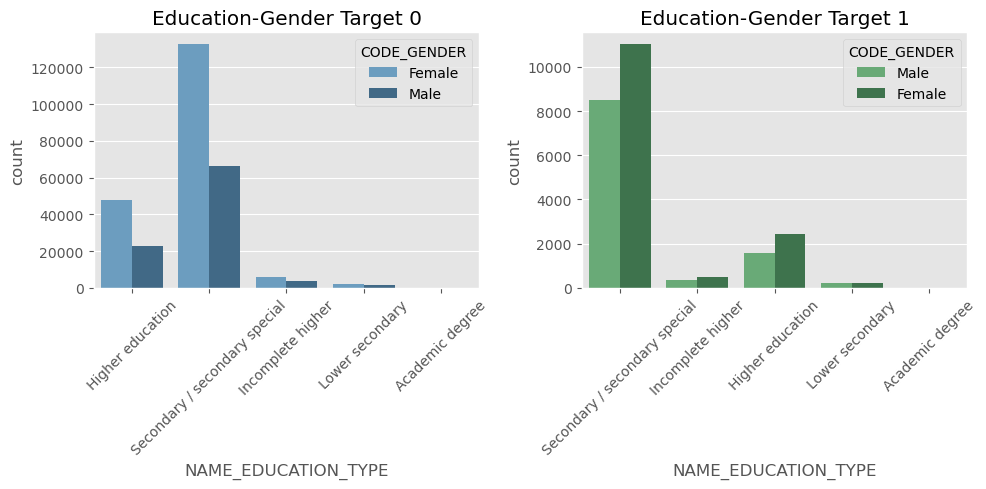

In [271]:
plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1)
plt.title("Education-Gender"+" "+"Target 0")
plt.xlabel("Education")
plt.xticks(rotation=45)
sns.countplot(x="NAME_EDUCATION_TYPE",data=app_data_t0,hue="CODE_GENDER",palette="Blues_d")
    
plt.subplot(1, 2, 2)
plt.title("Education-Gender"+" "+"Target 1")
plt.xlabel("Education")
plt.xticks(rotation=45)
sns.countplot(x="NAME_EDUCATION_TYPE",data=app_data_t1,hue="CODE_GENDER",palette="Greens_d")
    
plt.tight_layout()
plt.show()

#### Inference:
<pre>
1)The analysis suggests that a significant number of females with secondary education are non-defaulters (120,000), indicating that a large proportion of this group has successfully managed their loan repayments.
2)Even the female applicants are higher the ratio of male being defaulters is higher out of total male applicants.

In [117]:
contingency_table = pd.crosstab([app_data["NAME_EDUCATION_TYPE"], app_data['CODE_GENDER']], app_data['TARGET'], margins=True, margins_name='Total')

# Display the contingency table
print(contingency_table)

TARGET                                          0      1   Total
NAME_EDUCATION_TYPE           CODE_GENDER                       
Academic degree               Female           97      3     100
                              Male             64      0      64
Higher education              Female        47851   2438   50289
                              Male          23002   1571   24573
Incomplete higher             Female         5779    504    6283
                              Male           3625    368    3993
Lower secondary               Female         2097    214    2311
                              Male           1302    203    1505
Secondary / secondary special Female       132454  11011  143465
                              Male          66411   8513   74924
Total                                      282682  24825  307507


#### OCCUPATION_TYPE and CODE_GENDER


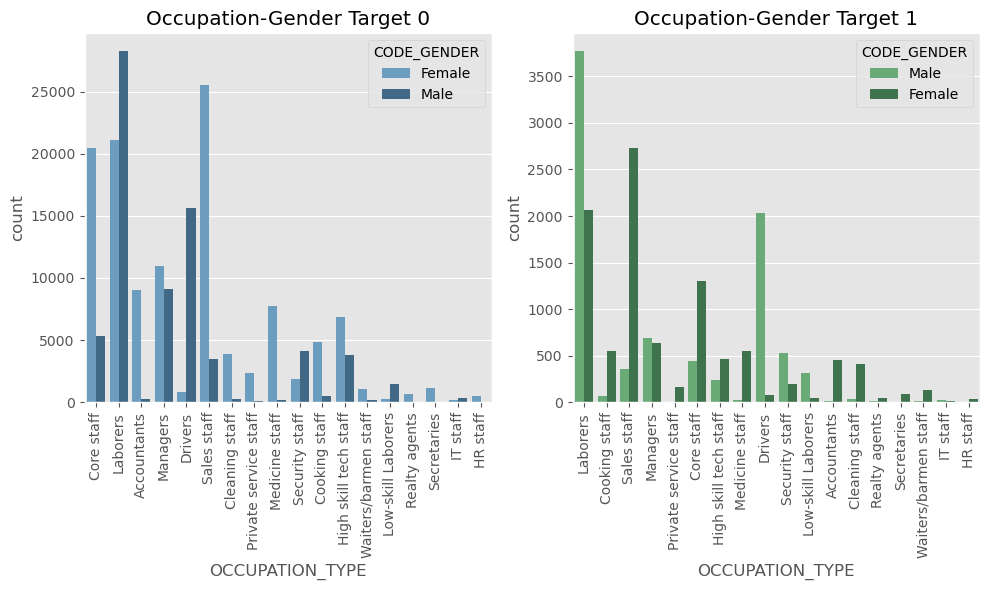

In [118]:
plt.figure(figsize=(10,6))
plt.subplot(1, 2, 1)
plt.title("Occupation-Gender"+" "+"Target 0")
plt.xlabel("Occupation")
plt.xticks(rotation=90)
sns.countplot(x="OCCUPATION_TYPE",data=app_data_t0,hue="CODE_GENDER",palette="Blues_d")
    
plt.subplot(1, 2, 2)
plt.title("Occupation-Gender"+" "+"Target 1")
plt.xlabel("Occupation")
plt.xticks(rotation=90)
sns.countplot(x="OCCUPATION_TYPE",data=app_data_t1,hue="CODE_GENDER",palette="Greens_d")
    
plt.tight_layout()
plt.show()

In [119]:
contingency_table = pd.crosstab([app_data["OCCUPATION_TYPE"], app_data['CODE_GENDER']], app_data['TARGET'], margins=True, margins_name='Total')

# Display the contingency table
print(contingency_table)

TARGET                                  0      1   Total
OCCUPATION_TYPE       CODE_GENDER                       
Accountants           Female         9072    457    9529
                      Male            267     17     284
Cleaning staff        Female         3904    410    4314
                      Male            302     37     339
Cooking staff         Female         4830    555    5385
                      Male            495     66     561
Core staff            Female        20481   1300   21781
                      Male           5350    438    5788
Drivers               Female          847     78     925
                      Male          15649   2029   17678
HR staff              Female          491     33     524
                      Male             36      3      39
High skill tech staff Female         6885    465    7350
                      Male           3794    236    4030
IT staff              Female          148     10     158
                      Male     

### Inference:
<pre>
1)The data suggests that being a male laborer might be associated with a higher risk of loan default compared to being a female laborer.
2)Lending institutions may need to consider this risk factor when assessing loan applications from individuals in the laborer occupation.

### NAME_CONTRACT TYPE AND OCCUPATION_TYPE

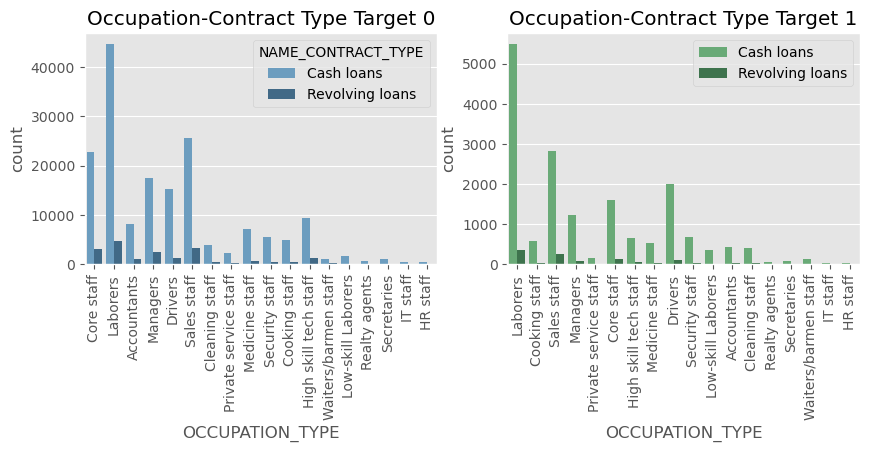

In [267]:
plt.figure(figsize=(10,3))
plt.subplot(1, 2, 1)
plt.title("Occupation-Contract Type"+" "+"Target 0")
plt.xlabel("Occupation Type")
plt.xticks(rotation=90)
sns.countplot(x="OCCUPATION_TYPE",data=app_data_t0,hue="NAME_CONTRACT_TYPE",palette="Blues_d")
    
plt.subplot(1, 2, 2)
plt.title("Occupation-Contract Type"+" "+"Target 1")
plt.xlabel("Occupation Type")
plt.xticks(rotation=90)
sns.countplot(x="OCCUPATION_TYPE",data=app_data_t1,hue="NAME_CONTRACT_TYPE",palette="Greens_d")
plt.legend(bbox_to_anchor=(1,1))
plt.show()

In [121]:
contingency_table = pd.crosstab([app_data["OCCUPATION_TYPE"], app_data['NAME_CONTRACT_TYPE']], app_data['TARGET'], margins=True, margins_name='Total')

# Display the contingency table
print(contingency_table)

TARGET                                         0      1   Total
OCCUPATION_TYPE       NAME_CONTRACT_TYPE                       
Accountants           Cash loans            8173    434    8607
                      Revolving loans       1166     40    1206
Cleaning staff        Cash loans            3826    409    4235
                      Revolving loans        380     38     418
Cooking staff         Cash loans            4860    577    5437
                      Revolving loans        465     44     509
Core staff            Cash loans           22765   1609   24374
                      Revolving loans       3066    129    3195
Drivers               Cash loans           15246   2002   17248
                      Revolving loans       1250    105    1355
HR staff              Cash loans             445     33     478
                      Revolving loans         82      3      85
High skill tech staff Cash loans            9365    643   10008
                      Revolving loans   

### Inference:
1) Cash loans applicants are higer than Revolving loans applicants.Cash loans labourers defaulters are higher in ratio as compared to other occupation types

### Finding Top 10 correlations

In [122]:
numList

['SK_ID_CURR',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'BIRTH_YEARS',
 'YEARS_EMPLOYED',
 'YEARS_REGISTRATION',
 'YEARS_ID_PUBLISH',
 'CNT_FAM_MEMBERS',
 'HOUR_APPR_PROCESS_START',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'DAYS_LAST_PHONE_CHANGE',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR']

In [123]:
# Source of code: Chatgpt

import numpy as np

app_corr_t0=app_data_t0.drop(catList,axis=1)
# Calculate the correlation matrix for numerical variables
corr = app_corr_t0.corr().abs()

# Extract the upper triangle of the correlation matrix (excluding the diagonal)
upper_triangle = np.triu(np.ones(corr.shape), k=1).astype(bool)
corr_df = corr.where(upper_triangle).unstack().reset_index()

# Rename columns for clarity
corr_df.columns = ['Column1', 'Column2', 'Correlation']

# Drop rows with missing (NaN) values in the 'Correlation' column
corr_df.dropna(subset=['Correlation'], inplace=True)

# Calculate absolute correlation values
corr_df['Abs_Correlation'] = corr_df['Correlation'].abs()

# Sort the DataFrame by absolute correlation values in descending order
corr_df = corr_df.sort_values(by='Abs_Correlation', ascending=False)

# Display the top 10 correlations
top_10_correlations = corr_df.head(10)
print(top_10_correlations)


                Column1           Column2  Correlation  Abs_Correlation
113     AMT_GOODS_PRICE        AMT_CREDIT     0.987253         0.987253
243     CNT_FAM_MEMBERS      CNT_CHILDREN     0.878570         0.878570
114     AMT_GOODS_PRICE       AMT_ANNUITY     0.776686         0.776686
91          AMT_ANNUITY        AMT_CREDIT     0.771308         0.771308
183      YEARS_EMPLOYED       BIRTH_YEARS     0.626044         0.626044
90          AMT_ANNUITY  AMT_INCOME_TOTAL     0.418954         0.418954
112     AMT_GOODS_PRICE  AMT_INCOME_TOTAL     0.349461         0.349461
68           AMT_CREDIT  AMT_INCOME_TOTAL     0.342801         0.342801
155         BIRTH_YEARS      CNT_CHILDREN     0.336911         0.336911
205  YEARS_REGISTRATION       BIRTH_YEARS     0.332910         0.332910


In [124]:
import numpy as np

app_corr_t1=app_data_t1.drop(catList,axis=1)
# Calculate the correlation matrix for numerical variables
corr = app_corr_t1.corr().abs()

# Extract the upper triangle of the correlation matrix (excluding the diagonal)
upper_triangle = np.triu(np.ones(corr.shape), k=1).astype(bool)
corr_df = corr.where(upper_triangle).unstack().reset_index()

# Rename columns for clarity
corr_df.columns = ['Column1', 'Column2', 'Correlation']

# Drop rows with missing (NaN) values in the 'Correlation' column
corr_df.dropna(subset=['Correlation'], inplace=True)

# Calculate absolute correlation values
corr_df['Abs_Correlation'] = corr_df['Correlation'].abs()

# Sort the DataFrame by absolute correlation values in descending order
corr_df = corr_df.sort_values(by='Abs_Correlation', ascending=False)

# Display the top 10 correlations
top_10_correlations = corr_df.head(10)
print(top_10_correlations)

                       Column1                     Column2  Correlation  \
113            AMT_GOODS_PRICE                  AMT_CREDIT     0.983103   
243            CNT_FAM_MEMBERS                CNT_CHILDREN     0.885484   
114            AMT_GOODS_PRICE                 AMT_ANNUITY     0.752699   
91                 AMT_ANNUITY                  AMT_CREDIT     0.752195   
183             YEARS_EMPLOYED                 BIRTH_YEARS     0.582446   
205         YEARS_REGISTRATION                 BIRTH_YEARS     0.288941   
155                BIRTH_YEARS                CNT_CHILDREN     0.259222   
227           YEARS_ID_PUBLISH                 BIRTH_YEARS     0.252306   
390  AMT_REQ_CREDIT_BUREAU_DAY  AMT_REQ_CREDIT_BUREAU_HOUR     0.246741   
228           YEARS_ID_PUBLISH              YEARS_EMPLOYED     0.229185   

     Abs_Correlation  
113         0.983103  
243         0.885484  
114         0.752699  
91          0.752195  
183         0.582446  
205         0.288941  
155         0

### Bivariate Analysis on Continuous Variables

In [125]:
bivcol1_T0=["AMT_GOODS_PRICE","CNT_FAM_MEMBERS","AMT_GOODS_PRICE","AMT_ANNUITY","YEARS_EMPLOYED","AMT_ANNUITY","AMT_GOODS_PRICE","AMT_CREDIT","BIRTH_YEARS","YEARS_REGISTRATION"]
bivcol2_T0=["AMT_CREDIT","CNT_CHILDREN","AMT_ANNUITY","AMT_CREDIT","BIRTH_YEARS","AMT_INCOME_TOTAL","AMT_INCOME_TOTAL","AMT_INCOME_TOTAL","CNT_CHILDREN","BIRTH_YEARS"]

In [126]:
bivcol1_T1=corr_df.head(10)['Column1'].tolist()
bivcol1_T1

['AMT_GOODS_PRICE',
 'CNT_FAM_MEMBERS',
 'AMT_GOODS_PRICE',
 'AMT_ANNUITY',
 'YEARS_EMPLOYED',
 'YEARS_REGISTRATION',
 'BIRTH_YEARS',
 'YEARS_ID_PUBLISH',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'YEARS_ID_PUBLISH']

In [127]:
bivcol2_T1=corr_df.head(10)['Column2'].tolist()
bivcol2_T1

['AMT_CREDIT',
 'CNT_CHILDREN',
 'AMT_ANNUITY',
 'AMT_CREDIT',
 'BIRTH_YEARS',
 'BIRTH_YEARS',
 'CNT_CHILDREN',
 'BIRTH_YEARS',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'YEARS_EMPLOYED']

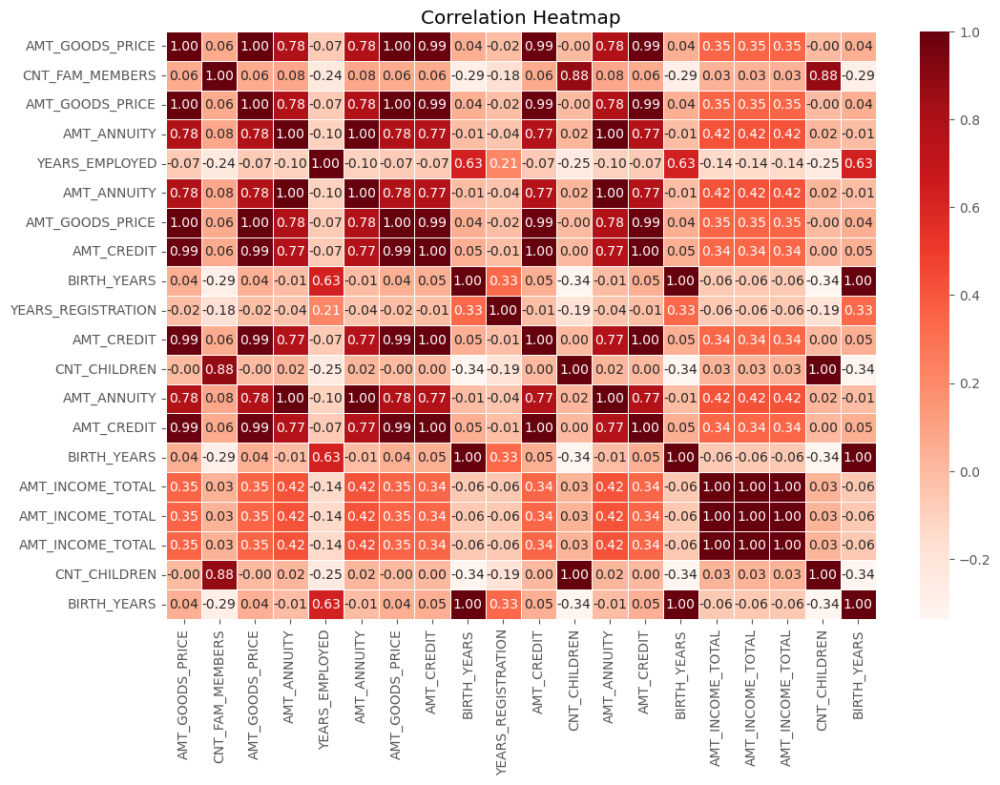

In [128]:
# HEAT MAPS
selected_columns = bivcol1_T0 + bivcol2_T0
subset_df = app_data_t0[selected_columns]

# Calculate the correlation matrix
correlation_matrix = subset_df.corr()

# Create a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='Reds', fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()


#### Analysis
##### From the above correlation heatmap, we can infere that the top 10 correlations are as per the previous table.
<pre>
1)AMT_GOODS_PRICE and AMT_CREDIT:High positive correlation suggests that as the price of goods increases, the credit amount also tends to increase. This could be expected in loan scenarios where individuals borrow more for more expensive purchases.

2)CNT_FAM_MEMBERS and CNT_CHILDREN:Positive correlation indicates that larger families tend to have more children.

3)AMT_ANNUITY and AMT_CREDIT:Positive correlation suggests that higher credit amounts are associated with higher annuity payments. This is expected, as loan amounts and associated payments are likely to be correlated.

4)YEARS_EMPLOYED and BIRTH_YEARS:Negative correlation might indicate that younger individuals tend to have fewer years of employment. This could be expected as people typically start working after a certain age.

5)AMT_INCOME_TOTAL and AMT_CREDIT:Positive correlation suggests that higher credit amounts are associated with higher total income. This is reasonable, as individuals with higher income may be eligible for larger loans.

6)YEARS_REGISTRATION and BIRTH_YEARS:Negative correlation may imply that individuals who registered more recently tend to be younger. This makes sense as newer registrations are likely associated with younger individuals.

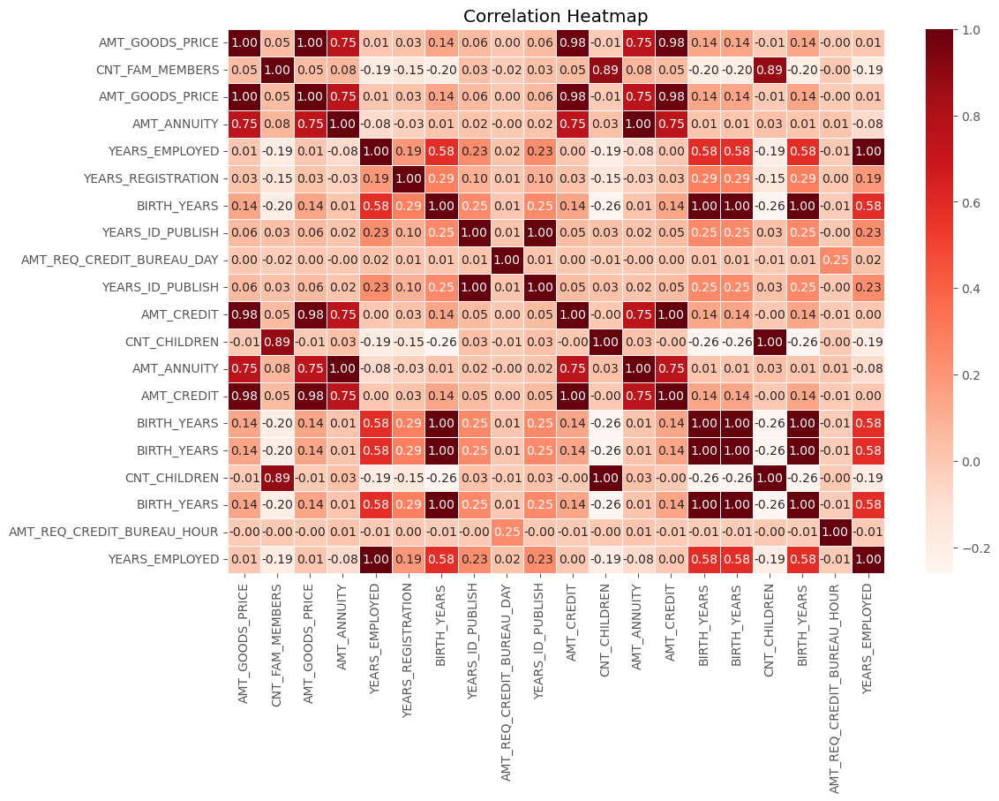

In [129]:
# Target 1 -Heatmaps

selected_columns = bivcol1_T1 + bivcol2_T1
subset_df = app_data_t1[selected_columns]

# Calculate the correlation matrix
correlation_matrix = subset_df.corr()

# Create a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='Reds', fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()


#### The top 10 correlations in Target 1 class is demonstrated by heatmaps as shown above.

The analysis for target 1 is quite similar to target 0 .

## Previous Application Data

### Data Understanding

In [130]:
# Reading the dataset
prev_app=pd.read_csv("previous_application.csv")

In [131]:
prev_app.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [132]:
prev_app.shape

(1670214, 37)

In [133]:
prev_app.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [134]:
prev_app.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1.670214e+06,1.670214e+06,774370.000000,5951.000000,5951.000000,1.670214e+06,1.670214e+06,1.297984e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.595512e+04,1.752339e+05,1.961140e+05,6.697402e+03,2.278473e+05,1.248418e+01,9.964675e-01,0.079637,0.188357,0.773503,-8.806797e+02,3.139511e+02,1.605408e+01,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,1.478214e+04,2.927798e+05,3.185746e+05,2.092150e+04,3.153966e+05,3.334028e+00,5.932963e-02,0.107823,0.087671,0.100879,7.790997e+02,7.127443e+03,1.456729e+01,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,0.034781,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,1.000000e+01,1.000000e+00,0.000000,0.160716,0.715645,-1.300000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,1.200000e+01,1.000000e+00,0.051605,0.189122,0.835095,-5.810000e+02,3.000000e+00,1.200000e+01,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,1.500000e+01,1.000000e+00,0.108909,0.193330,0.852537,-2.800000e+02,8.200000e+01,2.400000e+01,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,3.060045e+06,6.905160e+06,2.300000e+01,1.000000e+00,1.000000,1.000000,1.000000,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


## Data Cleaning

### Handling missing values

In [136]:
null_values=prev_app.isnull().sum()[prev_app.isnull().sum()>0]
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
null_values

AMT_ANNUITY                   372235
AMT_CREDIT                         1
AMT_DOWN_PAYMENT              895844
AMT_GOODS_PRICE               385515
RATE_DOWN_PAYMENT             895844
RATE_INTEREST_PRIMARY        1664263
RATE_INTEREST_PRIVILEGED     1664263
NAME_TYPE_SUITE               820405
CNT_PAYMENT                   372230
PRODUCT_COMBINATION              346
DAYS_FIRST_DRAWING            673065
DAYS_FIRST_DUE                673065
DAYS_LAST_DUE_1ST_VERSION     673065
DAYS_LAST_DUE                 673065
DAYS_TERMINATION              673065
NFLAG_INSURED_ON_APPROVAL     673065
dtype: int64

In [137]:
#Finding percentage of null values
percent_=prev_app.isnull().sum()/len(prev_app)*100
percent_

SK_ID_PREV                      0.000000
SK_ID_CURR                      0.000000
NAME_CONTRACT_TYPE              0.000000
AMT_ANNUITY                    22.286665
AMT_APPLICATION                 0.000000
AMT_CREDIT                      0.000060
AMT_DOWN_PAYMENT               53.636480
AMT_GOODS_PRICE                23.081773
WEEKDAY_APPR_PROCESS_START      0.000000
HOUR_APPR_PROCESS_START         0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
RATE_DOWN_PAYMENT              53.636480
RATE_INTEREST_PRIMARY          99.643698
RATE_INTEREST_PRIVILEGED       99.643698
NAME_CASH_LOAN_PURPOSE          0.000000
NAME_CONTRACT_STATUS            0.000000
DAYS_DECISION                   0.000000
NAME_PAYMENT_TYPE               0.000000
CODE_REJECT_REASON              0.000000
NAME_TYPE_SUITE                49.119754
NAME_CLIENT_TYPE                0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_PORTFOLIO                  0.000000
NAME_PRODUCT_TYP

In [138]:
# We can drop the columns having null values>40%

#Storing the index of columns that needs to fropped in a variable
Drop_col=percent_[percent_>=40].index
Drop_col

Index(['AMT_DOWN_PAYMENT', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_TYPE_SUITE', 'DAYS_FIRST_DRAWING',
       'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE',
       'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

In [139]:
#Dropping the columns having null values greater than 40%
prev_app = prev_app.drop(columns=Drop_col)
prev_app.shape

(1670214, 26)

In [140]:
impute=prev_app.isnull().sum()[prev_app.isnull().sum()>0]
impute

AMT_ANNUITY            372235
AMT_CREDIT                  1
AMT_GOODS_PRICE        385515
CNT_PAYMENT            372230
PRODUCT_COMBINATION       346
dtype: int64

In [144]:
prev_app.AMT_CREDIT.value_counts()

0.000          336768
45000.000       35051
225000.000      21094
450000.000      19954
135000.000      18720
180000.000      17085
90000.000       13781
270000.000       9842
900000.000       7432
67500.000        7245
95940.000        6449
143910.000       6386
157500.000       6237
112500.000       5938
675000.000       5348
239850.000       5229
254700.000       4863
765000.000       4779
71955.000        4530
47970.000        4508
512370.000       3802
491580.000       3800
360000.000       3781
1350000.000      3763
202500.000       3761
337500.000       3672
46485.000        3577
152820.000       3464
191880.000       3316
533160.000       3313
315000.000       3218
148365.000       3044
119925.000       2816
269550.000       2653
405000.000       2611
247275.000       2597
203760.000       2505
247500.000       2480
767664.000       2445
470790.000       2421
585000.000       2358
1546020.000      2335
744498.000       2277
540000.000       2167
197820.000       2136
92970.000 

In [146]:
prev_app.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'DAYS_DECISION',
       'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'],
      dtype='object')

In [147]:
# We can drop few of the columns as they are not needed for the analysis:

drop_=['HOUR_APPR_PROCESS_START','NFLAG_LAST_APPL_IN_DAY','DAYS_DECISION','SELLERPLACE_AREA',"WEEKDAY_APPR_PROCESS_START"]
prev_app.drop(columns=drop_,axis=1,inplace=True)

In [154]:
list_col=prev_app.columns

In [158]:
#Let's check if any further categorical columns can be removed.

for i in list_col:
    if prev_app[i].dtypes=="object":
        print(prev_app[i].value_counts(normalize=True)*100)
        print("\n")

Cash loans         44.757917
Consumer loans     43.656142
Revolving loans    11.565225
XNA                 0.020716
Name: NAME_CONTRACT_TYPE, dtype: float64


Y    99.49258
N     0.50742
Name: FLAG_LAST_APPL_PER_CONTRACT, dtype: float64


XAP                                 55.242083
XNA                                 40.588691
Repairs                              1.422872
Other                                0.934491
Urgent needs                         0.503648
Buying a used car                    0.172912
Building a house or an annex         0.161237
Everyday expenses                    0.144652
Medicine                             0.130163
Payments on other loans              0.115614
Education                            0.094180
Journey                              0.074182
Purchase of electronic equipment     0.063525
Buying a new car                     0.060591
Wedding / gift / holiday             0.057597
Buying a home                        0.051790
Car repairs              

### Dropping the following columns:
NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,NAME_SELLER_INDUSTRY,NAME_YIELD_GROUP
These columns has high percentage of XNA,XAP and NA values which is not helpful in analysis. Hence, we can ignore these columns.

In [159]:
drop_1=["NAME_PAYMENT_TYPE","CODE_REJECT_REASON","NAME_GOODS_CATEGORY","NAME_PORTFOLIO","NAME_PRODUCT_TYPE","NAME_SELLER_INDUSTRY","NAME_YIELD_GROUP"]
prev_app.drop(columns=drop_1,axis=1,inplace=True)

In [160]:
prev_app.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_GOODS_PRICE',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'NAME_CLIENT_TYPE', 'CHANNEL_TYPE',
       'CNT_PAYMENT', 'PRODUCT_COMBINATION'],
      dtype='object')

In [177]:
prev_app.drop(columns=["NAME_CASH_LOAN_PURPOSE"],axis=1,inplace=True)

In [178]:
impute1=prev_app.isnull().sum()[prev_app.isnull().sum()>0]
impute1

AMT_ANNUITY            372235
AMT_CREDIT                  1
AMT_GOODS_PRICE        385515
CNT_PAYMENT            372230
PRODUCT_COMBINATION       346
dtype: int64

### Handling Missing Values

#### 1)AMT_ANNUITY

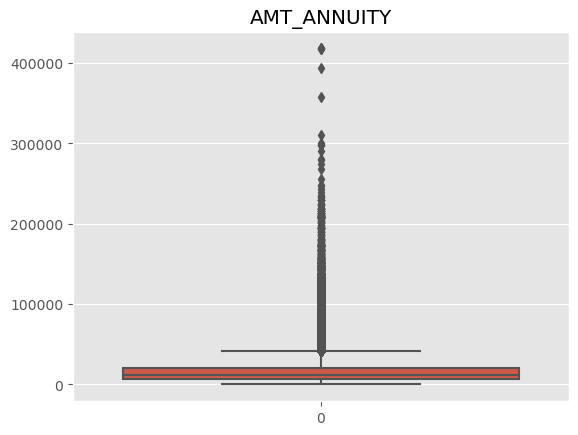

In [165]:
## AMT_ANNUITY is NUMERICAL type hence, we need to impute either mean or median. Median being the better option in case if any 
##outliers are there
sns.boxplot(prev_app.AMT_ANNUITY)
plt.title("AMT_ANNUITY")
plt.show()

NOTES: AMT_ANNUITY depends on other various factors like AMT_CREDIT,CONTRACT_TYPE,etc. We will analyse the same in further Univariate and Bivariate analysis

### 2)AMT_CREDIT

In [168]:
prev_app[prev_app["AMT_CREDIT"].isnull()]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,FLAG_LAST_APPL_PER_CONTRACT,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,NAME_CLIENT_TYPE,CHANNEL_TYPE,CNT_PAYMENT,PRODUCT_COMBINATION
1127152,2204450,438387,Revolving loans,0.0,0.0,NaN,NaN,Y,XAP,Approved,Repeater,Country-wide,0.0,Card Street


In [169]:
##The null value might be due to mistake in data entry. We can impute the same with median .

### 3)AMT_GOODS_PRICE 

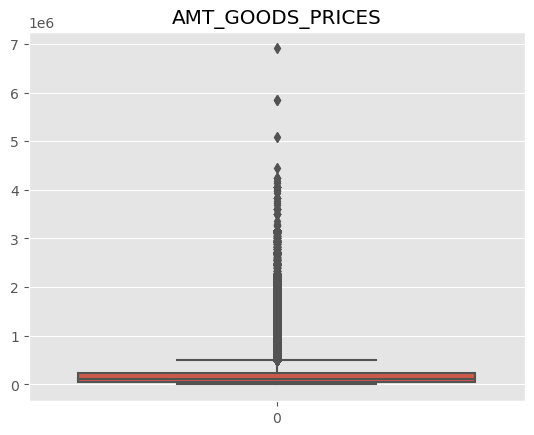

In [170]:
sns.boxplot(prev_app.AMT_GOODS_PRICE)
plt.title("AMT_GOODS_PRICES")
plt.show()

Due to large number of outliers, we can impute the values with median as mean won't give correct results fpr analysis. However, not imputing as instructed.

### 4)CNT_PAYMENT 

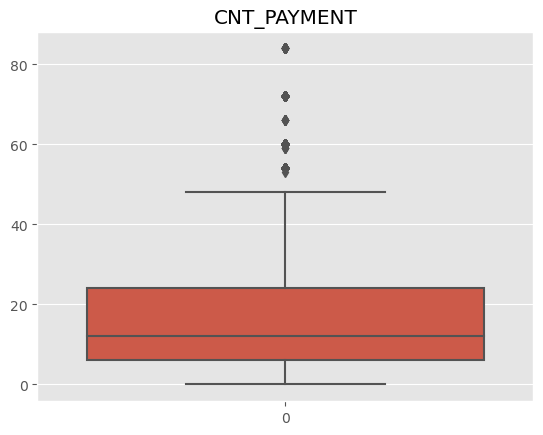

In [171]:
sns.boxplot(prev_app.CNT_PAYMENT)
plt.title("CNT_PAYMENT")
plt.show()
# These can be substituted with median 

### UNIVARIATE ANALYSIS

### 1) Categorical variables

Cash loans         0.447579
Consumer loans     0.436561
Revolving loans    0.115652
XNA                0.000207
Name: NAME_CONTRACT_TYPE, dtype: float64


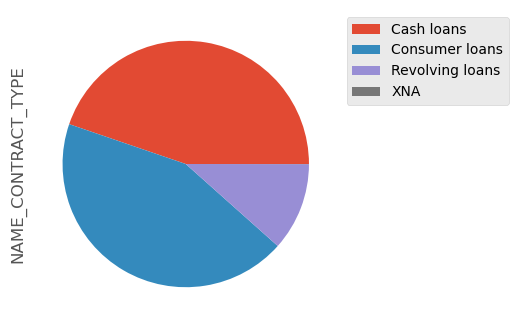

Y    0.994926
N    0.005074
Name: FLAG_LAST_APPL_PER_CONTRACT, dtype: float64


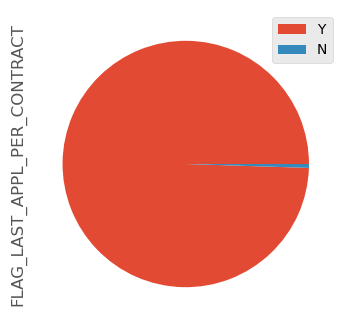

Approved        0.620747
Canceled        0.189388
Refused         0.174036
Unused offer    0.015828
Name: NAME_CONTRACT_STATUS, dtype: float64


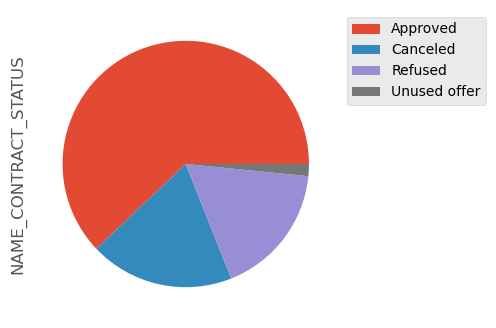

Repeater     0.737188
New          0.180434
Refreshed    0.081217
XNA          0.001162
Name: NAME_CLIENT_TYPE, dtype: float64


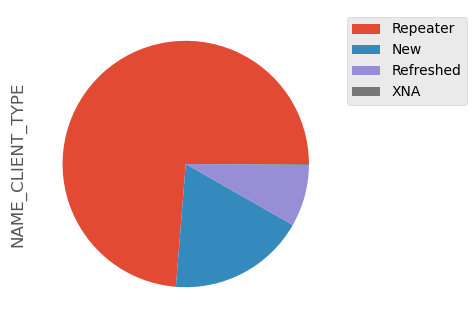

Credit and cash offices       0.431063
Country-wide                  0.296184
Stone                         0.126980
Regional / Local              0.064978
Contact center                0.042687
AP+ (Cash loan)               0.034155
Channel of corporate sales    0.003682
Car dealer                    0.000271
Name: CHANNEL_TYPE, dtype: float64


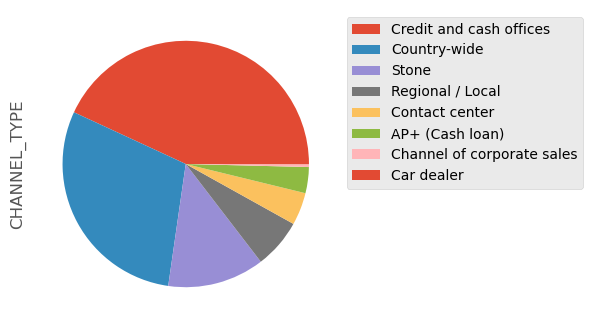

Cash                              0.171265
POS household with interest       0.157870
POS mobile with interest          0.132148
Cash X-Sell: middle               0.086164
Cash X-Sell: low                  0.077999
Card Street                       0.067420
POS industry with interest        0.059186
POS household without interest    0.049649
Card X-Sell                       0.048257
Cash Street: high                 0.035715
Cash X-Sell: high                 0.035512
Cash Street: middle               0.020755
Cash Street: low                  0.020261
POS mobile without interest       0.014421
POS other with interest           0.014300
POS industry without interest     0.007547
POS others without interest       0.001530
Name: PRODUCT_COMBINATION, dtype: float64


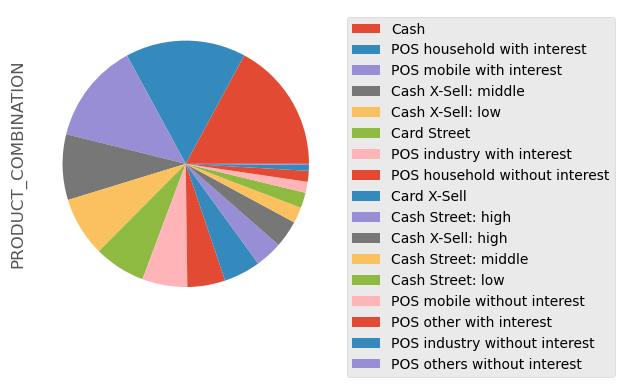

In [179]:
obj_=prev_app.columns
for i in obj_:
    if prev_app[i].dtypes=="object":
        print(prev_app[i].value_counts(normalize=True))
        plt.figure(figsize=[4,4])
        prev_app[i].value_counts(normalize=True).plot.pie(labeldistance=None)
        plt.legend(bbox_to_anchor=(1,1))
        plt.show()

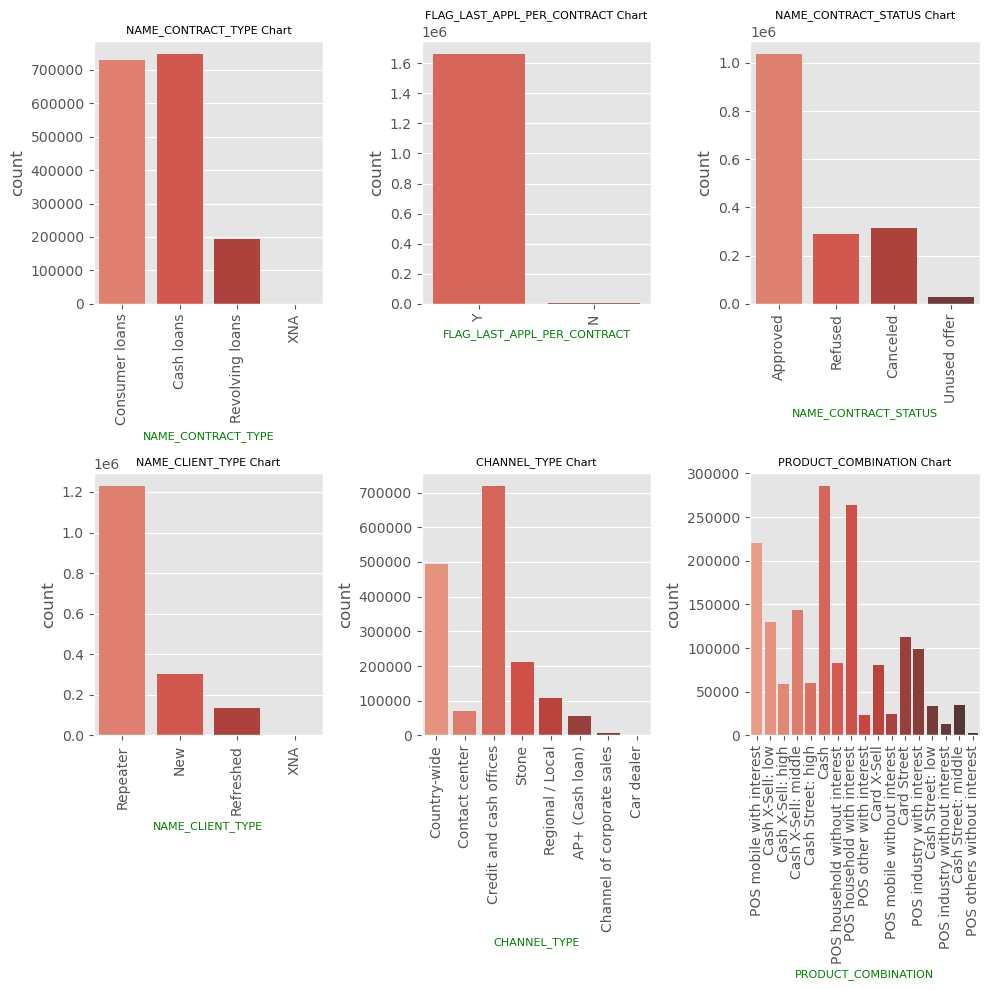

In [188]:
#Initialising number of rows, columns and counter- Bar Charts
rows=2
cols=3
c=1
plt.figure(figsize=[10,10])
# Iterate over each categorical column
for i in obj_:
    if prev_app[i].dtypes=="object":
        plt.subplot(rows,cols,c)
        plt.title(i+" "+"Chart", fontsize=8)
        plt.xlabel(i,fontsize=8,color="Green")
        plt.xticks(rotation=90)
        sns.countplot(x=i,data=prev_app,palette="Reds_d")
        c+=1
# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()

#### ANALYSIS:
<pre>
1) NAME_CONTRACT_TYPE:In this dataframe, a new type of loan called "Consumer Loan" has been introduced, which was not present in the Application data frame.
2)FLAG_LAST_APPL_PER_CONTRACT-Applications are set to 'Yes' for the maximum application date within a contract which may indicate potential duplicates or errors.Reviewing these cases can help identify instances where multiple applications were submitted for a single contract, either by mistake or due to clerical errors.
3)NAME_CONTRACT_STATUS-Approved loans constitute the majority, accounting for 62% of the dataset.The remaining percentage includes refused loans, cancelled loans, and unused offers.The data exhibits an imbalance in terms of loan approval status, with a significant majority being approved.
4)NAME_CLIENT_TYPE-73% of the applicants are classified as "Repeater," indicating that a substantial portion of clients has previously taken loans.
5)CHANNEL_TYPE-Most of them were aquired in Credit and cash offices


### 2) Numerical Variables

In [189]:
prev_app.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 13 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_GOODS_PRICE              1284699 non-null  float64
 7   FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 8   NAME_CONTRACT_STATUS         1670214 non-null  object 
 9   NAME_CLIENT_TYPE             1670214 non-null  object 
 10  CHANNEL_TYPE                 1670214 non-null  object 
 11  CNT_PAYMENT                  1297984 non-null  float64
 12  PRODUCT_COMBINATION          1669868 non-n

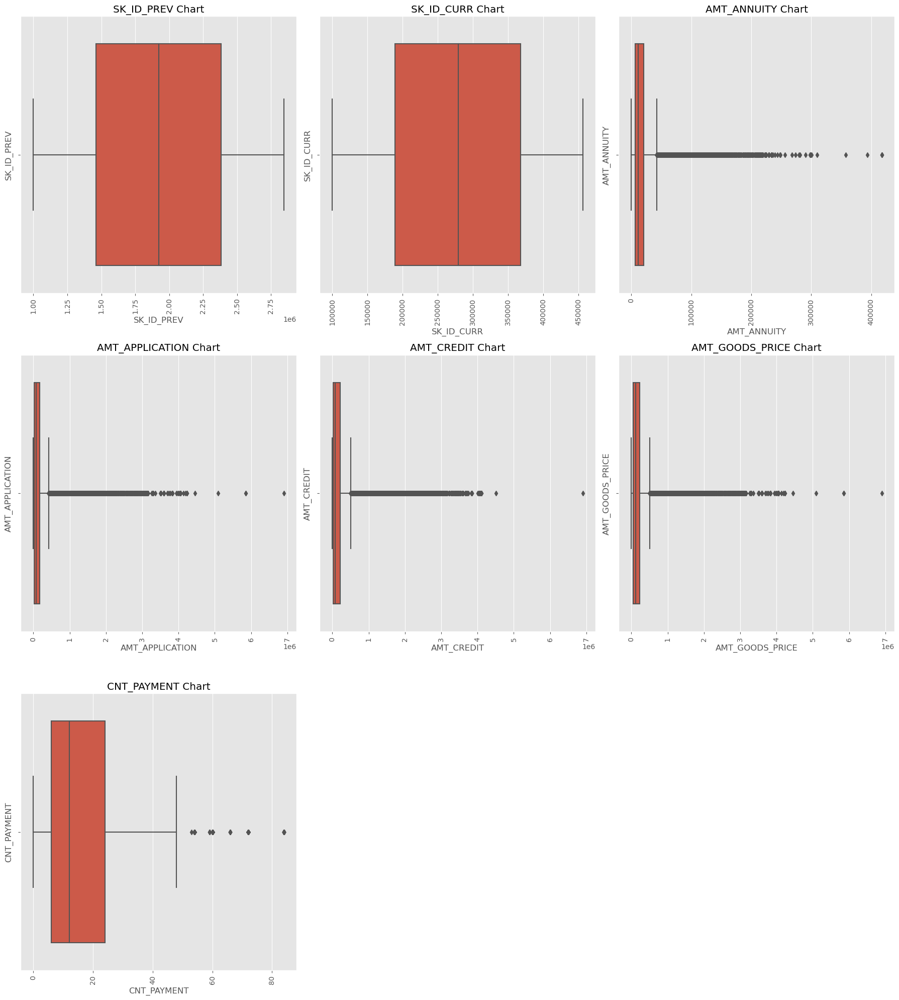

In [192]:
'''INT DATA and FLOAT DATA'''
list_floatint =prev_app.columns[(prev_app.dtypes == "float64")|(prev_app.dtypes == "int64")].tolist()

#Initialising number of rows, columns and counter
rows=3
cols=3
c=1
plt.figure(figsize=[18,20])
# Iterate over each Numerical column
for i in list_floatint:
    plt.subplot(rows,cols,c)
    plt.title(i+" "+"Chart")
    plt.xticks(rotation=90)
    plt.ylabel(i)
    sns.boxplot(x=i,data=prev_app)
    c+=1
# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()

In [193]:
# There are high number of outliers for continuous variables as seen in these plots. These can be treated by binning, capping or removing them if the percentage of outliers in rows are lesser.


### TOP 10 CORRELATIONS

In [198]:
prev_corr=prev_app[["SK_ID_PREV","SK_ID_CURR","AMT_ANNUITY","AMT_APPLICATION","AMT_CREDIT","AMT_GOODS_PRICE","CNT_PAYMENT"]]
# Calculate the correlation matrix for numerical variables
corr = prev_corr.corr().abs()

# Extract the upper triangle of the correlation matrix (excluding the diagonal)
upper_triangle = np.triu(np.ones(corr.shape), k=1).astype(bool)
corr_df = corr.where(upper_triangle).unstack().reset_index()

# Rename columns for clarity
corr_df.columns = ['Column1', 'Column2', 'Correlation']

# Drop rows with missing (NaN) values in the 'Correlation' column
corr_df.dropna(subset=['Correlation'], inplace=True)

# Calculate absolute correlation values
corr_df['Abs_Correlation'] = corr_df['Correlation'].abs()

# Sort the DataFrame by absolute correlation values in descending order
corr_df = corr_df.sort_values(by='Abs_Correlation', ascending=False)

# Display the top 10 correlations
top_10_correlations = corr_df.head(10)
print(top_10_correlations)

            Column1          Column2  Correlation  Abs_Correlation
38  AMT_GOODS_PRICE  AMT_APPLICATION     0.999884         0.999884
39  AMT_GOODS_PRICE       AMT_CREDIT     0.993087         0.993087
31       AMT_CREDIT  AMT_APPLICATION     0.975824         0.975824
37  AMT_GOODS_PRICE      AMT_ANNUITY     0.820895         0.820895
30       AMT_CREDIT      AMT_ANNUITY     0.816429         0.816429
23  AMT_APPLICATION      AMT_ANNUITY     0.808872         0.808872
45      CNT_PAYMENT  AMT_APPLICATION     0.680630         0.680630
46      CNT_PAYMENT       AMT_CREDIT     0.674278         0.674278
47      CNT_PAYMENT  AMT_GOODS_PRICE     0.672129         0.672129
44      CNT_PAYMENT      AMT_ANNUITY     0.394535         0.394535


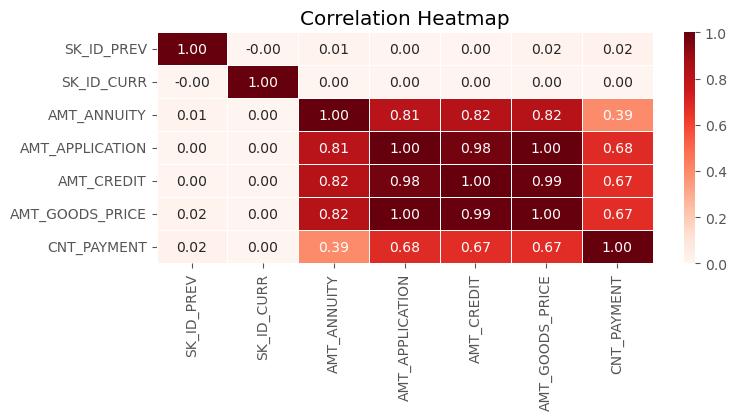

In [273]:
# HEAT MAP
selected_columns = ["SK_ID_PREV","SK_ID_CURR","AMT_ANNUITY","AMT_APPLICATION","AMT_CREDIT","AMT_GOODS_PRICE","CNT_PAYMENT"]
subset_df = prev_app[selected_columns]

# Calculate the correlation matrix
correlation_matrix = subset_df.corr()

# Create a heatmap
plt.figure(figsize=(8, 3))
sns.heatmap(correlation_matrix, annot=True, cmap='Reds', fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()


In [200]:
# We will do the analysis of these heat maps while performing bivariate analysis.

### BIVARIATE ANALYSIS

#### 1)NUMERICAL-NUMERICAL

In [202]:
prev_app.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,FLAG_LAST_APPL_PER_CONTRACT,NAME_CONTRACT_STATUS,NAME_CLIENT_TYPE,CHANNEL_TYPE,CNT_PAYMENT,PRODUCT_COMBINATION
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,17145.0,Y,Approved,Repeater,Country-wide,12.0,POS mobile with interest
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,607500.0,Y,Approved,Repeater,Contact center,36.0,Cash X-Sell: low
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,112500.0,Y,Approved,Repeater,Credit and cash offices,12.0,Cash X-Sell: high
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,450000.0,Y,Approved,Repeater,Credit and cash offices,12.0,Cash X-Sell: middle
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,337500.0,Y,Refused,Repeater,Credit and cash offices,24.0,Cash Street: high


<Figure size 1800x600 with 0 Axes>

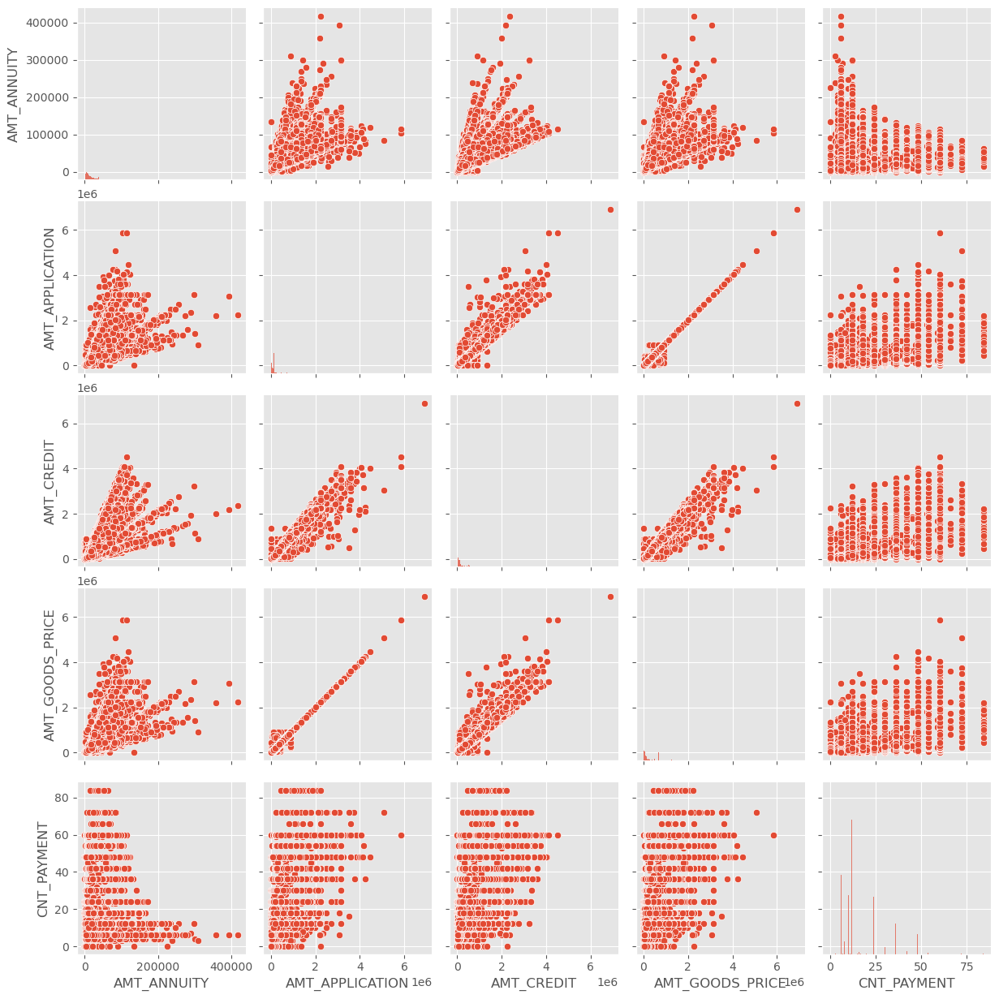

In [203]:
#Some of the important Numerical Variables
Num_list=["AMT_ANNUITY","AMT_APPLICATION","AMT_CREDIT","AMT_GOODS_PRICE","CNT_PAYMENT"]
plt.figure(figsize=[18,6])
sns.pairplot(prev_app[Num_list])
plt.show()  

#### ANALYSIS
<pre>
1)High Correlations:AMT_GOODS_PRICE, AMT_ANNUITY, and AMT_APPLICATION show high correlations, which aligns with expectations for loan applications related to purchasing goods.
2)AMT_CREDIT Correlation:AMT_CREDIT exhibits a high correlation with AMT_GOODS_PRICE, indicating a strong connection between the requested loan amount and the price of the goods being financed.
3)CNT_PAYMENT Observation:Despite expectations, CNT_PAYMENT does not display a strong correlation with AMT_CREDIT.

### 2)Categorical-Categorical

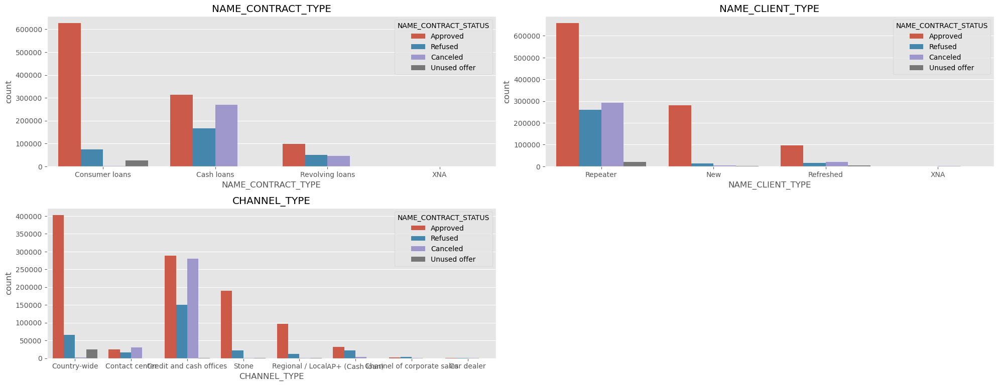

In [204]:
cat_List=["NAME_CONTRACT_TYPE","NAME_CLIENT_TYPE","CHANNEL_TYPE"]
rows = 4  # number of rows
cols = 2  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(20,15))

for i in cat_List:

    plt.subplot(rows, cols, c)
    plt.title(i)
    plt.xlabel(i)
    sns.countplot(x=i, data=prev_app, hue='NAME_CONTRACT_STATUS')
    c = c + 1

fig.tight_layout()
plt.show()


#### ANALYSIS
<pre> 
1)NAME_CONTRACT_TYPE-STATUS-->
  Most approved loans are Consumer Loans which are not present in appliacation data(Current loan type).Also, no Canceled offer
  For Cash loans there are no unused offer.
2)NAME_CLIENT_TYPE-STATUS-->
  Repeaters category have maximum approved, unused, cancelled and refused offers.
3)CHANNEL_TYPE-STATUS-->
  Country-Wide has maximum Approved offers and Credit and Cash offices has maximum Cancelled offer. This can be viewed upon for   future inspections

  
                            

### 3) Numerical-Categorical 

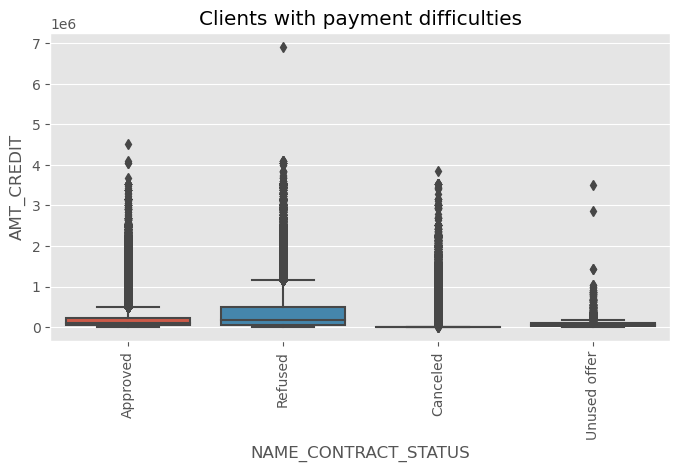

In [205]:
#plot for 'AMT_CREDIT' vs 'NAME_CONTRACT_STATUS'
plt.figure(figsize=[8,4])
sns.boxplot(data=prev_app,y='AMT_CREDIT',x='NAME_CONTRACT_STATUS')
plt.title('Clients with payment difficulties')
plt.xticks(rotation=90)
plt.show()

#### INFERENCE:
1) Higher Credit amount has lead to refused status of the loan.
2) Quartile of Cancelled offer is minimum

## MERGE APPLICATION DATA AND PREVIOUS APPLICATION DATA

In [208]:
#Application Data

app_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,BIRTH_YEARS,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE_GROUP,Income_category,Credit_Group
0,100002,1,Cash loans,Male,0,1,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,26,2,10.0,6,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,1134.0,0.0,0.0,0.0,0.0,0.0,1.0,26-35,High,Low
1,100003,0,Cash loans,Female,0,0,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,46,4,4.0,1,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,NaN,828.0,0.0,0.0,0.0,0.0,0.0,0.0,46-55,Very High,Very High
2,100004,0,Revolving loans,Male,1,1,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,53,1,12.0,7,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,815.0,0.0,0.0,0.0,0.0,0.0,0.0,46-55,Very low,Very Low
3,100006,0,Cash loans,Female,0,1,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,53,9,27.0,7,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,NaN,617.0,NaN,NaN,NaN,NaN,NaN,NaN,46-55,low,Low
4,100007,0,Cash loans,Male,0,1,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,55,9,12.0,10,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,NaN,1106.0,0.0,0.0,0.0,0.0,0.0,0.0,46-55,low,Low


In [209]:
# previous application dataset

prev_app.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,FLAG_LAST_APPL_PER_CONTRACT,NAME_CONTRACT_STATUS,NAME_CLIENT_TYPE,CHANNEL_TYPE,CNT_PAYMENT,PRODUCT_COMBINATION
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,17145.0,Y,Approved,Repeater,Country-wide,12.0,POS mobile with interest
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,607500.0,Y,Approved,Repeater,Contact center,36.0,Cash X-Sell: low
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,112500.0,Y,Approved,Repeater,Credit and cash offices,12.0,Cash X-Sell: high
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,450000.0,Y,Approved,Repeater,Credit and cash offices,12.0,Cash X-Sell: middle
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,337500.0,Y,Refused,Repeater,Credit and cash offices,24.0,Cash Street: high


Here, SK_ID_CURR is the common column between both the set . Hence, we can use it as a primary key to join both the data sets.

In [220]:
Merged_data = pd.merge(left=app_data, right=prev_app,how='inner', on='SK_ID_CURR',suffixes=['_PREV','_CURR'])
Merged_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_PREV,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_PREV,AMT_ANNUITY_PREV,AMT_GOODS_PRICE_PREV,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,BIRTH_YEARS,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE_GROUP,Income_category,Credit_Group,SK_ID_PREV,NAME_CONTRACT_TYPE_CURR,AMT_ANNUITY_CURR,AMT_APPLICATION,AMT_CREDIT_CURR,AMT_GOODS_PRICE_CURR,FLAG_LAST_APPL_PER_CONTRACT,NAME_CONTRACT_STATUS,NAME_CLIENT_TYPE,CHANNEL_TYPE,CNT_PAYMENT,PRODUCT_COMBINATION
0,100002,1,Cash loans,Male,0,1,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,26,2,10.0,6,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,1134.0,0.0,0.0,0.0,0.0,0.0,1.0,26-35,High,Low,1038818,Consumer loans,9251.775,179055.0,179055.0,179055.0,Y,Approved,New,Stone,24.0,POS other with interest
1,100003,0,Cash loans,Female,0,0,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,46,4,4.0,1,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,NaN,828.0,0.0,0.0,0.0,0.0,0.0,0.0,46-55,Very High,Very High,1810518,Cash loans,98356.995,900000.0,1035882.0,900000.0,Y,Approved,Repeater,Credit and cash offices,12.0,Cash X-Sell: low
2,100003,0,Cash loans,Female,0,0,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,46,4,4.0,1,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,NaN,828.0,0.0,0.0,0.0,0.0,0.0,0.0,46-55,Very High,Very High,2636178,Consumer loans,64567.665,337500.0,348637.5,337500.0,Y,Approved,Refreshed,Stone,6.0,POS industry with interest
3,100003,0,Cash loans,Female,0,0,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,46,4,4.0,1,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,NaN,828.0,0.0,0.0,0.0,0.0,0.0,0.0,46-55,Very High,Very High,2396755,Consumer loans,6737.310,68809.5,68053.5,68809.5,Y,Approved,Refreshed,Country-wide,12.0,POS household with interest
4,100004,0,Revolving loans,Male,1,1,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,53,1,12.0,7,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,815.0,0.0,0.0,0.0,0.0,0.0,0.0,46-55,Very low,Very Low,1564014,Consumer loans,5357.250,24282.0,20106.0,24282.0,Y,Approved,New,Regional / Local,4.0,POS mobile without interest


In [221]:
Merged_data.shape

(1413646, 58)

In [222]:
Merged_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413646 entries, 0 to 1413645
Data columns (total 58 columns):
 #   Column                       Non-Null Count    Dtype   
---  ------                       --------------    -----   
 0   SK_ID_CURR                   1413646 non-null  int64   
 1   TARGET                       1413646 non-null  category
 2   NAME_CONTRACT_TYPE_PREV      1413646 non-null  object  
 3   CODE_GENDER                  1413646 non-null  object  
 4   FLAG_OWN_CAR                 1413646 non-null  category
 5   FLAG_OWN_REALTY              1413646 non-null  category
 6   CNT_CHILDREN                 1413646 non-null  int64   
 7   AMT_INCOME_TOTAL             1413646 non-null  float64 
 8   AMT_CREDIT_PREV              1413646 non-null  float64 
 9   AMT_ANNUITY_PREV             1413553 non-null  float64 
 10  AMT_GOODS_PRICE_PREV         1412438 non-null  float64 
 11  NAME_TYPE_SUITE              1410120 non-null  object  
 12  NAME_INCOME_TYPE            

In [223]:
Merged_data.describe()

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_PREV,AMT_ANNUITY_PREV,AMT_GOODS_PRICE_PREV,REGION_POPULATION_RELATIVE,BIRTH_YEARS,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,CNT_FAM_MEMBERS,HOUR_APPR_PROCESS_START,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,SK_ID_PREV,AMT_ANNUITY_CURR,AMT_APPLICATION,AMT_CREDIT_CURR,AMT_GOODS_PRICE_CURR,CNT_PAYMENT
count,1.413646e+06,1.413646e+06,1.413646e+06,1.413646e+06,1.413553e+06,1.412438e+06,1.413646e+06,1.413646e+06,1.413646e+06,1.413646e+06,1.413646e+06,1.413646e+06,1.413646e+06,1.411825e+06,1.171804e+06,1.413646e+06,1.250019e+06,1.250019e+06,1.250019e+06,1.250019e+06,1.250019e+06,1.250019e+06,1.413646e+06,1.106438e+06,1.413646e+06,1.413645e+06,1.094130e+06,1.106443e+06
mean,2.784832e+05,4.048758e-01,1.733153e+05,5.875603e+05,2.701726e+04,5.277191e+05,2.074942e-02,4.521142e+01,1.993619e+02,1.421416e+01,8.821022e+00,2.150474e+00,1.198421e+01,5.114219e-01,4.897079e-01,1.084702e+03,6.203106e-03,6.817496e-03,3.856741e-02,3.013434e-01,3.615369e-01,2.912543e+00,1.922738e+06,1.583715e+04,1.752422e+05,1.963529e+05,2.264502e+05,1.605202e+01
std,1.028121e+05,7.173327e-01,1.985770e+05,3.849227e+05,1.395134e+04,3.532474e+05,1.334706e-02,1.190204e+01,3.922496e+02,9.725652e+00,4.129207e+00,9.006687e-01,3.232177e+00,1.911196e-01,1.965344e-01,7.999449e+02,8.188666e-02,1.065296e-01,2.136611e-01,9.802564e-01,9.257282e-01,2.199801e+00,5.327159e+05,1.472502e+04,2.936238e+05,3.194835e+05,3.159400e+05,1.456665e+01
min,1.000020e+05,0.000000e+00,2.565000e+04,4.500000e+04,1.615500e+03,4.050000e+04,2.900000e-04,2.100000e+01,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,8.173617e-08,5.272652e-04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000001e+06,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.893670e+05,0.000000e+00,1.125000e+05,2.700000e+05,1.682100e+04,2.385000e+05,1.003200e-02,3.500000e+01,3.000000e+00,6.000000e+00,5.000000e+00,2.000000e+00,1.000000e+01,3.890736e-01,3.441550e-01,3.960000e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.461337e+06,6.257700e+03,1.975050e+04,2.487870e+04,4.982400e+04,6.000000e+00
50%,2.789920e+05,0.000000e+00,1.575000e+05,5.084955e+05,2.492550e+04,4.500000e+05,1.885000e-02,4.400000e+01,7.000000e+00,1.300000e+01,1.000000e+01,2.000000e+00,1.200000e+01,5.627572e-01,5.100895e-01,1.011000e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.000000e+00,1.922686e+06,1.122354e+04,7.087050e+04,8.059500e+04,1.102455e+05,1.200000e+01
75%,3.675610e+05,1.000000e+00,2.070000e+05,8.079840e+05,3.454200e+04,6.795000e+05,2.866300e-02,5.500000e+01,1.800000e+01,2.100000e+01,1.200000e+01,3.000000e+00,1.400000e+01,6.606770e-01,6.479769e-01,1.683000e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00,2.384010e+06,2.041968e+04,1.800000e+05,2.156400e+05,2.295000e+05,2.400000e+01
max,4.562550e+05,1.900000e+01,1.170000e+08,4.050000e+06,2.250000e+05,4.050000e+06,7.250800e-02,7.000000e+01,1.000000e+03,6.800000e+01,2.000000e+01,2.000000e+01,2.300000e+01,8.549997e-01,8.960095e-01,4.292000e+03,4.000000e+00,9.000000e+00,8.000000e+00,2.700000e+01,2.610000e+02,2.500000e+01,2.845381e+06,4.180581e+05,5.850000e+06,4.509688e+06,5.850000e+06,8.400000e+01


### Splitting the Merged_data into two dataframes-i)Target=0 ii) Target=1



In [241]:
Merged_data_t0=Merged_data[Merged_data['TARGET']==0]
Merged_data_t1=Merged_data[Merged_data['TARGET']==1]

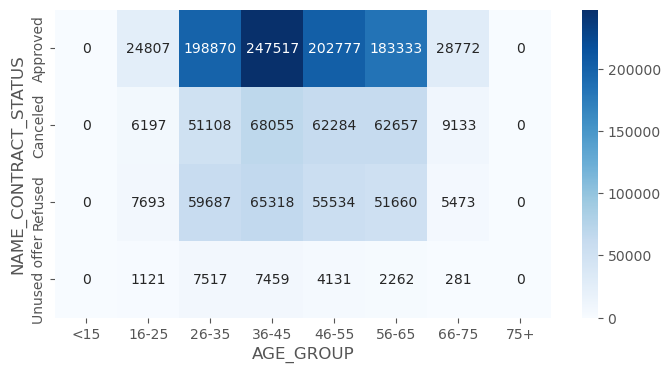

In [278]:
#Checking "NAME_CONTRACT_STATUS", "AGE_GROUP",aggregating on Target

result=pd.pivot_table(data=Merged_data,index="NAME_CONTRACT_STATUS",columns="AGE_GROUP",values='TARGET', aggfunc="count")
result
plt.figure(figsize=(8,4))
sns.heatmap(result,annot=True,cmap='Blues', fmt="g")
plt.show()

### ANALYSIS
<pre>
1)If the higher counts are concentrated in the "Target 1" column (indicating defaulters), it suggests that certain combinations of "NAME_CONTRACT_STATUS" and "AGE_GROUP" have a higher correlation with loan defaults. 
2)approved loans in age groups 25-35 and 35-45 have higher defaults implies that, even though these applicants were initially approved, they exhibit a higher risk of defaulting.
3)The observation that refused, cancelled, or unused loans in previous applications are associated with defaults in the current application is significant. It suggests a potential pattern where applicants whose previous applications were refused or cancelled are more likely to default in the current application. 

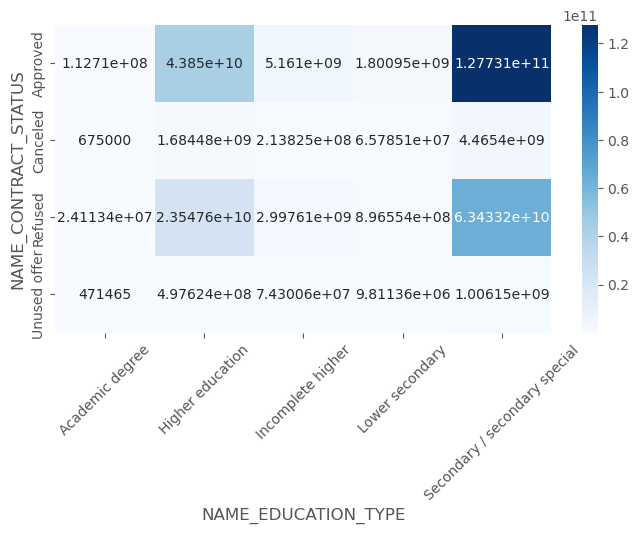

In [280]:
#Checking "NAME_CONTRACT_STATUS", "EDUCATION_TYPE",aggregating on AMT_CREDIT
result1=pd.pivot_table(data=Merged_data,index="NAME_CONTRACT_STATUS",columns="NAME_EDUCATION_TYPE",values='AMT_CREDIT_CURR', aggfunc="sum")
plt.figure(figsize=(8,4))
sns.heatmap(result1,annot=True,cmap='Blues', fmt="g")
plt.xticks(rotation=45)
plt.show()

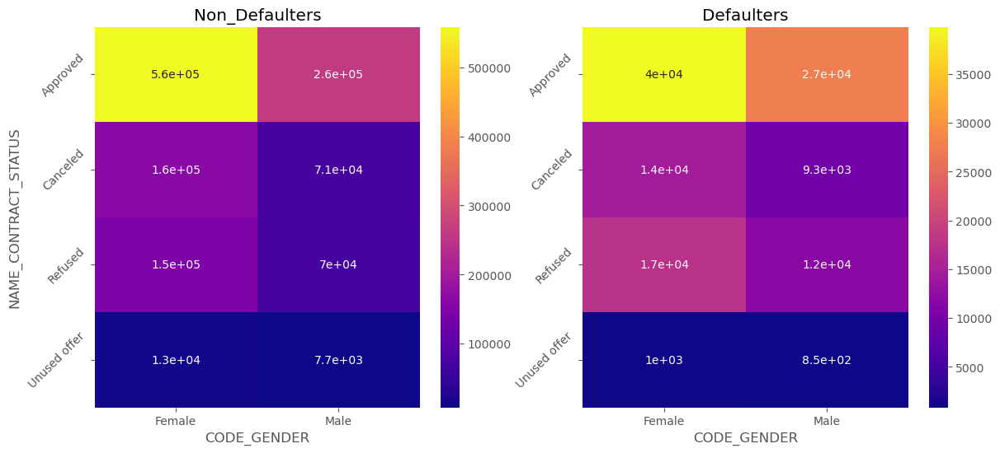

In [261]:

plt.figure(figsize=(14,6)) 

plt.subplot(1,2,1)
contract_type_wise_contarct_type = Merged_data_t0.groupby(['NAME_CONTRACT_STATUS'])["CODE_GENDER"].value_counts().unstack()
sns.heatmap(data=contract_type_wise_contarct_type, annot=True, cmap='plasma')
plt.title('Non_Defaulters')
plt.yticks(rotation=45)


plt.subplot(1,2,2)
contract_type_wise_contarct_type = Merged_data_t1.groupby(['NAME_CONTRACT_STATUS'])["CODE_GENDER"].value_counts().unstack()
sns.heatmap(data=contract_type_wise_contarct_type, annot=True, cmap='plasma')
plt.title('Defaulters')
plt.yticks(rotation=45)
plt.ylabel('')
plt.show()

### ANALYSIS

1)Number of female clients is more who Refused loans as compared to male clients for "DEFAULTERS"
2)There is very less difference between male and female clients with approved loan for 'DEFAULTERS'

Text(0.5, 1.0, 'Defaulters')

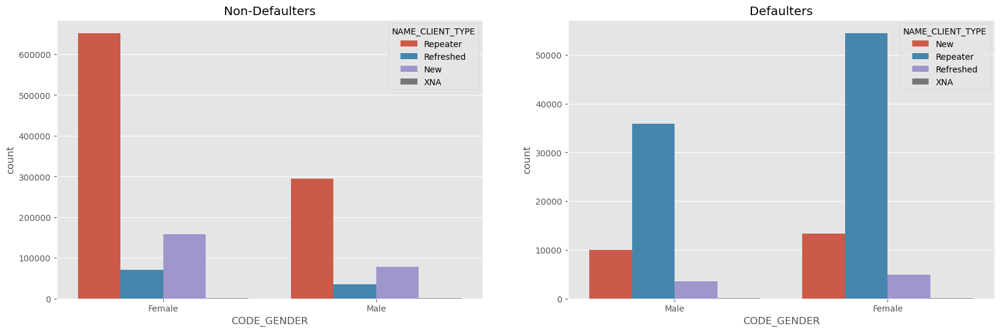

In [262]:
###Plot the graphs of Distribution of 'NAME_CLIENT_TYPE' with 'CODE_GENDER'

plt.figure(figsize=(20,6)) 

plt.subplot(1,2,1)
sns.countplot(data=Merged_data_t0,x='CODE_GENDER',hue='NAME_CLIENT_TYPE')
plt.title('Non-Defaulters')

plt.subplot(1,2,2)
sns.countplot(data=Merged_data_t1,x='CODE_GENDER',hue='NAME_CLIENT_TYPE')
plt.title('Defaulters')

#### ANALYSIS

1)Repeater female clients are higher in Non-Defaulters. Female tends to repay the loans without any delay and are generally repeaters.
2)Number of Male and Female Refreshed clients is very less for Clients with payment difficulities as comparted to New and Repeater clients

## CONCLUSION

### Decisive defaulters and non-defaulters in future:
<PRE>
1)Defaulters:
    
OCCUPATION_TYPE:Labourers, Drivers, etc have higher difficulty in repaying loans.
FAMILY_STATUS: Most commonly Married, single applicants faces difficulty in repaying loans.
Contract_type:More number of Cash loans are provided by bank in comparison to Revolving loan post chances to get defaulted increases
INCOME_GROUP-Low income group tends to get defaulted more
GENDER-Male applicants defaulting ratio is higher.
AGE_GROUP-25-45 year age group are generally unable to repay the loans also the amount credited are higher in this case.
CNT_CHILDREN- Higher Number of Children are mostly unable to repay the loans if the income is lesser.

NOTE:Previous applications with Refused, Cancelled, Unused loans also have default which is a matter of concern.   This indicates that the financial company had Refused/Cancelled previous application but has approved the current and is  facing default on these. 

2)Non-Defaulters:

EDUCATION_TYPE: Applicants having academic degree has lower rate of defaults
INCOME_TYPE: Students have no defaults.
BIRTH_YEARS: Applicants above age 60 are likely to default lesser .
CNT_CHILDREN:Applicants having Children less than 2 are generally repaying the loans.
AMT_INCOME: Applicants having income higher than 7 lakhs are likely to default lesser.

### Additional Insights:
<PRE>
1)Unused Applications and Lower Loan Amounts:The observation that unused applications tend to have lower loan amounts suggests a potential reason for not utilizing the approved loans. It could be that applicants requested a loan amount but, upon approval, did not proceed with utilizing the entire approved amount. 
2)Extra Weightage for Female Applicants:The statement suggests a recommendation to give extra weightage to female applicants since they have a lower default rate. This is a valid strategy in risk assessment, indicating that female applicants may, on average, present a lower risk of default.
3)Income: Having lesser income i.e.300000 should be given loans at higher interest rates
4)CNT_CHILDREN: 4+ Children applicants should be given loans at higher interest rate to mitigate the defaulters
5)80%-90% of previous cancelled applicants have currently repayed the loans. Need to check this as this might affect business.